## General information

This kernel is created using data of `Predicting Molecular Properties` competition.
We have information about atom couples in molecules and need to predict `scalar_coupling_constant` between these atoms.

![](http://www.et.byu.edu/~rowley/VLEfinal/methane_dimer.gif)

In this kernel I'll do EDA and will try some approaches to modelling.

*Work still in progress*


~Thanks to the new kaggle update we can write code in kernels and import it. This is much more convenient and useful. I'm moving all the functions I can into this script: https://www.kaggle.com/artgor/artgor-utils So if you see somewhere code like artgot_utils.function_name(parameters) - it is from this script~
**Important**:
It seems that after forking the utility script isn't copied, so I have decided to move all the functions back into the kernel. But utility kernel can't be removed from the kernel... I hope I was able to deal with it.

importing libraries

In [1]:
import numpy as np
import pandas as pd
import os

import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm_notebook
from sklearn.preprocessing import StandardScaler
from sklearn.svm import NuSVR, SVR
from sklearn.metrics import mean_absolute_error
pd.options.display.precision = 15

import lightgbm as lgb
import xgboost as xgb
import time
import datetime
from catboost import CatBoostRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold, KFold, RepeatedKFold
from sklearn import metrics
from sklearn import linear_model
import gc
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

from IPython.display import HTML
import json
import altair as alt

import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline

alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

all the fuctions

In [2]:
import os
import time
import datetime
import json
import gc
from numba import jit

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm_notebook

import lightgbm as lgb
import xgboost as xgb
from catboost import CatBoostRegressor, CatBoostClassifier
from sklearn import metrics

from itertools import product

import altair as alt
#from altair.vega import v3
from IPython.display import HTML

# using ideas from this kernel: https://www.kaggle.com/notslush/altair-visualization-2018-stackoverflow-survey
'''
def prepare_altair():
    """
    Helper function to prepare altair for working.
    """

    vega_url = 'https://cdn.jsdelivr.net/npm/vega@' + v3.SCHEMA_VERSION
    vega_lib_url = 'https://cdn.jsdelivr.net/npm/vega-lib'
    vega_lite_url = 'https://cdn.jsdelivr.net/npm/vega-lite@' + alt.SCHEMA_VERSION
    vega_embed_url = 'https://cdn.jsdelivr.net/npm/vega-embed@3'
    noext = "?noext"
    
    paths = {
        'vega': vega_url + noext,
        'vega-lib': vega_lib_url + noext,
        'vega-lite': vega_lite_url + noext,
        'vega-embed': vega_embed_url + noext
    }
    
    workaround = f"""    requirejs.config({{
        baseUrl: 'https://cdn.jsdelivr.net/npm/',
        paths: {paths}
    }});
    """
    
    return workaround
'''  

def add_autoincrement(render_func):
    # Keep track of unique <div/> IDs
    cache = {}
    def wrapped(chart, id="vega-chart", autoincrement=True):
        if autoincrement:
            if id in cache:
                counter = 1 + cache[id]
                cache[id] = counter
            else:
                cache[id] = 0
            actual_id = id if cache[id] == 0 else id + '-' + str(cache[id])
        else:
            if id not in cache:
                cache[id] = 0
            actual_id = id
        return render_func(chart, id=actual_id)
    # Cache will stay outside and 
    return wrapped
           

@add_autoincrement
def render(chart, id="vega-chart"):
    """
    Helper function to plot altair visualizations.
    """
    chart_str = """
    <div id="{id}"></div><script>
    require(["vega-embed"], function(vg_embed) {{
        const spec = {chart};     
        vg_embed("#{id}", spec, {{defaultStyle: true}}).catch(console.warn);
        console.log("anything?");
    }});
    console.log("really...anything?");
    </script>
    """
    return HTML(
        chart_str.format(
            id=id,
            chart=json.dumps(chart) if isinstance(chart, dict) else chart.to_json(indent=None)
        )
    )
    

def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                c_prec = df[col].apply(lambda x: np.finfo(x).precision).max()
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max and c_prec == np.finfo(np.float16).precision:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max and c_prec == np.finfo(np.float64).precision:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df
    

@jit
def fast_auc(y_true, y_prob):
    """
    fast roc_auc computation: https://www.kaggle.com/c/microsoft-malware-prediction/discussion/76013
    """
    y_true = np.asarray(y_true)
    y_true = y_true[np.argsort(y_prob)]
    nfalse = 0
    auc = 0
    n = len(y_true)
    for i in range(n):
        y_i = y_true[i]
        nfalse += (1 - y_i)
        auc += y_i * nfalse
    auc /= (nfalse * (n - nfalse))
    return auc


def eval_auc(y_true, y_pred):
    """
    Fast auc eval function for lgb.
    """
    return 'auc', fast_auc(y_true, y_pred), True


def group_mean_log_mae(y_true, y_pred, types, floor=1e-9):
    """
    Fast metric computation for this competition: https://www.kaggle.com/c/champs-scalar-coupling
    Code is from this kernel: https://www.kaggle.com/uberkinder/efficient-metric
    """
    maes = (y_true-y_pred).abs().groupby(types).mean()
    return np.log(maes.map(lambda x: max(x, floor))).mean()
    

def train_model_regression(
    X,
    X_test,
    y, params,
    folds,
    model_type='lgb',
    eval_metric='mae',
    columns=None,
    plot_feature_importance=False,
    model=None,
    verbose=10000,
    early_stopping_rounds=200,
    n_estimators=50000
):
    """
    A function to train a variety of regression models.
    Returns dictionary with oof predictions, test predictions, scores and, if necessary, feature importances.
    
    :params: X - training data, can be pd.DataFrame or np.ndarray (after normalizing)
    :params: X_test - test data, can be pd.DataFrame or np.ndarray (after normalizing)
    :params: y - target
    :params: folds - folds to split data
    :params: model_type - type of model to use
    :params: eval_metric - metric to use
    :params: columns - columns to use. If None - use all columns
    :params: plot_feature_importance - whether to plot feature importance of LGB
    :params: model - sklearn model, works only for "sklearn" model type
    :params: verbose - parameters for gradient boosting models
    :params: early_stopping_rounds - parameters for gradient boosting models
    :params: n_estimators - parameters for gradient boosting models
    
    """
    columns = X.columns if columns is None else columns
    X_test = X_test[columns]
    
    # to set up scoring parameters
    metrics_dict = {'mae': {'lgb_metric_name': 'mae',
                        'catboost_metric_name': 'MAE',
                        'sklearn_scoring_function': metrics.mean_absolute_error},
                    'group_mae': {'lgb_metric_name': 'mae',
                        'catboost_metric_name': 'MAE',
                        'scoring_function': group_mean_log_mae},
                    'mse': {'lgb_metric_name': 'mse',
                        'catboost_metric_name': 'MSE',
                        'sklearn_scoring_function': metrics.mean_squared_error}
                    }

    
    result_dict = {}
    
    # out-of-fold predictions on train data
    oof = np.zeros(len(X))
    
    # averaged predictions on train data
    prediction = np.zeros(len(X_test))
    
    # list of scores on folds
    scores = []
    feature_importance = pd.DataFrame()
    
    # split and train on folds
    for fold_n, (train_index, valid_index) in enumerate(folds.split(X)):
        print(f'Fold {fold_n + 1} started at {time.ctime()}')
        if type(X) == np.ndarray:
            X_train, X_valid = X[columns][train_index], X[columns][valid_index]
            y_train, y_valid = y[train_index], y[valid_index]
        else:
            X_train, X_valid = X[columns].iloc[train_index], X[columns].iloc[valid_index]
            y_train, y_valid = y.iloc[train_index], y.iloc[valid_index]
            
        if model_type == 'lgb':
            model = lgb.LGBMRegressor(**params, n_estimators = n_estimators, n_jobs = -1)
            model.fit(
                X_train,
                y_train,
                eval_set=[(X_train, y_train), (X_valid, y_valid)],
                eval_metric=metrics_dict[eval_metric]['lgb_metric_name'],
                verbose=verbose,
                early_stopping_rounds=early_stopping_rounds
            )
            
            y_pred_valid = model.predict(X_valid)
            y_pred = model.predict(X_test, num_iteration=model.best_iteration_)
            
        if model_type == 'xgb':
            train_data = xgb.DMatrix(data=X_train, label=y_train, feature_names=X.columns)
            valid_data = xgb.DMatrix(data=X_valid, label=y_valid, feature_names=X.columns)

            watchlist = [(train_data, 'train'), (valid_data, 'valid_data')]
            model = xgb.train(
                dtrain=train_data,
                num_boost_round=20000,
                evals=watchlist,
                early_stopping_rounds=200,
                verbose_eval=verbose,
                params=params
            )
            y_pred_valid = model.predict(xgb.DMatrix(X_valid, feature_names=X.columns), ntree_limit=model.best_ntree_limit)
            y_pred = model.predict(xgb.DMatrix(X_test, feature_names=X.columns), ntree_limit=model.best_ntree_limit)
        
        if model_type == 'sklearn':
            model = model
            model.fit(X_train, y_train)
            
            y_pred_valid = model.predict(X_valid).reshape(-1,)
            score = metrics_dict[eval_metric]['sklearn_scoring_function'](y_valid, y_pred_valid)
            print(f'Fold {fold_n}. {eval_metric}: {score:.4f}.')
            print('')
            
            y_pred = model.predict(X_test).reshape(-1,)
        
        if model_type == 'cat':
            model = CatBoostRegressor(
                iterations=20000,
                eval_metric=metrics_dict[eval_metric]['catboost_metric_name'],
                **params,
                loss_function=metrics_dict[eval_metric]['catboost_metric_name']
            )
            model.fit(X_train, y_train, eval_set=(X_valid, y_valid), cat_features=[], use_best_model=True, verbose=False)

            y_pred_valid = model.predict(X_valid)
            y_pred = model.predict(X_test)
        
        oof[valid_index] = y_pred_valid.reshape(-1,)
        if eval_metric != 'group_mae':
            scores.append(metrics_dict[eval_metric]['sklearn_scoring_function'](y_valid, y_pred_valid))
        else:
            scores.append(metrics_dict[eval_metric]['scoring_function'](y_valid, y_pred_valid, X_valid['type']))

        prediction += y_pred    
        
        if model_type == 'lgb' and plot_feature_importance:
            # feature importance
            fold_importance = pd.DataFrame()
            fold_importance["feature"] = columns
            fold_importance["importance"] = model.feature_importances_
            fold_importance["fold"] = fold_n + 1
            feature_importance = pd.concat([feature_importance, fold_importance], axis=0)

    prediction /= folds.n_splits
    
    print('CV mean score: {0:.4f}, std: {1:.4f}.'.format(np.mean(scores), np.std(scores)))
    
    result_dict['oof'] = oof
    result_dict['prediction'] = prediction
    result_dict['scores'] = scores
    
    if model_type == 'lgb':
        if plot_feature_importance:
            feature_importance["importance"] /= folds.n_splits
            cols = feature_importance[["feature", "importance"]].groupby("feature").mean().sort_values(
                by="importance", ascending=False)[:50].index

            best_features = feature_importance.loc[feature_importance.feature.isin(cols)]

            plt.figure(figsize=(16, 12));
            sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False));
            plt.title('LGB Features (avg over folds)');
            
            result_dict['feature_importance'] = feature_importance
        
    return result_dict
    


def train_model_classification(X, X_test, y, params, folds, model_type='lgb', eval_metric='auc', columns=None, plot_feature_importance=False, model=None,
                               verbose=10000, early_stopping_rounds=200, n_estimators=50000):
    """
    A function to train a variety of classification models.
    Returns dictionary with oof predictions, test predictions, scores and, if necessary, feature importances.
    
    :params: X - training data, can be pd.DataFrame or np.ndarray (after normalizing)
    :params: X_test - test data, can be pd.DataFrame or np.ndarray (after normalizing)
    :params: y - target
    :params: folds - folds to split data
    :params: model_type - type of model to use
    :params: eval_metric - metric to use
    :params: columns - columns to use. If None - use all columns
    :params: plot_feature_importance - whether to plot feature importance of LGB
    :params: model - sklearn model, works only for "sklearn" model type
    :params: verbose - parameters for gradient boosting models
    :params: early_stopping_rounds - parameters for gradient boosting models
    :params: n_estimators - parameters for gradient boosting models
    
    """
    columns = X.columns if columns == None else columns
    X_test = X_test[columns]
    
    # to set up scoring parameters
    metrics_dict = {'auc': {'lgb_metric_name': eval_auc,
                        'catboost_metric_name': 'AUC',
                        'sklearn_scoring_function': metrics.roc_auc_score},
                    }
    
    result_dict = {}
    
    # out-of-fold predictions on train data
    oof = np.zeros((len(X), len(set(y.values))))
    
    # averaged predictions on train data
    prediction = np.zeros((len(X_test), oof.shape[1]))
    
    # list of scores on folds
    scores = []
    feature_importance = pd.DataFrame()
    
    # split and train on folds
    for fold_n, (train_index, valid_index) in enumerate(folds.split(X)):
        print(f'Fold {fold_n + 1} started at {time.ctime()}')
        if type(X) == np.ndarray:
            X_train, X_valid = X[columns][train_index], X[columns][valid_index]
            y_train, y_valid = y[train_index], y[valid_index]
        else:
            X_train, X_valid = X[columns].iloc[train_index], X[columns].iloc[valid_index]
            y_train, y_valid = y.iloc[train_index], y.iloc[valid_index]
            
        if model_type == 'lgb':
            model = lgb.LGBMClassifier(**params, n_estimators=n_estimators, n_jobs = -1)
            model.fit(X_train, y_train, 
                    eval_set=[(X_train, y_train), (X_valid, y_valid)], eval_metric=metrics_dict[eval_metric]['lgb_metric_name'],
                    verbose=verbose, early_stopping_rounds=early_stopping_rounds)
            
            y_pred_valid = model.predict_proba(X_valid)
            y_pred = model.predict_proba(X_test, num_iteration=model.best_iteration_)
            
        if model_type == 'xgb':
            train_data = xgb.DMatrix(data=X_train, label=y_train, feature_names=X.columns)
            valid_data = xgb.DMatrix(data=X_valid, label=y_valid, feature_names=X.columns)

            watchlist = [(train_data, 'train'), (valid_data, 'valid_data')]
            model = xgb.train(dtrain=train_data, num_boost_round=n_estimators, evals=watchlist, early_stopping_rounds=early_stopping_rounds, verbose_eval=verbose, params=params)
            y_pred_valid = model.predict(xgb.DMatrix(X_valid, feature_names=X.columns), ntree_limit=model.best_ntree_limit)
            y_pred = model.predict(xgb.DMatrix(X_test, feature_names=X.columns), ntree_limit=model.best_ntree_limit)
        
        if model_type == 'sklearn':
            model = model
            model.fit(X_train, y_train)
            
            y_pred_valid = model.predict(X_valid).reshape(-1,)
            score = metrics_dict[eval_metric]['sklearn_scoring_function'](y_valid, y_pred_valid)
            print(f'Fold {fold_n}. {eval_metric}: {score:.4f}.')
            print('')
            
            y_pred = model.predict_proba(X_test)
        
        if model_type == 'cat':
            model = CatBoostClassifier(iterations=n_estimators, eval_metric=metrics_dict[eval_metric]['catboost_metric_name'], **params,
                                      loss_function=metrics_dict[eval_metric]['catboost_metric_name'])
            model.fit(X_train, y_train, eval_set=(X_valid, y_valid), cat_features=[], use_best_model=True, verbose=False)

            y_pred_valid = model.predict(X_valid)
            y_pred = model.predict(X_test)
        
        oof[valid_index] = y_pred_valid
        scores.append(metrics_dict[eval_metric]['sklearn_scoring_function'](y_valid, y_pred_valid[:, 1]))

        prediction += y_pred    
        
        if model_type == 'lgb' and plot_feature_importance:
            # feature importance
            fold_importance = pd.DataFrame()
            fold_importance["feature"] = columns
            fold_importance["importance"] = model.feature_importances_
            fold_importance["fold"] = fold_n + 1
            feature_importance = pd.concat([feature_importance, fold_importance], axis=0)

    prediction /= folds.n_splits
    
    print('CV mean score: {0:.4f}, std: {1:.4f}.'.format(np.mean(scores), np.std(scores)))
    
    result_dict['oof'] = oof
    result_dict['prediction'] = prediction
    result_dict['scores'] = scores
    
    if model_type == 'lgb':
        if plot_feature_importance:
            feature_importance["importance"] /= folds.n_splits
            cols = feature_importance[["feature", "importance"]].groupby("feature").mean().sort_values(
                by="importance", ascending=False)[:50].index

            best_features = feature_importance.loc[feature_importance.feature.isin(cols)]

            plt.figure(figsize=(16, 12));
            sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False));
            plt.title('LGB Features (avg over folds)');
            
            result_dict['feature_importance'] = feature_importance
        
    return result_dict

# setting up altair
'''
workaround = prepare_altair()
HTML("".join((
    "<script>",
    workaround,
    "</script>",
)))
'''

'\nworkaround = prepare_altair()\nHTML("".join((\n    "<script>",\n    workaround,\n    "</script>",\n)))\n'

## Data loading and overview

In [3]:
file_folder = '../input/champs-scalar-coupling' if 'champs-scalar-coupling' in os.listdir('../input/') else '../input'
os.listdir(file_folder)

['potential_energy.csv',
 'mulliken_charges.csv',
 'structures.csv',
 'structures',
 'sample_submission.csv',
 'dipole_moments.csv',
 'arch',
 'test.csv',
 'magnetic_shielding_tensors.csv',
 'scalar_coupling_contributions.csv',
 'train.csv']

We have a lot of files, let's focus on the main ones for now.

In [4]:
train = pd.read_csv(f'{file_folder}/train.csv')
test = pd.read_csv(f'{file_folder}/test.csv')
sub = pd.read_csv(f'{file_folder}/sample_submission.csv')
structures = pd.read_csv(f'{file_folder}/structures.csv')

In [5]:
train.head()

,id,molecule_name,atom_index_0,atom_index_1,type,scalar_coupling_constant
0,0,dsgdb9nsd_000001,1,0,1JHC,84.807599999999994
1,1,dsgdb9nsd_000001,1,2,2JHH,-11.257000000000000
2,2,dsgdb9nsd_000001,1,3,2JHH,-11.254799999999999
3,3,dsgdb9nsd_000001,1,4,2JHH,-11.254300000000001
4,4,dsgdb9nsd_000001,2,0,1JHC,84.807400000000001


In [6]:
structures.head()

,molecule_name,atom_index,atom,x,y,z
0,dsgdb9nsd_000001,0,C,-0.0126981359,1.0858041580,0.0080009958
1,dsgdb9nsd_000001,1,H,0.0021504160,-0.0060313176,0.0019761204
2,dsgdb9nsd_000001,2,H,1.0117308430,1.4637511620,0.0002765748
3,dsgdb9nsd_000001,3,H,-0.5408150690,1.4475266140,-0.8766437152
4,dsgdb9nsd_000001,4,H,-0.5238136345,1.4379326440,0.9063972942


In [7]:
print(f'There are {train.shape[0]} rows in train data.')
print(f'There are {test.shape[0]} rows in test data.')

print(f"There are {train['molecule_name'].nunique()} distinct molecules in train data.")
print(f"There are {test['molecule_name'].nunique()} distinct molecules in test data.")
print(f"There are {structures['atom'].nunique()} unique atoms.")
print(f"There are {train['type'].nunique()} unique types.")

There are 4658147 rows in train data.
There are 2505542 rows in test data.
There are 85003 distinct molecules in train data.
There are 45772 distinct molecules in test data.
There are 5 unique atoms.
There are 8 unique types.


So in out main data files we have information about moleculas and pairs of atoms
- test set in ~2 times smaller that train set;
- we have 28 unique atoms types and 8 coupling types;

In [8]:
train.describe()

,id,atom_index_0,atom_index_1,scalar_coupling_constant
count,4.658147000000000e+06,4.658147000000000e+06,4.658147000000000e+06,4.658147000000000e+06
mean,2.329073000000000e+06,1.335688568866547e+01,5.883966306773917e+00,1.592164991825910e+01
std,1.344691356524983e+06,3.267712409435701e+00,4.993943098127859e+00,3.494197741569827e+01
min,0.000000000000000e+00,0.000000000000000e+00,0.000000000000000e+00,-3.621860000000000e+01
25%,1.164536500000000e+06,1.100000000000000e+01,2.000000000000000e+00,-2.549780000000000e-01
50%,2.329073000000000e+06,1.300000000000000e+01,5.000000000000000e+00,2.281130000000000e+00
75%,3.493609500000000e+06,1.600000000000000e+01,8.000000000000000e+00,7.390655000000000e+00
max,4.658146000000000e+06,2.800000000000000e+01,2.800000000000000e+01,2.048800000000000e+02


atom_count = train['atom_index_0'].value_counts().reset_index().rename(columns={'atom_index_0': 'count', 'index': 'atom_index_0'})
chart1 = alt.Chart(atom_count).mark_bar().encode(
    x=alt.X("atom_index_0:N", axis=alt.Axis(title='atom_index_0')),
    y=alt.Y('count:Q', axis=alt.Axis(title='Count')),
    tooltip=['atom_index_0', 'count']
).properties(title="Counts of atom_index_0", width=350).interactive()

atom_count = train['atom_index_1'].value_counts().reset_index().rename(columns={'atom_index_1': 'count', 'index': 'atom_index_1'})
chart2 = alt.Chart(atom_count).mark_bar().encode(
    x=alt.X("atom_index_1:N", axis=alt.Axis(title='atom_index_1')),
    y=alt.Y('count:Q', axis=alt.Axis(title='Count')),
    tooltip=['atom_index_1', 'count']
).properties(title="Counts of atom_index_1", width=350).interactive()

type_count = train['type'].value_counts().reset_index().rename(columns={'type': 'count', 'index': 'type'})
chart3 = alt.Chart(type_count).mark_bar().encode(
    x=alt.X("type:N", axis=alt.Axis(title='type')),
    y=alt.Y('count:Q', axis=alt.Axis(title='Count')),
    tooltip=['type', 'count']
).properties(title="Counts of type", width=350).interactive()

hist_df = pd.cut(train['scalar_coupling_constant'], 20).value_counts().sort_index().reset_index().rename(columns={'index': 'bins'})
hist_df['bins'] = hist_df['bins'].astype(str)
chart4 = alt.Chart(hist_df).mark_bar().encode(
    x=alt.X("bins:O", axis=alt.Axis(title='Target bins')),
    y=alt.Y('scalar_coupling_constant:Q', axis=alt.Axis(title='Count')),
    tooltip=['scalar_coupling_constant', 'bins']
).properties(title="scalar_coupling_constant histogram", width=400).interactive()


render((chart1 | chart2) & (chart3 | chart4))

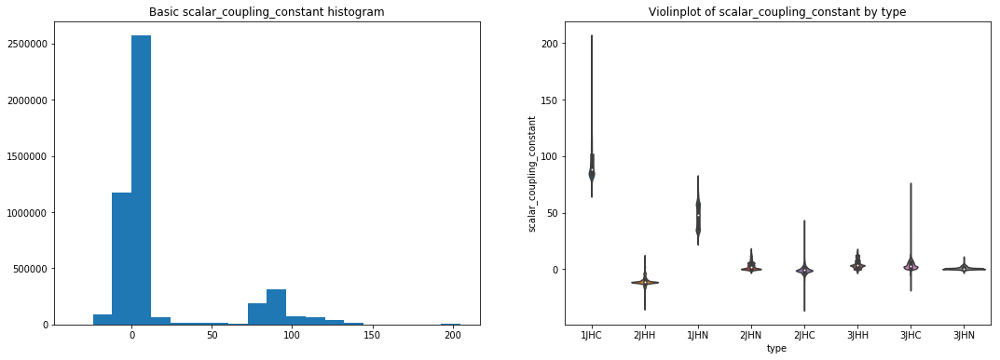

In [9]:
fig, ax = plt.subplots(figsize = (18, 6))
plt.subplot(1, 2, 1);
plt.hist(train['scalar_coupling_constant'], bins=20);
plt.title('Basic scalar_coupling_constant histogram');
plt.subplot(1, 2, 2);
sns.violinplot(x='type', y='scalar_coupling_constant', data=train);
plt.title('Violinplot of scalar_coupling_constant by type');

There are many interesting things here:
- among first atoms there is a little number of atoms with index lower than 7 or higher than 24;
- among second atoms there is a little number of atoms with index higher than 24. Also index with atom with index 9 in quite rare;
- coupling types are unevenly distributed. There are 3 very popular, 3 quite rare and 2 with medium frequency;
- target variable has a bimodal distribution;
- different coupling types have really different values of target variable. Maybe it would make sense to build separate models for each of them;

## Plotting network graphs by type

We have molecules, atom pairs, so this means data, which is interconnected. Network graphs should be useful to visualize such data!

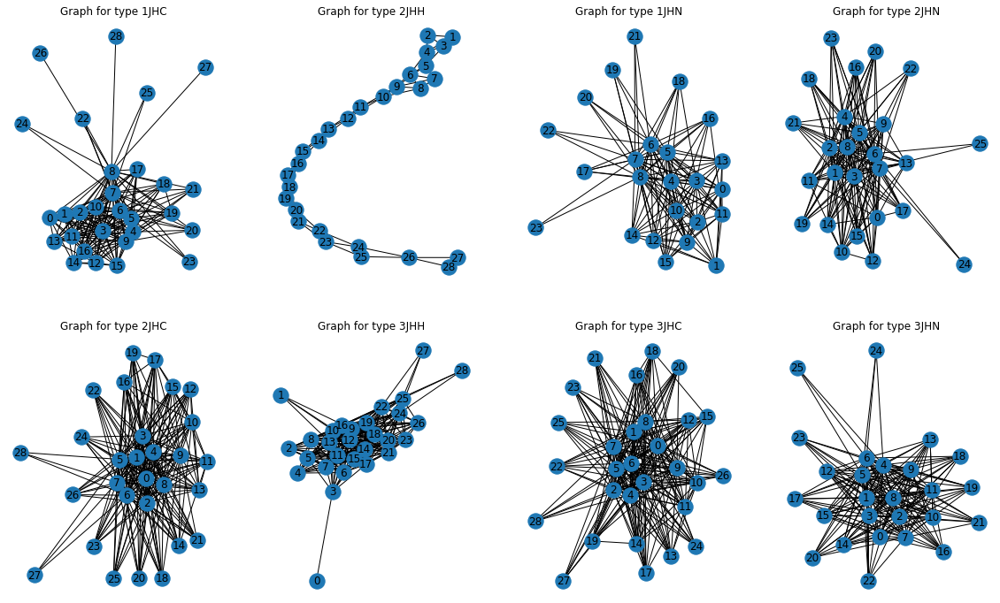

In [10]:
fig, ax = plt.subplots(figsize = (20, 12))
for i, t in enumerate(train['type'].unique()):
    train_type = train.loc[train['type'] == t]
    G = nx.from_pandas_edgelist(train_type, 'atom_index_0', 'atom_index_1', ['scalar_coupling_constant'])
    plt.subplot(2, 4, i + 1);
    nx.draw(G, with_labels=True);
    plt.title(f'Graph for type {t}')

Cool! We can see that atom connections have different shapes for different types. Type 2JHH has an expecially unique scheme.
Also we can see that some atoms are connected only to several other atoms.

## Better network graphs
But there is a little problem: as we saw earlier, there are atoms which are very rare, as a result graphs will be skewed due to them. Now I'll drop atoms for each type which are present in less then 1% of connections

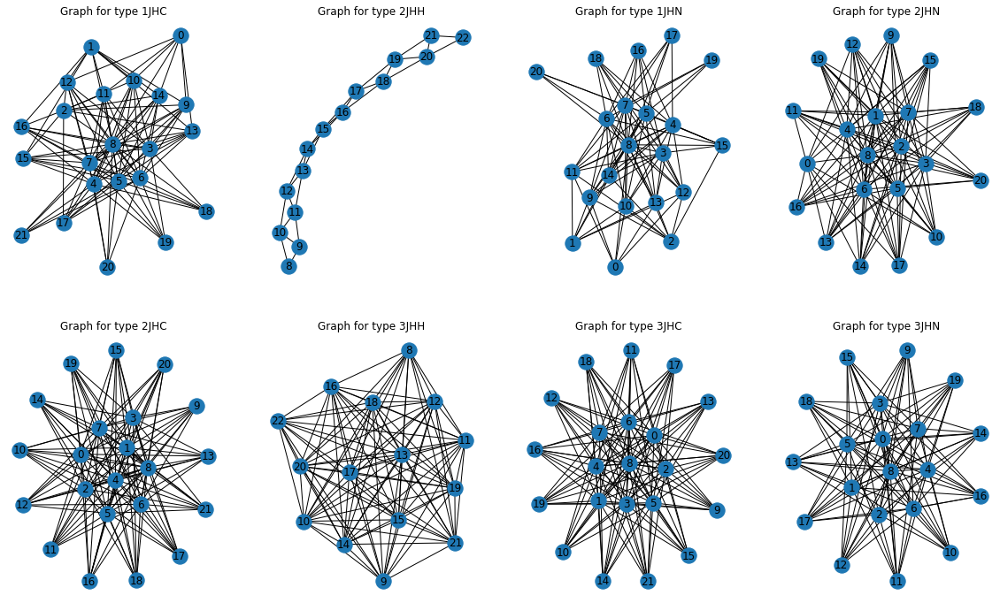

In [11]:
fig, ax = plt.subplots(figsize = (20, 12))
for i, t in enumerate(train['type'].unique()):
    train_type = train.loc[train['type'] == t]
    bad_atoms_0 = list(train_type['atom_index_0'].value_counts(normalize=True)[train_type['atom_index_0'].value_counts(normalize=True) < 0.01].index)
    bad_atoms_1 = list(train_type['atom_index_1'].value_counts(normalize=True)[train_type['atom_index_1'].value_counts(normalize=True) < 0.01].index)
    bad_atoms = list(set(bad_atoms_0 + bad_atoms_1))
    train_type = train_type.loc[(train_type['atom_index_0'].isin(bad_atoms_0) == False) & (train_type['atom_index_1'].isin(bad_atoms_1) == False)]
    G = nx.from_pandas_edgelist(train_type, 'atom_index_0', 'atom_index_1', ['scalar_coupling_constant'])
    plt.subplot(2, 4, i + 1);
    nx.draw(G, with_labels=True);
    plt.title(f'Graph for type {t}')

Now the graphs are much more clear!

## Feature engineering

For now I'll use a basic approach to feature engineering.

I'll use this useful kernel:
https://www.kaggle.com/seriousran/just-speed-up-calculate-distance-from-benchmark

In [14]:
def map_atom_info(df, atom_idx):
    df = pd.merge(df, structures, how = 'left',
                  left_on  = ['molecule_name', f'atom_index_{atom_idx}'],
                  right_on = ['molecule_name',  'atom_index'])
    
    df = df.drop('atom_index', axis=1)
    df = df.rename(columns={'atom': f'atom_{atom_idx}',
                            'x': f'x_{atom_idx}',
                            'y': f'y_{atom_idx}',
                            'z': f'z_{atom_idx}'})
    return df

In [20]:
train = map_atom_info(train, 0)
train = map_atom_info(train, 1)

test = map_atom_info(test, 0)
test = map_atom_info(test, 1)

In [25]:
train_p_0 = train[['x_0', 'y_0', 'z_0']].values
train_p_1 = train[['x_1', 'y_1', 'z_1']].values
test_p_0 = test[['x_0', 'y_0', 'z_0']].values
test_p_1 = test[['x_1', 'y_1', 'z_1']].values

In [39]:
train['dist'] = np.linalg.norm(train_p_0 - train_p_1, axis=1)
test['dist'] = np.linalg.norm(test_p_0 - test_p_1, axis=1)
train['dist_x'] = (train['x_0'] - train['x_1']) ** 2
test['dist_x'] = (test['x_0'] - test['x_1']) ** 2
train['dist_y'] = (train['y_0'] - train['y_1']) ** 2
test['dist_y'] = (test['y_0'] - test['y_1']) ** 2
train['dist_z'] = (train['z_0'] - train['z_1']) ** 2
test['dist_z'] = (test['z_0'] - test['z_1']) ** 2

I want to create two new features: one will show the first character of the `type`, the second one will show other characters.

In [44]:
train['type_0'] = train['type'].apply(lambda x: x[0])
test['type_0'] = test['type'].apply(lambda x: x[0])
train['type_1'] = train['type'].apply(lambda x: x[1:])
test['type_1'] = test['type'].apply(lambda x: x[1:])

So, everyone uses this distance feature, let's have a look at it!

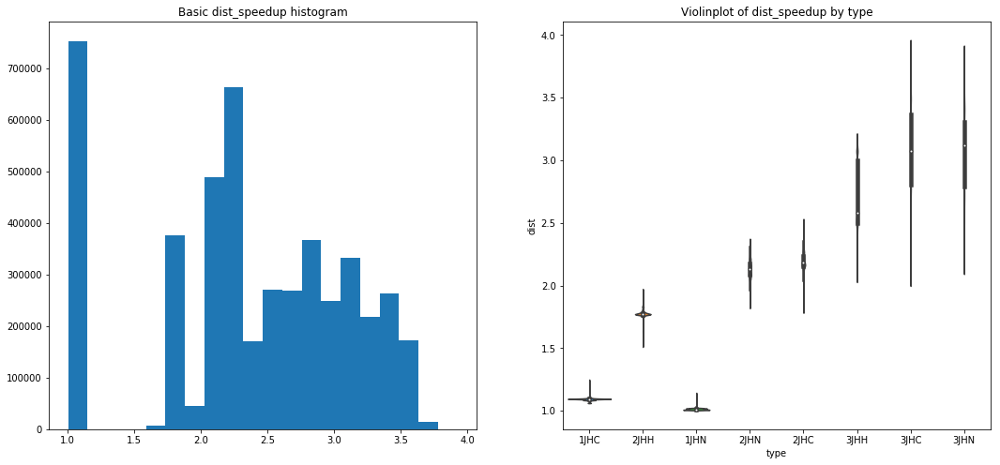

In [46]:
fig, ax = plt.subplots(figsize = (18, 8))
plt.subplot(1, 2, 1);
plt.hist(train['dist'], bins=20);
plt.title('Basic dist_speedup histogram');
plt.subplot(1, 2, 2);
sns.violinplot(x='type', y='dist', data=train);
plt.title('Violinplot of dist_speedup by type');

It seems that the values are quite different for different types!

In [51]:
train['dist_to_type_mean'] = train['dist'] / train.groupby('type')['dist'].transform('mean')
test['dist_to_type_mean'] = test['dist'] / test.groupby('type')['dist'].transform('mean')

train['dist_to_type_0_mean'] = train['dist'] / train.groupby('type_0')['dist'].transform('mean')
test['dist_to_type_0_mean'] = test['dist'] / test.groupby('type_0')['dist'].transform('mean')

train['dist_to_type_1_mean'] = train['dist'] / train.groupby('type_1')['dist'].transform('mean')
test['dist_to_type_1_mean'] = test['dist'] / test.groupby('type_1')['dist'].transform('mean')

In [53]:
train[f'molecule_type_dist_mean'] = train.groupby(['molecule_name', 'type'])['dist'].transform('mean')
test[f'molecule_type_dist_mean'] = test.groupby(['molecule_name', 'type'])['dist'].transform('mean')

## Basic model

I'll use the function for metric calculation from this kernel: https://www.kaggle.com/abhishek/competition-metric

UPD: use faster metric from this kernel: https://www.kaggle.com/uberkinder/efficient-metric

You can see the code in my utility script. Please note that to use this metric for calculation you need to pass value `group_mae` to parameter `eval_metric`.

In [55]:
for f in ['atom_0', 'atom_1', 'type_0', 'type_1', 'type']:
    lbl = LabelEncoder()
    lbl.fit(list(train[f].values) + list(test[f].values))
    train[f] = lbl.transform(list(train[f].values))
    test[f] = lbl.transform(list(test[f].values))

In [57]:
train.head()

,id,molecule_name,atom_index_0,atom_index_1,type,scalar_coupling_constant,atom_0,x_0,y_0,z_0,...,dist,dist_x,dist_y,dist_z,type_0,type_1,dist_to_type_mean,dist_to_type_0_mean,dist_to_type_1_mean,molecule_type_dist_mean
0,0,dsgdb9nsd_000001,1,0,0,84.807599999999994,0,0.002150416,-0.0060313176,0.0019761204,...,1.091953059611900,0.000220479493527,1.192104705778678,0.000036299123586,0,0,0.999133993514757,1.003366595134415,0.463061408177816,1.091949649609598
1,1,dsgdb9nsd_000001,1,2,3,-11.257000000000000,0,0.002150416,-0.0060313176,0.0019761204,...,1.783119756038801,1.019252638581502,2.160260537339124,0.000002888455246,1,1,1.004633785679569,0.852949262177106,0.761935207514872,1.783146310703152
2,2,dsgdb9nsd_000001,1,3,3,-11.254799999999999,0,0.002150416,-0.0060313176,0.0019761204,...,1.783147496403011,0.294811517901285,2.112830660517270,0.771972815509771,1,1,1.004649414975929,0.852962531685845,0.761947061099068,1.783146310703152
3,3,dsgdb9nsd_000001,1,4,3,-11.254300000000001,0,0.002150416,-0.0060313176,0.0019761204,...,1.783156685329616,0.276638182418367,2.085031922399566,0.817977659617770,1,1,1.004654592141451,0.852966927177590,0.761950987569333,1.783146310703152
4,4,dsgdb9nsd_000001,2,0,0,84.807400000000001,0,1.011730843,1.4637511620,0.0002765748,...,1.091951618581363,1.049454732810097,0.142843937832576,0.000059666679785,0,0,0.999132674975848,1.003365271009819,0.463060797084121,1.091949649609598


In [58]:
X = train.drop(['id', 'molecule_name', 'scalar_coupling_constant'], axis=1)
y = train['scalar_coupling_constant']
X_test = test.drop(['id', 'molecule_name'], axis=1)

In [59]:
n_fold = 5
folds = KFold(n_splits=n_fold, shuffle=True, random_state=11)

In [ ]:
params = {'num_leaves': 128,
          'min_child_samples': 79,
          'objective': 'regression',
          'max_depth': 13,
          'learning_rate': 0.2,
          "boosting_type": "gbdt",
          "subsample_freq": 1,
          "subsample": 0.9,
          "bagging_seed": 11,
          "metric": 'mae',
          "verbosity": -1,
          'reg_alpha': 0.1,
          'reg_lambda': 0.3,
          'colsample_bytree': 1.0
         }
result_dict_lgb = train_model_regression(X=X, X_test=X_test, y=y, params=params, folds=folds, model_type='lgb', eval_metric='group_mae', plot_feature_importance=True,
                                                      verbose=1000, early_stopping_rounds=200, n_estimators=10000)


In [ ]:
sub['scalar_coupling_constant'] = result_dict_lgb['prediction']
sub.to_csv('submission.csv', index=False)
sub.head()

In [ ]:
plt.hist(result_dict_lgb['prediction'], bins=40);
plt.title('Distribution of predictions');

## Plot oof predictions vs target

I use the code from benchmark kernel: https://www.kaggle.com/inversion/atomic-distance-benchmark

Notice that while using `LabelEncoder` on categorical variables, `type` was the last feature, so `lbl` contains encodings for it and we can inverse_transform `type`.

In [ ]:
plot_data = pd.DataFrame(y)
plot_data.index.name = 'id'
plot_data['yhat'] = result_dict_lgb['oof']
plot_data['type'] = lbl.inverse_transform(X['type'])

def plot_oof_preds(ctype, llim, ulim):
        plt.figure(figsize=(6,6))
        sns.scatterplot(x='scalar_coupling_constant',y='yhat',
                        data=plot_data.loc[plot_data['type']==ctype,
                        ['scalar_coupling_constant', 'yhat']]);
        plt.xlim((llim, ulim))
        plt.ylim((llim, ulim))
        plt.plot([llim, ulim], [llim, ulim])
        plt.xlabel('scalar_coupling_constant')
        plt.ylabel('predicted')
        plt.title(f'{ctype}', fontsize=18)
        plt.show()

plot_oof_preds('1JHC', 0, 250)
plot_oof_preds('1JHN', 0, 100)
plot_oof_preds('2JHC', -50, 50)
plot_oof_preds('2JHH', -50, 50)
plot_oof_preds('2JHN', -25, 25)
plot_oof_preds('3JHC', -25, 100)
plot_oof_preds('3JHH', -20, 20)
plot_oof_preds('3JHN', -15, 15)

We can see that some types has better predictions than others. Maybe we should focus on improving models for these types?

In [178]:
import math

import keras
import keras.backend as K
from keras.models import Sequential
from keras.layers import Dense, CuDNNGRU, Dropout, TimeDistributed, LSTM, CuDNNLSTM
from keras.optimizers import adam, RMSprop
from keras.callbacks import ModelCheckpoint
# Fix seeds
from numpy.random import seed
#seed(639)
from tensorflow import set_random_seed
#set_random_seed(5944)
import tensorflow as tf

from sklearn.model_selection import train_test_split

#def group_mean_log_mae_nn(train_types, test_types, floor=1e-9):
def group_mean_log_mae_nn(types, floor=1e-9):
    def calculate_log_mae(y_true, y_pred):
        #print("calculate_log_mae, type(types)", type(types))
        #print("calculate_log_mae, tf.keras.backend.learning_phase():", tf.keras.backend.learning_phase())
        #current_types = types[tf.keras.backend.learning_phase()]
        #phase = tf.keras.backend.learning_phase()
        #phase = K.learning_phase()
        #current_types = types[phase]
        train_types, test_types = types
        current_types = K.in_train_phase(train_types, test_types).eval()
        ##type_indicator = K.in_train_phase(0, 1).eval()
        ##print("type_indicator:", type_indicator)
        ##current_types= types[type_indicator]
        print("type(current_types):", type(current_types))
        print("current_types[:5]:\n", current_types[:5])
        unique_types = np.unique(current_types)
        ##unique_types = current_types.unique()

        print("type(unique_types):", type(unique_types))
        print("unique_types:\n", unique_types)
        print("len(unique_types):", len(unique_types))
        score = 0
        for unique_type in unique_types:
            type_idx = (current_types == unique_type)
            print("type(type_idx):", type(type_idx))
            #type_idx = (current_types == unique_type).astype(np.int32)
            y_true_by_type = y_true[type_idx]
            y_pred_by_type = y_pred[type_idx]
            score += tf.keras.backend.log(tf.keras.backend.abs(y_true_by_type - y_pred_by_type))
        print("type(score):", type(score))    
        return score / len(unique_types)
    return calculate_log_mae

In [197]:
class BatchGenerator(keras.utils.Sequence):
    
    def __init__(self, X, y, batch_size, info_string="train_phase"):
        
        self.X = X
        self.y = y
        self.data_len = len(X)
        self.batch_size = batch_size
        self.num_of_features = X.shape[1]
        self.info_string = info_string
        self.message_count = 0
    
    def __len__(self):
        print("BatchGenerator, __len__:", self.info_string)
        print("BatchGenerator, __len__, self.data_len // self.batch_size:", self.data_len // self.batch_size)
        print("BatchGenerator, __len__, math.ceil(self.data_len / self.batch_size):", math.ceil(self.data_len / self.batch_size))
        #return self.data_len // self.batch_size
        return math.ceil(self.data_len / self.batch_size)
    
    def __getitem__(self, idx):
        #if self.message_count == 200:
        #print("BatchGenerator, __getitem__:", self.info_string)
        #print("BatchGenerator, __getitem__, idx:", idx)
        #self.message_count = -1
        '''
        batch_x = self.X[
            idx * self.batch_size:(idx + 1) * self.batch_size
        ].values.reshape(self.batch_size, 1, self.num_of_features)
        '''
        #print("BatchGenerator, __getitem__, batch_size:", self.batch_size)
        batch_x = self.X[idx * self.batch_size:(idx + 1) * self.batch_size]
        #print("BatchGenerator, __getitem__, batch_x.shape) before reshape:", batch_x.shape)
        #print("BatchGenerator, __getitem__, batch_x.values.shape) before reshape:", batch_x.values.shape)
        '''
        try:
            batch_x.values.reshape(self.batch_size, 1, self.num_of_features)
        except ValueError as va:
            print("ValueError:", va)
            print("batch_x.shape:", batch_x.shape)
            print("batch_x.values.shape:", batch_x.values.shape)
            print("batch_x\n:", batch_x)
        '''
        #batch_x =  batch_x.values.reshape(self.batch_size, 1, self.num_of_features)
        batch_x =  batch_x.values.reshape(batch_x.shape[0], 1, self.num_of_features)
        #print("BatchGenerator, __getitem__, batch_x.shape) after reshape:", batch_x.shape)
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        #print("BatchGenerator, __getitem__, batch_y.shape):", batch_y.shape)
        self.message_count += 1
        return batch_x, batch_y

In [201]:
class TestBatchGenerator(keras.utils.Sequence):
    
    def __init__(self, X, batch_size, info_string="test dataset"):
        
        self.X = X
        self.data_len = len(X)
        self.batch_size = batch_size
        self.num_of_features = X.shape[1]
        self.info_string = info_string
        self.message_count = 0
    
    def __len__(self):
        print("TestBatchGenerator, __len__:", self.info_string)
        print("TestBatchGenerator, __len__, self.data_len // self.batch_size:", self.data_len // self.batch_size)
        print("TestBatchGenerator, __len__, math.ceil(self.data_len / self.batch_size):", math.ceil(self.data_len / self.batch_size))
        #return self.data_len // self.batch_size
        return math.ceil(self.data_len / self.batch_size)
    
    
    def __getitem__(self, idx):

        #if self.message_count == 200:
        #    print("TestBatchGenerator, __getitem__:", self.info_string)
        #    print("TestBatchGenerator, __getitem__, idx:", idx)
        #    self.message_count = -1

        #print("TestBatchGenerator, __getitem__:", self.info_string)
        #print("TestBatchGenerator, __getitem__, idx:", idx)    
        
        '''
        batch_x = self.X[
            idx * self.batch_size:(idx + 1) * self.batch_size
        ].values.reshape(self.batch_size, 1, self.num_of_features)
        '''
        #print("TestBatchGenerator, __getitem__, batch_size:", self.batch_size)
        batch_x = self.X[idx * self.batch_size:(idx + 1) * self.batch_size]
        #print("TestBatchGenerator, __getitem__, batch_x.shape) before reshape:", batch_x.shape)
        #batch_x =  batch_x.values.reshape(self.batch_size, 1, self.num_of_features)
        batch_x =  batch_x.values.reshape(batch_x.shape[0], 1, self.num_of_features)
        #print("TestBatchGenerator, __getitem__, batch_x.shape) after reshape:", batch_x.shape)
        #self.message_count += 1
        return batch_x

In [66]:
train_X, holdout_X, train_y, holdout_y = train_test_split(X, y, test_size=0.2, random_state=0)

In [69]:
X_save = X.copy()

In [68]:
train_copy = train.copy()

In [70]:
patience = 50
call_es = keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0,
    patience=patience,
    verbose=1,
    mode='auto',
    baseline=None,
    #restore_best_weights=True
)

In [71]:
cb = [ModelCheckpoint("model.hdf5", save_best_only=True, period=3)]
def create_model(input_dim=10, custom_loss=None):

    # The LSTM architecture
    model = Sequential()
    # First LSTM layer with Dropout regularisation
    model.add(CuDNNLSTM(units=50, return_sequences=True, input_shape=(None, input_dim)))
    model.add(Dropout(0.2))
    # Second LSTM layer
    model.add(CuDNNLSTM(units=50, return_sequences=True))
    model.add(Dropout(0.2))
    # Third LSTM layer
    model.add(CuDNNLSTM(units=50, return_sequences=True))
    model.add(Dropout(0.2))
    # Fourth LSTM layer
    model.add(CuDNNLSTM(units=50))
    model.add(Dropout(0.2))
    # The output layer
    model.add(Dense(units=1))

    # Compiling the RNN
    if custom_loss:
        loss = [custom_loss]
    else:
        loss = ['mae']

    model.summary()
    model.compile(optimizer='rmsprop', loss=loss)
    return model

In [175]:
def evaluate_nn(train_X, test_X, train_y, folds, callbacks, custom_loss=None):
    nn_predictions = np.zeros(len(test_X))
    num_of_features = train_X.shape[-1]
    print("train_nn, num_of_features:", num_of_features)
    model = None
    models = []
    histories = []
    nn_oof = np.zeros(len(train_X))
    
    #for fold_, (trn_idx, val_idx) in enumerate(folds.split(train_X, train_y)):
    for fold_, (trn_idx, val_idx) in enumerate(folds.split(train_X.index, train_y.index)):
        print("type(trn_idx):", type(trn_idx))
        print("len(trn_idx):", len(trn_idx))
        print("trn_idx:", trn_idx)
        
        print("type(val_idx):", type(val_idx))
        print("len(val_idx):", len(val_idx))
        print("val_idx:", val_idx)
        strLog = "fold {}".format(fold_)
        print(strLog)

        X_tr = train_X.iloc[trn_idx]
        print('any(train_X[\'type\'].isna()', any(train_X['type'].isna()))
        X_val = train_X.iloc[val_idx]
        #y_tr, y_val = train_y.iloc[trn_idx].values, train_y.iloc[val_idx].values
        y_tr, y_val = train_y.iloc[trn_idx], train_y.iloc[val_idx]
        print('any(X_tr[\'type\'].isna()', any(X_tr['type'].isna()))
        #types = (X_val['type'], X_tr['type'])
        types = (X_tr['type'], X_val['type'])
        
        #print("X_tr.columns", X_tr.columns)
        #train_types = X_tr['type']
        #val_types = X_val['type']
        
        #train_batch_gen = BatchGenerator(X_tr.values, y_tr, 64)
        #valid_batch_gen = BatchGenerator(X_val.values, y_val, 64)
        train_batch_gen = BatchGenerator(X_tr, y_tr, 64)
        valid_batch_gen = BatchGenerator(X_val, y_val, 64, "validation phase")
        #model = create_model(num_of_features, custom_loss(groups))
        #model = create_model(num_of_features, custom_loss(types))
        model = create_model(num_of_features)
        #model = create_model(num_of_features, custom_loss(train_types, val_types))
        #model.fit(X_tr, y_tr, epochs=50, batch_size=32, verbose=2, callbacks=[call_es,], validation_data=[X_val, y_val]) #
        model.fit_generator(
            generator=train_batch_gen,
            #steps_per_epoch=(num_training_samples // batch_size),
            #steps_per_epoch=200,
            #epochs=10,
            epochs=1,
            verbose=1,
            validation_data=valid_batch_gen,
            callbacks=callbacks,
            #validation_steps=(num_validation_samples // batch_size),
            use_multiprocessing=True,
            workers=24,
            #max_queue_size=32
        )
        models.append(model)
    
        
        #nn_oof[val_idx] = model.predict(X_val)[:,0]
        #nn_oof[val_idx] = model.predict(X_val)
        #y_pred_valid = model.predict(X_val)[:,0]
        print("before oof_batch_generator,  X_val.shape:", X_val.shape)
        
        oof_batch_generator = TestBatchGenerator(X_val, 64, "oof validation dataset")
        print("after oof_batch_generator,  X_val.shape:", X_val.shape)
        print("type(val_idx)", type(val_idx))
        print("len(val_idx):", len(val_idx))
        print("type(nn_predictions):", type(nn_predictions))
        print("nn_preictions.shape:", nn_predictions.shape)
        '''
        try:
            nn_oof[val_idx] = model.predict_generator(
                oof_batch_generator,
                verbose=1,
                workers=10,
                use_multiprocessing=True
            )
        except Exception as e:
            print("OOF Exception:", e)
        
        '''
        print("nn_oof.shape:", nn_oof.shape)
        '''
        nn_oof[val_idx] = model.predict_generator(
            oof_batch_generator,
            verbose=1,
            workers=10,
            use_multiprocessing=True
        )
        '''
        print("nn_oof.shape:", nn_oof.shape)
        print("nn_oof[val_idx].shape:", nn_oof[val_idx].shape)
        val_prediction = model.predict_generator(
            oof_batch_generator,
            verbose=1,
            workers=10,
            use_multiprocessing=True
        )
        print("type(val_prediction):", type(val_prediction))
        print("val_prediction.shape:", val_prediction.shape)
        nn_oof[val_idx] = val_prediction
        #test_X = test_X.reshape(len(test_X), 1, num_of_features)
        #print(type(test_X))
        #test_batch_generator = TestBatchGenerator((test_X.values)[:, 0])
        #test_batch_generator = TestBatchGenerator(test_X[:, 0])
        print("\n", "*" * 20, "\ntest_X.shape:", test_X.shape)
        test_batch_generator = TestBatchGenerator(test_X, 64)
        #y_pred = model.predict(test_X)[:,0] / folds.n_splits
        y_pred = model.predict_generator(
            test_batch_generator,
            verbose=1,
            workers=10,
            use_multiprocessing=True
        ) / folds.n_splits
        
        #nn_predictions += model.predict(test_X)[:,0] / folds.n_splits

        print("type(y_pred):", type(y_pred))
        print("y_pred.shape:", y_pred.shape)
        nn_predictions += y_pred
        history = model.history.history
        histories.append(history)
        tr_loss = history["loss"]
        val_loss = history["val_loss"]
        print(f"loss: {tr_loss[-patience]:.3f} | val_loss: {val_loss[-patience]:.3f} | diff: {val_loss[-patience]-tr_loss[-patience]:.3f}")
        train_score.append(tr_loss[-patience])
        #     break
    
        cv_score = mean_absolute_error(train_y, nn_oof)
        print(f"After {n_fold} test_CV = {cv_score:.3f} | train_CV = {np.mean(train_score):.3f} | {cv_score-np.mean(train_score):.3f}", end=" ")
    return nn_oof, models, histories, nn_predictions

In [176]:
def group_mean_log_mae_nn(types, floor=1e-9):
    def calculate_log_mae(y_true, y_pred):
        
        print("type(y_true):", type(y_true))
        print("type(y_pred):", type(y_pred))
        train_types, test_types = types
        current_types = K.in_train_phase(train_types, test_types).eval()

        print("type(current_types):", type(current_types))
        print("current_types.shape:", current_types.shape)
        print("current_types[:5]:\n", current_types[:5])
        unique_types = np.unique(current_types)

        print("type(unique_types):", type(unique_types))
        print("unique_types:\n", unique_types)
        print("len(unique_types):", len(unique_types))
        score = 0
        for unique_type in unique_types:
            type_idx = (current_types == unique_type)
            print("type(type_idx):", type(type_idx))
            print("type_idx:\n", type_idx)
            type_idx = type_idx.astype(np.int32)

            #y_true_by_type = y_true[type_idx]
            y_true_by_type = tf.boolean_mask(y_true, mask=type_idx)
            #y_pred_by_type = y_pred[type_idx]
            y_pred_by_type = tf.boolean_mask(y_pred, mask=type_idx)
            score += tf.keras.backend.log(tf.keras.backend.abs(y_true_by_type - y_pred_by_type))
        print("type(score):", type(score))    
        return score / len(unique_types)
    return calculate_log_mae

In [149]:
X_test.shape non-broadcastable output operand with shape (2505542,) doesn't match the broadcast shape (2505536,2505542)

(2505542, 21)

In [83]:
n_fold = 5
#folds = KFold(n_splits=n_fold, shuffle=True, random_state=42)
folds = KFold(n_splits=n_fold, shuffle=False, random_state=42)

In [198]:
sess = tf.Session()

with sess.as_default():
    evaluate_result = evaluate_nn(
        #train_X.values,
        #X_test.values,
        #train_y.values,
        train_X,
        X_test,
        train_y,        
        folds,
        callbacks=[call_es],
        #groups=groups,
        #custom_loss=group_mean_log_mae_nn
    )

train_nn, num_of_features: 21
type(trn_idx): <class 'numpy.ndarray'>
len(trn_idx): 2981213
trn_idx: [ 745304  745305  745306 ... 3726514 3726515 3726516]
type(val_idx): <class 'numpy.ndarray'>
len(val_idx): 745304
val_idx: [     0      1      2 ... 745301 745302 745303]
fold 0
any(train_X['type'].isna() False
any(X_tr['type'].isna() False
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
cu_dnnlstm_169 (CuDNNLSTM)   (None, None, 50)          14600     
_________________________________________________________________
dropout_169 (Dropout)        (None, None, 50)          0         
_________________________________________________________________
cu_dnnlstm_170 (CuDNNLSTM)   (None, None, 50)          20400     
_________________________________________________________________
dropout_170 (Dropout)        (None, None, 50)          0         
_________________________________________________________________

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
    1/46582 [..............................] - ETA: 816:24:51 - loss: 16.5779BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22520
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) b

BatchGenerator, __getitem__, idx: 3571
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19584
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21342
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
   29/46582 [..............................] - ETA: 28:22:03 - loss: 18.2546BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40888
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
   55/46582 [..............................] - ETA: 15:03:39 - loss: 18.1685BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29178
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18127
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12120
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
B

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27955
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
   84/46582 [..............................] - ETA: 9:55:49 - loss: 17.9658 BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20427
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8430
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.sh

  111/46582 [..............................] - ETA: 7:33:23 - loss: 17.7532BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38239
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32961
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46425
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  114/46582 [..............................] - ETA: 7:21:52 - loss: 17.6314BatchGenerator, __getitem__: train_phase

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  140/46582 [..............................] - ETA: 6:01:58 - loss: 17.1879BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44976
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23902
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27946
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Ba

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43862
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41345
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  170/46582 [..............................] - ETA: 5:00:00 - loss: 17.2918BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40033
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.sh

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1717
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13369
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  198/46582 [..............................] - ETA: 4:19:13 - loss: 17.3473BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32210
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase

BatchGenerator, __getitem__, idx: 22805
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  225/46582 [..............................] - ETA: 3:49:25 - loss: 17.2079BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5657
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28027
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3918
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, idx: 4883
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20771
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  254/46582 [..............................] - ETA: 3:24:40 - loss: 17.2156BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34333
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44294
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13836
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 872
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  283/46582 [..............................] - ETA: 3:04:51 - loss: 17.1089BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46324
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batc

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20324
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  310/46582 [..............................] - ETA: 2:49:45 - loss: 17.0502BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43753
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15336
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.sh

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37671
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40802
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  339/46582 [..............................] - ETA: 2:36:14 - loss: 16.9851BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 178
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase


BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3169
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4072
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37121
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  368/46582 [..............................] - ETA: 2:24:48 - loss: 16.8895BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36855
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, idx: 19937
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10277
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23989
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30723
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3962
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  423/46582 [..............................] - ETA: 2:07:24 - loss: 16.6073BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34975
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33644
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  451/46582 [..............................] - ETA: 2:00:06 - loss: 16.5005BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34063
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33811
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46278
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9708
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34054
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  481/46582 [..............................] - ETA: 1:53:09 - loss: 16.4019BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16302
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45411
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  508/46582 [..............................] - ETA: 1:47:42 - loss: 16.2988BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46173
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15510
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16631
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.sh

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28252
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  537/46582 [..............................] - ETA: 1:42:23 - loss: 16.1970BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7124
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37672
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1319
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, idx: 44698
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29279
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38147
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  567/46582 [..............................] - ETA: 1:37:32 - loss: 16.0882BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36782
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  593/46582 [..............................] - ETA: 1:33:42 - loss: 16.0044BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39979
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29814
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8964
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28983
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4771
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  623/46582 [..............................] - ETA: 1:29:41 - loss: 15.9134BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14002
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20570
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  650/46582 [..............................] - ETA: 1:26:22 - loss: 15.7892BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36868
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46249
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30155
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.sh

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31746
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  679/46582 [..............................] - ETA: 1:23:05 - loss: 15.6809BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9724
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 791
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5481
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9404
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  708/46582 [..............................] - ETA: 1:20:04 - loss: 15.5662BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5855
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30083
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shap

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10861
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29441
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18538
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  738/46582 [..............................] - ETA: 1:17:10 - loss: 15.4640BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20604
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26924
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  765/46582 [..............................] - ETA: 1:14:47 - loss: 15.3651BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32570
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44163
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.sh

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29023
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  793/46582 [..............................] - ETA: 1:12:35 - loss: 15.2628BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20930
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6077
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase

BatchGenerator, __getitem__, idx: 18913
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  821/46582 [..............................] - ETA: 1:10:26 - loss: 15.1479BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44231
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11541
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31454
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18883
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33657
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10900
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 

BatchGenerator, __getitem__, idx: 16465
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  878/46582 [..............................] - ETA: 1:06:28 - loss: 14.9119BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37921
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27192
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39715
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  906/46582 [..............................] - ETA: 1:04:42 - loss: 14.8016BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8824
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10401
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7491
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase


  934/46582 [..............................] - ETA: 1:03:04 - loss: 14.7174BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43559
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34409
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5608
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  937/46582 [..............................] - ETA: 1:02:54 - loss: 14.7071BatchGenerator, __getitem__: train_phase


BatchGenerator, __getitem__, idx: 1097
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34509
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 342
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  965/46582 [..............................] - ETA: 1:01:20 - loss: 14.5941BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13475
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13401
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
  992/46582 [..............................] - ETA: 59:57 - loss: 14.4953  BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10137
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44112
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phas

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42564
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1021/46582 [..............................] - ETA: 58:30 - loss: 14.4104BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17063
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 160
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42561
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1049/46582 [..............................] - ETA: 57:14 - loss: 14.2882BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2951
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35146
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17601
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33405
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32234
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1079/46582 [..............................] - ETA: 55:55 - loss: 14.1778BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44080
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31865
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13683
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1107/46582 [..............................] - ETA: 54:44 - loss: 14.0875BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33949
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase


 1133/46582 [..............................] - ETA: 53:44 - loss: 13.9979BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16954
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26201
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43995
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33251
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37603
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20686
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24971
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15076
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32535
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1192/46582 [..............................] - ETA: 51:35 - loss: 13.8047BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3904
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34268
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30971
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10829
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20841
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26617
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27265
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31391
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23244
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36934
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1277/46582 [..............................] - ETA: 48:46 - loss: 13.5228BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16173
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34024
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28464
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20192
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34448
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17500
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13505
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23737
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1335/46582 [..............................] - ETA: 47:04 - loss: 13.3079BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6448
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41230
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1362/46582 [..............................] - ETA: 46:20 - loss: 13.2231BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45608
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24795
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33270
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase


BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32821
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1391/46582 [..............................] - ETA: 45:35 - loss: 13.1408BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36392
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40921
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13746
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39085
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1420/46582 [..............................] - ETA: 44:50 - loss: 13.0431BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31722
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43665
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase


BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1448/46582 [..............................] - ETA: 44:08 - loss: 12.9475BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33043
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7326
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15036
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

 1476/46582 [..............................] - ETA: 43:28 - loss: 12.8474BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43326
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28188
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20152
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24610
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1930
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14638
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43294
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4661
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31171
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1535/46582 [..............................] - ETA: 42:12 - loss: 12.6649BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44235
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1562/46582 [>.............................] - ETA: 41:38 - loss: 12.5771BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34949
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10411
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42683
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batc

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45711
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1591/46582 [>.............................] - ETA: 41:02 - loss: 12.4798BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43907
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13431
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9454
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33293
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18731
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1621/46582 [>.............................] - ETA: 40:27 - loss: 12.3935BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40050
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase


BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5564
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27039
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33954
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1

 1676/46582 [>.............................] - ETA: 39:26 - loss: 12.2317BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2032
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19716
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23315
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17787
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23531
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39882
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2462
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33045
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1734/46582 [>.............................] - ETA: 38:26 - loss: 12.0531BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45735
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3352
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1762/46582 [>.............................] - ETA: 37:58 - loss: 11.9649BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37201
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13357
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35748
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batc

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42732
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1791/46582 [>.............................] - ETA: 37:30 - loss: 11.8844BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41126
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7542
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38106
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22233
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1820/46582 [>.............................] - ETA: 37:04 - loss: 11.7942BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26123
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40808
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batc

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2942
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1848/46582 [>.............................] - ETA: 36:38 - loss: 11.7103BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26918
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30652
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16273
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1876/46582 [>.............................] - ETA: 36:14 - loss: 11.6224BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4507
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37342
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17011
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34316
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44688
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25404
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41611
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14925
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43923
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1935/46582 [>.............................] - ETA: 35:25 - loss: 11.4545BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18014
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batc

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 422
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35213
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1963/46582 [>.............................] - ETA: 35:04 - loss: 11.3722BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15284
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16818
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46095
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 1992/46582 [>.............................] - ETA: 34:40 - loss: 11.2924BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6638
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

 2018/46582 [>.............................] - ETA: 34:21 - loss: 11.2152BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19313
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26349
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44614
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13965
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2047/46582 [>.............................] - ETA: 33:59 - loss: 11.1340BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23447
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23994
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14714
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase


 2075/46582 [>.............................] - ETA: 33:39 - loss: 11.0566BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17221
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46009
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31013
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41966
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1279
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46023
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29233
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2107/46582 [>.............................] - ETA: 33:16 - loss: 10.9662BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2133/46582 [>.............................] - ETA: 32:57 - loss: 10.8919BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33441
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27863
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8980
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18523
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12890
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10192
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18857
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36620
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44473
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2192/46582 [>.............................] - ETA: 32:19 - loss: 10.7271BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13786
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batc

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16702
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23898
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2220/46582 [>.............................] - ETA: 32:02 - loss: 10.6507BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21432
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase


BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10291
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2248/46582 [>.............................] - ETA: 31:44 - loss: 10.5764BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41945
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20264
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shap

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24174
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23736
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2277/46582 [>.............................] - ETA: 31:26 - loss: 10.5028BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39689
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1891
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2304/46582 [>.............................] - ETA: 31:11 - loss: 10.4331BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35277
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41030
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32466
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shap

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11093
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2333/46582 [>.............................] - ETA: 30:53 - loss: 10.3600BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40481
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44308
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42865
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22364
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2362/46582 [>.............................] - ETA: 30:37 - loss: 10.2876BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29359
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24104
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase


BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37562
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19309
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2392/46582 [>.............................] - ETA: 30:20 - loss: 10.2134BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20689
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batc

 2418/46582 [>.............................] - ETA: 30:05 - loss: 10.1496BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17355
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 167
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2690
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1808
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7288
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2448/46582 [>.............................] - ETA: 29:50 - loss: 10.0764BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15916
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4906
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19771
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12157
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2478/46582 [>.............................] - ETA: 29:34 - loss: 10.0073BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23076
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batc

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17033
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33993
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2506/46582 [>.............................] - ETA: 29:20 - loss: 9.9493BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14112
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36279
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43537
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28719
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2535/46582 [>.............................] - ETA: 29:06 - loss: 9.8859BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37240
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36175
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3382
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26469
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2

 2590/46582 [>.............................] - ETA: 28:39 - loss: 9.7730BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4156
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12583
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15938
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8974
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2619/46582 [>.............................] - ETA: 28:25 - loss: 9.7102BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22374
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32887
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15219
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33765
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2649/46582 [>.............................] - ETA: 28:12 - loss: 9.6522BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2705
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43211
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

 2676/46582 [>.............................] - ETA: 28:00 - loss: 9.5975BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25705
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23913
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36359
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13926
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4888
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29417
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44006
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2708/46582 [>.............................] - ETA: 27:46 - loss: 9.5360BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18492
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2735/46582 [>.............................] - ETA: 27:35 - loss: 9.4881BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16548
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30109
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10579
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16663
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13797
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2765/46582 [>.............................] - ETA: 27:22 - loss: 9.4311BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32033
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36487
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43815
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2793/46582 [>.............................] - ETA: 27:10 - loss: 9.3810BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40144
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24098
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 30750
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 41160
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 41217
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
B

BatchGenerator, __getitem__, idx: 44347
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 2849/46582 [>.............................] - ETA: 26:48 - loss: 9.2858BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15009
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1866
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41006
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7427
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 2878/46582 [>.............................] - ETA: 26:37 - loss: 9.2365BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21387
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41173
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7289
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2216
 2907/46582 [>.............................] - ETA: 26:26 - loss: 9.1897BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 2152
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10556
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 18880
 2935/46582 [>.............................] - ETA: 26:16 - loss: 9.1434BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 1397
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29831
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator,

BatchGenerator, __getitem__, idx: 24826
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 2963/46582 [>.............................] - ETA: 26:06 - loss: 9.0997BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11487
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23563
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20296
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41592
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21105
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37072
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 2994/46582 [>.............................] - ETA: 25:55 - loss: 9.0513BatchGenerator, __getitem__, batch_x.values.shape

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43991
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30425
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 3021/46582 [>.............................] - ETA: 25:46 - loss: 9.0101BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25437
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30043
BatchGenerator, __getitem__, batch_si

 3048/46582 [>.............................] - ETA: 25:37 - loss: 8.9671BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40610
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18156
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 46410
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, idx: 5743
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23770
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 28546
 3079/46582 [>.............................] - ETA: 25:27 - loss: 8.9236BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 10433
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 3105/46582 [>.............................] - ETA: 25:19 - loss: 8.8887BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20309
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2817
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32883
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5269
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42010
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8285
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 3136/46582 [=>............................] - ETA: 25:10 - loss: 8.8415BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 7378
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44840
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 3163/46582 [=>............................] - ETA: 25:01 - loss: 8.8032BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20732
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44047
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36969
BatchGene

BatchGenerator, __getitem__, idx: 11292
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26880
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46322
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26250
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 3194/46582 [=>......................

 3219/46582 [=>............................] - ETA: 24:45 - loss: 8.7251BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6234
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 42317
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28011
 3222/46582 [=>............................] - ETA: 24:44 - loss: 8.7227BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11761
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 3248/46582 [=>............................] - ETA: 24:37 - loss: 8.6893BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10804
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16785
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16161
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10698
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4285
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42850
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33564
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28612
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24420
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 3307/46582 [=>............................] - ETA: 24:20 - loss: 8.6111Batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 27650
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 3334/46582 [=>............................] - ETA: 24:13 - loss: 8.5761BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 935
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 43261
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)


 3361/46582 [=>............................] - ETA: 24:05 - loss: 8.5415BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21159
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44930
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42093
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35867
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26647
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27089
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21894
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, batch_size: 64
 3418/46582 [=>............................] - ETA: 23:50 - loss: 8.4680BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17177
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1226
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31533
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3783
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15354
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 14319
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31024
BatchGenerator, __getitem__, batch

 3475/46582 [=>............................] - ETA: 23:36 - loss: 8.4013BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 37428
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16582
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41917
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

 3503/46582 [=>............................] - ETA: 23:29 - loss: 8.3698BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24506
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4015
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26945
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40226
BatchGenerator, __getitem__, batch_x.v

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5088
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
 3533/46582 [=>............................] - ETA: 23:21 - loss: 8.3361BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 286
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 35278
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42168
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26768
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9828
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45346
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 2

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10482
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37126
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18908
BatchGenerator, __getitem__, batch_size: 64
 3591/46582 [=>............................] - ETA: 23:07 - loss: 8.2696BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8872
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 28305
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
 3619/46582 [=>............................] - ETA: 23:01 - loss: 8.2346BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16188
BatchGenerator, __getitem__, batch_size: 64

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32699
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 25570
 3647/46582 [=>............................] - ETA: 22:54 - loss: 8.2062BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 16193
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40632
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45024
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33363
BatchGenerator, __getitem__, batch_size: 64
 3677/46582 [=>............................] - ETA: 22:48 - loss: 8.17

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38904
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31112
BatchGenerator, __getitem__, batch_size: 64
 3704/46582 [=>............................] - ETA: 22:41 - loss: 8.1463BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31925
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

 3731/46582 [=>............................] - ETA: 22:35 - loss: 8.1166BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38185
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21806
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43360
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 3734/46582 [=>............................] - ETA: 22:35 - loss: 8.1135BatchGenerator, __getitem__, batch_x.shape) be

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38823
 3760/46582 [=>............................] - ETA: 22:29 - loss: 8.0864BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 19747
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31952
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 3788/46582 [=>............................] - ETA: 22:22 - loss: 8.0577BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37332
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 729
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25289
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 20628
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13301
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 3818/46582 [=>............................] - ETA: 22:16 - loss: 8.0269BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45562
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43911
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11446
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7863
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23027
 3848/46582 [=>............................] - ETA: 22:10 - loss: 7.9949BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3298
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 927
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33599
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 387

BatchGenerator, __getitem__, idx: 11601
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 2815
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12496
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 3785
BatchGenerator, __getitem__, batch_size: 64
 3905/46582 [=>.................

 3931/46582 [=>............................] - ETA: 21:52 - loss: 7.9116BatchGenerator, __getitem__, idx: 12470
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18539
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 41410
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3737
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 3934/46582 [=>............................] - ETA: 21:52 - loss: 7.9095BatchGe

BatchGenerator, __getitem__, idx: 16000
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12489
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 250
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42786
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.va

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 568
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 3988/46582 [=>............................] - ETA: 21:40 - loss: 7.8577BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33958
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33132
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9585
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7415
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1393
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11234
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 4019/46582 [=>............................] - ETA: 21:34 - loss: 7.8292BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33736
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29203
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44532
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4047/46582 [=>............................] - ETA: 21:29 - loss: 7.8032BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16564
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3206
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42903
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
 4076/46582 [=>............................] - ETA: 21:22 - loss: 7.7789BatchGenerator, __getitem__, idx: 10747
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 18674
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16537
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 26834
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 4104/46582 [=>............................] - ETA: 21:17 - loss: 7.7552BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20252
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3946
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24116
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 4133/46582 [=>............................] - ETA: 21:11 - loss: 7.7285BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24188
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11591
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17112
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27259
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35245
Batch

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 28276
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 4189/46582 [=>............................] - ETA: 21:00 - loss: 7.6804BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42355
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41605
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 24738
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35827
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4219/46582 [=>............................] - ETA: 20:55 - loss: 7.6575BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44324
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 6

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28359
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15347
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8987
BatchGenerator, __getitem__, batch_size: 64
 4248/46582 [=>............................] - ETA: 20:50 - loss: 7.6324BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

 4273/46582 [=>............................] - ETA: 20:45 - loss: 7.6125BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30936
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9208
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24938
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42469
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9273
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17172
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4304/46582 [=>............................] - ETA: 20:40 - loss: 7.5867BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29455
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, idx: 33779
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38951
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4332/46582 [=>............................] - ETA: 20:34 - loss: 7.5645BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39909
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22976
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37155
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4360/46582 [=>............................] - ETA: 20:29 - loss: 7.5402BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6484
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3659
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18816
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17461
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26615
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33650
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
B

BatchGenerator, __getitem__, idx: 23182
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28514
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29398
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4419/46582 [=>............................] - ETA: 20:18 - loss: 7.4919BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24713
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4158
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41317
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4447/46582 [=>............................] - ETA: 20:14 - loss: 7.4699BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6040
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 88
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13094
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9858
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4476/46582 [=>............................] - ETA: 20:09 - loss: 7.4503BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32671
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9091
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4503/46582 [=>............................] - ETA: 20:04 - loss: 7.4305BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2628
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19640
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13639
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10708
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9264
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4533/46582 [=>............................] - ETA: 20:00 - loss: 7.4071BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10815
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11278
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1803
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20702
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4562/46582 [=>............................] - ETA: 19:55 - loss: 7.3863BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5693
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4588/46582 [=>............................] - ETA: 19:52 - loss: 7.3699BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5808
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37634
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14005
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4617/46582 [=>............................] - ETA: 19:47 - loss: 7.3481BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33576
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17770
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9204
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28438
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25194
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4647/46582 [=>............................] - ETA: 19:42 - loss: 7.3279BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11747
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9092
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4674/46582 [==>...........................] - ETA: 19:38 - loss: 7.3066BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2187
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11197
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40438
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4703/46582 [==>...........................] - ETA: 19:33 - loss: 7.2873BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19818
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43106
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6566
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

 4731/46582 [==>...........................] - ETA: 19:29 - loss: 7.2681BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34896
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8942
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32572
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16550
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20914
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4761/46582 [==>...........................] - ETA: 19:24 - loss: 7.2474BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38632
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29307
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36406
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45318
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12469
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8985
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20352
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4819/46582 [==>...........................] - ETA: 19:16 - loss: 7.2099BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1245
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33614
BatchGenerator, __getitem__, batch_size

 4846/46582 [==>...........................] - ETA: 19:12 - loss: 7.1904BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4861
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19395
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44340
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34306
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4875/46582 [==>...........................] - ETA: 19:08 - loss: 7.1709BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34251
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11666
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12799
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

 4903/46582 [==>...........................] - ETA: 19:04 - loss: 7.1533BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16868
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19875
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31398
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43536
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4932/46582 [==>...........................] - ETA: 19:00 - loss: 7.1371BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36708
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34169
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42829
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4935/46582 [==>..........................

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5546
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20435
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44687
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 4963/46582 [==>...........................] - ETA: 18:56 - loss: 7.1163BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10990
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26364
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 4990/46582 [==>...........................] - ETA: 18:51 - loss: 7.1027BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29866
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18629
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37115
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5018/46582 [==>...........................] - ETA: 18:48 - loss: 7.0844BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23618
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33480
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14315
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25917
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5048/46582 [==>...........................] - ETA: 18:43 - loss: 7.0677BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19108
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42653
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

 5075/46582 [==>...........................] - ETA: 18:39 - loss: 7.0516BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29281
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46160
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31608
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38590
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5104/46582 [==>...........................] - ETA: 18:35 - loss: 7.0333BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1904
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17139
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6910
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

 5133/46582 [==>...........................] - ETA: 18:32 - loss: 7.0149BatchGenerator, __getitem__, idx: 30323
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 45357
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 39156
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 876
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21733
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5162/46582 [==>...........................] - ETA: 18:28 - loss: 6.9992BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31163
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43523
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15152
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8058
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18130
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5

BatchGenerator, __getitem__, idx: 28992
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34070
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5220/46582 [==>...........................] - ETA: 18:20 - loss: 6.9625BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4189
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7521
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5247/46582 [==>...........................] - ETA: 18:17 - loss: 6.9493BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43447
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6995
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34143
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5276/46582 [==>...........................] - ETA: 18:13 - loss: 6.9351BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13269
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34858
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45586
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32185
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5305/46582 [==>...........................] - ETA: 18:10 - loss: 6.9204BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36933
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2218
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4194
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44316
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 335
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17232
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Bat

BatchGenerator, __getitem__, idx: 15992
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1934
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21422
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41678
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.v

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2385
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40405
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43898
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9297
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4653
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7807
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35052
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4998
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5448/46582 [==>...........................] - ETA: 17:52 - loss: 6.8514BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33735
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6227
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16096
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5451/46582 [==>...........................

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30313
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21905
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5478/46582 [==>...........................] - ETA: 17:48 - loss: 6.8366BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25020
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14353
BatchGenerator, __getitem__, batch_si

 5505/46582 [==>...........................] - ETA: 17:45 - loss: 6.8225BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11969
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22665
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16598
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8325
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5534/46582 [==>...........................] - ETA: 17:42 - loss: 6.8086BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46355
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33838
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6546
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16783
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45675
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5565/46582 [==>...........................] - ETA: 17:38 - loss: 6.7940BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31639
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
 5593/46582 [==>...........................] - ETA: 17:35 - loss: 6.7790BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8737
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 6959
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 28167
BatchGenerator, __getitem__, batch_size: 64


BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5620/46582 [==>...........................] - ETA: 17:32 - loss: 6.7652BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15318
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2225
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45584
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6573
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5166
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19046
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 5652/46582 [==>...........................] - ETA: 17:28 - loss: 6.7500BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40145
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17086
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5679/46582 [==>...........................] - ETA: 17:25 - loss: 6.7373BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44170
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31635
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36334
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34850
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4225
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5709/46582 [==>...........................] - ETA: 17:22 - loss: 6.7243BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25725
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28309
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43912
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28402
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5764/46582 [==>...........................] - ETA: 17:16 - loss: 6.6983BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41594
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26844
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41220
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43138
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21160
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7308
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5795/46582 [==>...........................] - ETA: 17:13 - loss: 6.6836BatchGenerator, __getitem__: train_phase
Ba

 5820/46582 [==>...........................] - ETA: 17:10 - loss: 6.6711BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6152
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9400
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34933
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23172
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6335
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28229
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5851/46582 [==>...........................] - ETA: 17:07 - loss: 6.6586BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8984
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40136
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5879/46582 [==>...........................] - ETA: 17:04 - loss: 6.6461BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37896
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24629
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5337
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5908/46582 [==>...........................] - ETA: 17:01 - loss: 6.6327BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10933
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45040
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

 5935/46582 [==>...........................] - ETA: 16:58 - loss: 6.6206BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45241
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43919
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9362
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1232
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5964/46582 [==>...........................] - ETA: 16:55 - loss: 6.6092BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30418
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13535
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22354
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 5967/46582 [==>..........................

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23839
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37010
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28518
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24241
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23463
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3808
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1800
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6024/46582 [==>...........................] - ETA: 16:49 - loss: 6.5819BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12749
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6050/46582 [==>...........................] - ETA: 16:46 - loss: 6.5712BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14891
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18691
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16966
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41054
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38991
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24082
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28253
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30643
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6109/46582 [==>...........................] - ETA: 16:40 - loss: 6.5446BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36409
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6743
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31167
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1727
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3172
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Bat

BatchGenerator, __getitem__, idx: 7999
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40228
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1341
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6167/46582 [==>...........................] - ETA: 16:35 - loss: 6.5186BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35658
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10717
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6194/46582 [==>...........................] - ETA: 16:33 - loss: 6.5071BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28433
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16221
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape

 6221/46582 [===>..........................] - ETA: 16:30 - loss: 6.4967BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2334
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16781
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24096
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2298
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45644
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6251/46582 [===>..........................] - ETA: 16:27 - loss: 6.4846BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35540
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24229
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6279/46582 [===>..........................] - ETA: 16:24 - loss: 6.4731BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42975
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18072
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30814
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34621
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6309/46582 [===>..........................] - ETA: 16:22 - loss: 6.4611BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3045
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40358
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5027
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6337/46582 [===>..........................] - ETA: 16:19 - loss: 6.4512BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2006
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30205
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38478
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38089
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26919
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6367/46582 [===>..........................] - ETA: 16:16 - loss: 6.4392BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3501
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22183
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6395/46582 [===>..........................] - ETA: 16:14 - loss: 6.4286BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44136
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5828
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6423/46582 [===>..........................] - ETA: 16:11 - loss: 6.4192BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36715
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15975
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4717
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4089
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28462
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44198
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5411
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35330
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39931
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38959
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42252
 6484/46582 [===>................

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17588
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6510/46582 [===>..........................] - ETA: 16:03 - loss: 6.3858BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38410
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34764
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19498
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15459
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6540/46582 [===>..........................] - ETA: 16:01 - loss: 6.3739BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38136
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11094
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5989
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5745
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6569/46582 [===>..........................] - ETA: 15:58 - loss: 6.3628BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9376
BatchGenerator, __getitem__, batch_size:

 6595/46582 [===>..........................] - ETA: 15:56 - loss: 6.3533BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25658
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11978
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19367
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22330
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40818
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43299
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6042
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10326
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40257
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26866
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22942
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19113
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1220
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6683/46582 [===>..........................] - ETA: 15:48 - loss: 6.3198BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4981
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45659
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6710/46582 [===>..........................] - ETA: 15:46 - loss: 6.3110BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23893
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38270
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24306
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29885
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5418
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14163
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21409
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10311
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6769/46582 [===>..........................] - ETA: 15:41 - loss: 6.2899BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26345
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45517
BatchGenerator, __getitem__, batch_si

 6796/46582 [===>..........................] - ETA: 15:39 - loss: 6.2796BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12472
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4464
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34569
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6799/46582 [===>..........................] - ETA: 15:39 - loss: 6.2789BatchGenerator, __getitem__: train_phase
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27757
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31813
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6827/46582 [===>..........................] - ETA: 15:36 - loss: 6.2696BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3766
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43762
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38648
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9326
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31406
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 2

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27601
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29539
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28959
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6885/46582 [===>..........................] - ETA: 15:32 - loss: 6.2506BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44029
BatchGenerator, __getitem__, batch_si

 6911/46582 [===>..........................] - ETA: 15:30 - loss: 6.2425BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40656
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32768
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10397
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6914/46582 [===>..........................] - ETA: 15:29 - loss: 6.2418BatchGenerator, __getitem__: train_phase
Batch

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5777
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11602
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6942/46582 [===>..........................] - ETA: 15:27 - loss: 6.2330BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31038
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37171
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16495
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2115
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6971/46582 [===>..........................] - ETA: 15:25 - loss: 6.2231BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38768
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32380
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 6998/46582 [===>..........................] - ETA: 15:23 - loss: 6.2135BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1766
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42005
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34996
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 7027/46582 [===>..........................] - ETA: 15:21 - loss: 6.2053BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12147
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41480
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25656
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14483
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 7056/46582 [===>..........................] - ETA: 15:19 - loss: 6.1969BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30505
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6395
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 7084/46582 [===>..........................] - ETA: 15:17 - loss: 6.1884BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20670
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6612
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

 7111/46582 [===>..........................] - ETA: 15:15 - loss: 6.1802BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9218
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37384
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24403
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 7114/46582 [===>..........................] - ETA: 15:15 - loss: 6.1790BatchGenerator, __getitem__: train_phase
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 7140/46582 [===>..........................] - ETA: 15:13 - loss: 6.1713BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20306
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23878
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14924
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6188
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 7170/46582 [===>..........................] - ETA: 15:11 - loss: 6.1616BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7265
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36273
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23101
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 7198/46582 [===>..........................] - ETA: 15:09 - loss: 6.1523BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25898
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43092
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15327
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26479
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11235
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5205
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 7229/46582 [===>..........................] - ETA: 15:06 - loss: 6.1412BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

 7255/46582 [===>..........................] - ETA: 15:04 - loss: 6.1336BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4556
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17250
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41595
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGene

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28598
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45766
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31317
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 28489
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7608
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14197
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17694
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 7315/46582 [===>..........................] - ETA: 15:00 - loss: 6.1167BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 3522
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20859
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 7343/46582 [===>..........................] - ETA: 14:58 - loss: 6.1098BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6097
BatchGenerator, __getitem__, batch_size: 64


 7369/46582 [===>..........................] - ETA: 14:56 - loss: 6.1020BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35416
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9210
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24154
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
 7398/46582 [===>..........................] - ETA: 14:54 - loss: 6.0935BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 14795
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43564
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 26521
 7401/46582 [===>..........................] - ETA: 14:54 - loss: 6.0925BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40218
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28929
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 7428/46582 [===>..........................] - ETA: 14:53 - loss: 6.0847BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19443
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5044
BatchGenerator, __getitem__, batch_size: 64
 7455/46582 [===>..........................] - ETA: 14:51 - loss: 6.0766BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26770
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30956
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 30560
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11628
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 17600
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 19476
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 28962
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 7486/46582 [===>..........................] - ETA: 14:49 - loss: 6.0670BatchGenerator, __getitem__, batch_si

 7511/46582 [===>..........................] - ETA: 14:48 - loss: 6.0608BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28917
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36665
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20262
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

 7540/46582 [===>..........................] - ETA: 14:46 - loss: 6.0538BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25575
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26309
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28487
BatchGenerator, __getitem__, batch_size: 6

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39340
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 7569/46582 [===>..........................] - ETA: 14:44 - loss: 6.0453BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23960
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10873
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36477
BatchGenerator, __getitem__, batch_x.

BatchGenerator, __getitem__, idx: 3123
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40773
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17976
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 7599/46582 [===>..........................] - ETA: 14:42 - loss: 6.0362BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 2384
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_p

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11555
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 28116
BatchGenerator, __getitem__, batch_size: 64
 7627/46582 [===>..........................] - ETA: 14:40 - loss: 6.0296BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9049
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28815
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29748
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24034
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 7657/46582 [===>..........................] - ETA: 14:38 - loss: 6.0212Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22352
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 22921
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8072
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 7685/46582 [===>..........................] - ETA: 14:36 - loss: 6.0146BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25057
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23054
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 7712/46582 [===>..........................] - ETA: 14:35 - loss: 6.0069BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14529
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38769
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 3851
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 20648
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 10325
 7743/46582 [===>..........................] - ETA: 14:32 - loss: 5.9975BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 31270
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7187
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27363
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 7771/46582 [====>.........................] - ETA: 14:31 - loss: 5.9891BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13469
Bat

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11095
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43642
BatchGenerator, __getitem__, batch_size: 64
 7799/46582 [====>.........................] - ETA: 14:29 - loss: 5.9813BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43032
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 28571
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36522
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13394
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Batc

BatchGenerator, __getitem__, idx: 44681
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44792
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23480
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 17305
BatchGenerator, __getitem__, batch_size: 64
 7857/46582 [====>.........................] - ETA: 14:26 - loss: 5.9647BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, idx: 5737
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 7883/46582 [====>.........................] - ETA: 14:24 - loss: 5.9579BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 5317
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 31215
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43376
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 788

BatchGenerator, __getitem__, idx: 11933
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29372
BatchGenerator, __getitem__, batch_size: 64
 7912/46582 [====>.........................] - ETA: 14:23 - loss: 5.9503BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32568
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1230
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

 7939/46582 [====>.........................] - ETA: 14:21 - loss: 5.9427BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12001
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38034
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31502
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30985
BatchGenerator, __getitem__, batch_si

 7968/46582 [====>.........................] - ETA: 14:19 - loss: 5.9359BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18462
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3219
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40993
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 7997/46582 [====>.........................] - ETA: 14:17 - loss: 5.9283BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43942
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4184
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1814
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 27098
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 24445
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41055
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24484
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38261
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32979
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8305
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8057/46582 [====>.........................] - ETA: 14:13 - loss: 5.9129BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31826
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8084/46582 [====>.........................] - ETA: 14:11 - loss: 5.9060BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43532
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18956
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27987
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 25058
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29454
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16215
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 

 8140/46582 [====>.........................] - ETA: 14:08 - loss: 5.8940BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25431
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25611
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42664
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 33849
BatchGenerator, __getitem__, batch_x.

 8169/46582 [====>.........................] - ETA: 14:07 - loss: 5.8864BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 29247
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 37793
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 2047
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43823
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 8198/46582 [====>.........................] - ETA: 14:05 - loss: 5.8789BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13970
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39326
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44578
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 8227/46582 [====>.........................] - ETA: 14:03 - loss: 5.8714BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 22686
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGene

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8254/46582 [====>.........................] - ETA: 14:02 - loss: 5.8651BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30802
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35491
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39742
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 8257/46582 [====>.........................] - ETA: 14:02 - loss: 5.8644BatchGenerator, __getitem__, batch_x.values.sh

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26947
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 27641
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6907
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8285/46582 [====>.........................] - ETA: 14:00 - loss: 5.8585BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4514
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43228
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 30856
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
 8314/46582 [====>.........................] - ETA: 13:59 - loss: 5.8513BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 2178
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, idx: 27042
 8340/46582 [====>.........................] - ETA: 13:57 - loss: 5.8453BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 19904
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 1791
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44162
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 8369/46582 [====>.........................] - ETA: 13:55 - loss: 5.8381BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 37893
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34064
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerato

BatchGenerator, __getitem__, batch_size: 64
 8397/46582 [====>.........................] - ETA: 13:54 - loss: 5.8326BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44606
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15799
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1391
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

 8425/46582 [====>.........................] - ETA: 13:52 - loss: 5.8251BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11408
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14971
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38164
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16478
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 37375
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 239
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8456/46582 [====>.........................] - ETA: 13:51 - loss: 5.8177BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1677
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 19680
BatchGenerator, __getitem__, batch_size: 64
 8484/46582 [====>.........................] - ETA: 13:49 - loss: 5.8117BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40448
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45909
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39961
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8512/46582 [====>.........................] - ETA: 13:48 - loss: 5.8048BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24848
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

 8539/46582 [====>.........................] - ETA: 13:46 - loss: 5.7975BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27270
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16858
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40493
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGen

BatchGenerator, __getitem__, idx: 14803
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43692
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 7405
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
 8571/46582 [====>.........................] - ETA: 13:44 - loss: 5.7914BatchGenerator, __getitem__, idx: 142
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4290
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
 8597/46582 [====>.........................] - ETA: 13:43 - loss: 5.7860BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7050
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 26531
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGener

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29144
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23751
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8626/46582 [====>.........................] - ETA: 13:41 - loss: 5.7801BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32927
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9341
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20693
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32849
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8655/46582 [====>.........................] - ETA: 13:40 - loss: 5.7744BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19243
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

 8681/46582 [====>.........................] - ETA: 13:38 - loss: 5.7690BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16499
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16005
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42302
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34934
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36056
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12446
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10652
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8713/46582 [====>.........................] - ETA: 13:36 - loss: 5.7624BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8739/46582 [====>.........................] - ETA: 13:35 - loss: 5.7569BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7748
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38574
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30187
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12395
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 8768/46582 [====>.........................] - ETA: 13:34 - loss: 5.7508BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15125
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44956
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8829
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8796/46582 [====>.........................] - ETA: 13:32 - loss: 5.7462BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33312
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6240
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34439
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32389
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20230
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8827/46582 [====>.........................] - ETA: 13:30 - loss: 5.7390BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1868
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

 8853/46582 [====>.........................] - ETA: 13:29 - loss: 5.7335BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28963
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6318
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43690
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30762
BatchGenerator, __getitem__, batch_siz

 8881/46582 [====>.........................] - ETA: 13:28 - loss: 5.7279BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42494
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20097
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14298
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8884/46582 [====>.........................] - ETA: 13:28 - loss: 5.7274BatchGenerator, __getitem__: train_phase
Batch

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27234
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11105
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27004
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 8913/46582 [====>.........................] - ETA: 13:26 - loss: 5.7219Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22493
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8939/46582 [====>.........................] - ETA: 13:25 - loss: 5.7170BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41368
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11428
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15729
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37136
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8968/46582 [====>.........................] - ETA: 13:23 - loss: 5.7116BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3043
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41446
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33315
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14043
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23008
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 8998/46582 [====>.........................] - ETA: 13:21 - loss: 5.7049BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36835
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41413
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 739
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12548
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9027/46582 [====>.........................] - ETA: 13:20 - loss: 5.6995BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43103
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43493
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38455
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9055/46582 [====>.........................] - ETA: 13:19 - loss: 5.6941BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37426
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40770
BatchGenerator, __getitem__, batch_x.

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13201
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9082/46582 [====>.........................] - ETA: 13:17 - loss: 5.6880BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39305
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27867
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18346
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43857
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16921
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9112/46582 [====>.........................] - ETA: 13:16 - loss: 5.6825BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26088
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20582
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9139/46582 [====>.........................] - ETA: 13:15 - loss: 5.6765BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17897
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1187
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 322
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13416
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9168/46582 [====>.........................] - ETA: 13:13 - loss: 5.6711BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26522
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25300
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__, idx: 7808
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9196/46582 [====>.........................] - ETA: 13:12 - loss: 5.6651BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34442
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44144
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19533
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43844
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31752
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9226/46582 [====>.........................] - ETA: 13:11 - loss: 5.6595BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40848
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34553
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9253/46582 [====>.........................] - ETA: 13:09 - loss: 5.6536BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29319
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28702
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19535
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2143
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23945
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42073
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9

 9309/46582 [====>.........................] - ETA: 13:07 - loss: 5.6424BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11078
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 639
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16920
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 953
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9338/46582 [=====>........................] - ETA: 13:05 - loss: 5.6371BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36768
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14222
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12806
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20532
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42804
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9368/46582 [=====>........................] - ETA: 13:04 - loss: 5.6314BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36509
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14640
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13103
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9396/46582 [=====>........................] - ETA: 13:03 - loss: 5.6266BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10452
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15841
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34955
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45370
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24978
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9426/46582 [=====>........................] - ETA: 13:01 - loss: 5.6215BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15919
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4554
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7583
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27236
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9455/46582 [=====>........................] - ETA: 13:00 - loss: 5.6162BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22550
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26032
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9483/46582 [=====>........................] - ETA: 12:58 - loss: 5.6110BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19406
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

 9509/46582 [=====>........................] - ETA: 12:57 - loss: 5.6057BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 837
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26903
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30570
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38124
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21145
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28036
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9540/46582 [=====>........................] - ETA: 12:56 - loss: 5.5998BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20982
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1403
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9568/46582 [=====>........................] - ETA: 12:54 - loss: 5.5953BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27344
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30888
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

 9595/46582 [=====>........................] - ETA: 12:53 - loss: 5.5904BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37758
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3268
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44148
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18308
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43876
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9625/46582 [=====>........................] - ETA: 12:52 - loss: 5.5847BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29715
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31991
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

 9652/46582 [=====>........................] - ETA: 12:50 - loss: 5.5806BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3218
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1882
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5029
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34692
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9681/46582 [=====>........................] - ETA: 12:49 - loss: 5.5755BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8006
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39692
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42432
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

 9709/46582 [=====>........................] - ETA: 12:48 - loss: 5.5711BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12194
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29114
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10712
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32124
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42400
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15934
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4682
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9741/46582 [=====>........................] - ETA: 12:46 - loss: 5.5653BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9767/46582 [=====>........................] - ETA: 12:45 - loss: 5.5608BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46103
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37973
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14841
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9770/46582 [=====>.......................

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12180
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3922
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9797/46582 [=====>........................] - ETA: 12:43 - loss: 5.5565BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2123
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 955
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10957
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9825/46582 [=====>........................] - ETA: 12:42 - loss: 5.5522BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35264
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28321
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27575
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9853/46582 [=====>........................] - ETA: 12:41 - loss: 5.5480BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24625
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18504
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4594
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9882/46582 [=====>........................] - ETA: 12:39 - loss: 5.5429BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43126
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10509
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45969
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7449
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21309
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9913/46582 [=====>........................] - ETA: 12:38 - loss: 5.5378BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20696
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, idx: 13770
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
 9940/46582 [=====>........................] - ETA: 12:37 - loss: 5.5326BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 2131
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13321
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator,

BatchGenerator, __getitem__, idx: 34270
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21589
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9969/46582 [=====>........................] - ETA: 12:36 - loss: 5.5280BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24622
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40086
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14804
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
 9997/46582 [=====>........................] - ETA: 12:34 - loss: 5.5238BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2422
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10860
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10025/46582 [=====>........................] - ETA: 12:33 - loss: 5.5193BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7881
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42633
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20805
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1023
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10055/46582 [=====>........................] - ETA: 12:32 - loss: 5.5143BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7734
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39475
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1258
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
10083/46582 [=====>........................] - ETA: 12:30 - loss: 5.5100BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32005
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15248
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17766
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26051
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34480
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10113/46582 [=====>........................] - ETA: 12:29 - loss: 5.5053BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5893
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13483
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10141/46582 [=====>........................] - ETA: 12:28 - loss: 5.5012BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34014
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 299
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, idx: 25513
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32365
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18309
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10171/46582 [=====>........................] - ETA: 12:26 - loss: 5.4964BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32861
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43858
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6795
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10199/46582 [=====>........................] - ETA: 12:25 - loss: 5.4926BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23856
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36793
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44206
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 14126
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
10228/46582 [=====>........................] - ETA: 12:23 - loss: 5.4882BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3705
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39436
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10256/46582 [=====>........................] - ETA: 12:22 - loss: 5.4834BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42895
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20932
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2751
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11821
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13873
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10286/46582 [=====>........................] - ETA: 12:21 - loss: 5.4788BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26541
BatchGenerator, __getitem__, batch_siz

10312/46582 [=====>........................] - ETA: 12:20 - loss: 5.4745BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35955
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39026
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18253
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2806
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10341/46582 [=====>........................] - ETA: 12:18 - loss: 5.4702BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11216
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14931
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14221
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7500
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10370/46582 [=====>........................] - ETA: 12:17 - loss: 5.4653BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21632
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19041
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12077
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9385
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42725
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31168
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10

10426/46582 [=====>........................] - ETA: 12:15 - loss: 5.4572BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37725
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38194
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33535
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27914
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18230
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44081
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41037
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
1

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22227
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9077
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42338
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10486/46582 [=====>........................] - ETA: 12:13 - loss: 5.4471BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17107
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4195
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10513/46582 [=====>........................] - ETA: 12:12 - loss: 5.4430BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35943
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4863
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28835
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13162
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10543/46582 [=====>........................] - ETA: 12:10 - loss: 5.4389BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11754
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

10569/46582 [=====>........................] - ETA: 12:09 - loss: 5.4350BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20107
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 763
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45407
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10572/46582 [=====>........................] - ETA: 12:09 - loss: 5.4349BatchGenerator, __getitem__: train_phase
BatchGe

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10623
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10622
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10600/46582 [=====>........................] - ETA: 12:08 - loss: 5.4309BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29076
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22619
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10627/46582 [=====>........................] - ETA: 12:07 - loss: 5.4264BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42136
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19059
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2375
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16448
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10656/46582 [=====>........................] - ETA: 12:06 - loss: 5.4226BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33349
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45233
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23774
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45147
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10686/46582 [=====>........................] - ETA: 12:05 - loss: 5.4181BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11205
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38362
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10713/46582 [=====>........................] - ETA: 12:04 - loss: 5.4143BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17300
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45593
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19079
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30786
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24976
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10743/46582 [=====>........................] - ETA: 12:02 - loss: 5.4103BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40302
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10770/46582 [=====>........................] - ETA: 12:01 - loss: 5.4066BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2095
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45923
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35707
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10773/46582 [=====>........................

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5518
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44838
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10800/46582 [=====>........................] - ETA: 12:00 - loss: 5.4023BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1764
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10827/46582 [=====>........................] - ETA: 11:59 - loss: 5.3992BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9826
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28223
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1205
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1335
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45668
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20091
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2393
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27906
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10885/46582 [======>.......................] - ETA: 11:57 - loss: 5.3909BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23207
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30675
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34079
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22065
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10914/46582 [======>.......................] - ETA: 11:56 - loss: 5.3873BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27691
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18289
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

10941/46582 [======>.......................] - ETA: 11:55 - loss: 5.3840BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19967
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33391
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14964
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30711
BatchGenerator, __getitem__, batch_si

10970/46582 [======>.......................] - ETA: 11:53 - loss: 5.3798BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6755
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8903
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46270
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6779
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
10999/46582 [======>.......................] - ETA: 11:52 - loss: 5.3759BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16048
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21819
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29728
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__, idx: 44757
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11028/46582 [======>.......................] - ETA: 11:51 - loss: 5.3720BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14599
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14058
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30316
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5839
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42978
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24169
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11059/46582 [======>.......................] - ETA: 11:50 - loss: 5.3679BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11085/46582 [======>.......................] - ETA: 11:49 - loss: 5.3647BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1446
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39429
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7593
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3550
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43472
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11116/46582 [======>.......................] - ETA: 11:47 - loss: 5.3611BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20891
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14306
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22036
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33090
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11145/46582 [======>.......................] - ETA: 11:46 - loss: 5.3571BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43484
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19479
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11172/46582 [======>.......................] - ETA: 11:45 - loss: 5.3536BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34637
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40024
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22487
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11200/46582 [======>.......................] - ETA: 11:44 - loss: 5.3493BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25820
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15161
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43222
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3835
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44762
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11230/46582 [======>.......................] - ETA: 11:43 - loss: 5.3450BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24093
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6011
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12406
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31386
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14927
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11260/46582 [======>.......................] - ETA: 11:42 - loss: 5.3412BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11286/46582 [======>.......................] - ETA: 11:41 - loss: 5.3376BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35014
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39746
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6588
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38066
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37949
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43980
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11317/46582 [======>.......................] - ETA: 11:39 - loss: 5.3342BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31870
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35137
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30293
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11345/46582 [======>.......................] - ETA: 11:38 - loss: 5.3303BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20564
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17093
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11373/46582 [======>.......................] - ETA: 11:37 - loss: 5.3269BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18719
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41727
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27111
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20249
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11402/46582 [======>.......................] - ETA: 11:36 - loss: 5.3231BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38582
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7271
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1780
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3512
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11431/46582 [======>.......................] - ETA: 11:35 - loss: 5.3188BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15299
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14220
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7968
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32020
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Ba

BatchGenerator, __getitem__, idx: 27644
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40266
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18823
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44990
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36671
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23370
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6294
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11518/46582 [======>.......................] - ETA: 11:32 - loss: 5.3069BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5892
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25201
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24846
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6375
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45723
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13406
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11575/46582 [======>.......................] - ETA: 11:30 - loss: 5.2994BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11586
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1492
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 9763
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16195
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17915
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14798
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 21224
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7763
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
11633/46582 [======>.......................] - ETA: 11:27 - loss: 5.2926BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14238
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40121
BatchGenerator, __getitem__, batch_size: 64
11660/46582 [======>.......................] - ETA: 11:27 - loss: 5.2893BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38149
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29209
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28473
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32485
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8731
BatchGenerator, __getitem__, batch_size: 64
11690/46582 [======>.......................] - ETA: 11:25 - loss: 5.2855BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 21453
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
11717/46582 [======>.......................] - ETA: 11:25 - loss: 5.2824BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2831
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16574
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44181
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19475
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
11746/46582 [======>.......................] - ETA: 11:23 - loss: 5.2786BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36612
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 23442
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45366
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 14282
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 35329
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
11776/46582 [======>.......................] - ETA: 11:22 - loss: 5.2749BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43130
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 29460
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24627
BatchGenerator, __getitem__, batch_size: 64
11804/46582 [======>.......................] - ETA: 11:21 - loss: 5.2715BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23104
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32765
BatchGenerator, __getitem__, batch_size: 64
11832/46582 [======>.......................] - ETA: 11:20 - loss: 5.2684BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33024
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8620
11859/46582 [======>.......................] - ETA: 11:20 - loss: 5.2650BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 34888
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7760
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44998
BatchGenerator, __getitem__, batch_size

11887/46582 [======>.......................] - ETA: 11:19 - loss: 5.2622BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17336
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45338
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 36744
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, idx: 1095
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
11917/46582 [======>.......................] - ETA: 11:18 - loss: 5.2585BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 34311
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 39496
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43554
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_

11944/46582 [======>.......................] - ETA: 11:17 - loss: 5.2555BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3930
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13938
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 2244
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) 

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43328
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30729
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28301
11975/46582 [======>.......................] - ETA: 11:16 - loss: 5.2514BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35838
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11834
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 13723
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46404
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40221
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41674
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45708
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6551
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
12032/46582 [======>.......................] - ETA: 11:14 - loss: 5.2448BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17796
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33351
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44380
BatchGenerator, __getitem__, batch_size: 64
12060/46582 [======>.......................] - ETA: 11:13 - loss: 5.2415BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 26675
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5343
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43144
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
12088/46582 [======>.......................] - ETA: 11:12 - loss: 5.2385BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31941
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3422
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 1324
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 16962
12118/46582 [======>.......................] - ETA: 11:11 - loss: 5.2353BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Bat

12143/46582 [======>.......................] - ETA: 11:10 - loss: 5.2322BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18694
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10413
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21995
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45135
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
12147/46582 [======>.................

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17098
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26596
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10818
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38914
BatchGenerator, __getitem__, batch_size: 64
12175/46582 [======>.......................] - ETA: 11:09 - loss:

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44860
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37704
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
12202/46582 [======>.......................] - ETA: 11:08 - loss: 5.2265BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34381
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38002
BatchGenerator, __getitem__, batch_size: 64
12230/46582 [======>.......................] - ETA: 11:07 - loss: 5.2235BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18656
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32537
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__, idx: 26234
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11395
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 23975
12260/46582 [======>.......................] - ETA: 11:06 - loss: 5.2207BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36116
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
12287/46582 [======>.......................] - ETA: 11:05 - loss: 5.2180BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26323
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3428
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44547
BatchGenerator, __getitem__, batch_size: 64
12315/46582 [======>.......................] - ETA: 11:04 - loss: 5.2146BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39898
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 2479
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46424
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38890
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33346
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8108
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
12346/46582 [======>.......................] - ETA: 11:03 - loss: 5.2106BatchG

BatchGenerator, __getitem__, idx: 33774
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
12372/46582 [======>.......................] - ETA: 11:02 - loss: 5.2078BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42638
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 6376
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9417
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_size: 64
12401/46582 [======>.......................] - ETA: 11:01 - loss: 5.2044BatchGenerator, __getitem__, idx: 15609
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 6066
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 32654
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45489
BatchGenerator, __getitem__, batch_size: 64
12429/46582 [=======>......................] - ETA: 11:00 - loss: 5.2012BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 27554
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2645
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 27608
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
12458/46582 [=======>......................] - ETA: 11:00 - loss: 5.1986BatchGenerator, __getitem__, idx: 26150
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41832
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 26044
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 6

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4769
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 26994
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
12487/46582 [=======>......................] - ETA: 10:59 - loss: 5.1953BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43847
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22070
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1623
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
12515/46582 [=======>......................] - ETA: 10:58 - loss: 5.1924BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44629
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20846
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43902
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
12544/46582 [=======>......................] - ETA: 10:57 - loss: 5.1892BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9699
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13722
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30458
BatchGenerator, __getitem__, batch_size: 64
12572/46582 [=======>......................] - ETA: 10:56 - loss: 5.1860BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16685
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9332
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 39129
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12731
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38719
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
12602/46582 [=======>......................] - ETA: 10:55 - loss: 5.1831BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44982
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24378
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43290
BatchGenerator, __getitem__, batch_size: 64
12630/46582 [=======>......................] - ETA: 10:54 - loss: 5.1800BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28507
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12208
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35379
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18402
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31893
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45725
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
12686/46582 [=======>......................] - ETA: 10:52 - loss: 5.1737BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17730
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44796
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38998
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9766
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12309
BatchGenerator, __getitem__, batch_size: 64
12716/46582 [=======>......................] - ETA: 10:51 - loss: 5.1702BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44508
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, idx: 25935
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 31185
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
12744/46582 [=======>......................] - ETA: 10:50 - loss: 5.1672BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1881
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 15629
BatchGener

BatchGenerator, __getitem__, idx: 3895
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
12771/46582 [=======>......................] - ETA: 10:50 - loss: 5.1646BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31319
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40515
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9030
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 30131
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30550
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
12802/46582 [=======>......................] - ETA: 10:49 - loss: 5.1614BatchGenerator, __getitem__, idx: 20032
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

12827/46582 [=======>......................] - ETA: 10:48 - loss: 5.1586BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41728
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17887
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26194
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17256
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15477
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29078
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38065
BatchGenerator, __getitem__, batch_size: 64
12859/46582 [=======>......................] - ETA: 10:47 - loss:

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 5017
12885/46582 [=======>......................] - ETA: 10:46 - loss: 5.1523BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33416
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18475
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator,

BatchGenerator, __getitem__, batch_size: 64
12913/46582 [=======>......................] - ETA: 10:45 - loss: 5.1500BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40963
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35582
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43054
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7204
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 32168
12943/46582 [=======>......................] - ETA: 10:44 - loss: 5.1471BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 7310
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25241
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
12971/46582 [=======>......................] - ETA: 10:43 - loss: 5.1448BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9879
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7360
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, idx: 34598
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
12999/46582 [=======>......................] - ETA: 10:42 - loss: 5.1420BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14933
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5862
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30346
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42334
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13028/46582 [=======>......................] - ETA: 10:41 - loss: 5.1392BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7512
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22537
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32122
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5482
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36714
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13

BatchGenerator, __getitem__, idx: 26944
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 29452
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
13087/46582 [=======>......................] - ETA: 10:39 - loss: 5.1332BatchGenerator, __getitem__, idx: 9267
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10122
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, idx: 24943
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43276
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38565
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14467
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41896
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15951
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33778
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13144/46582 [=======>......................] - ETA: 10:38 - loss: 5.1282BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3436
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22211
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3021
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13172/46582 [=======>......................] - ETA: 10:37 - loss: 5.1253BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6210
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33294
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18240
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16308
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
B

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 2260
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 12040
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13229/46582 [=======>......................] - ETA: 10:35 - loss: 5.1194BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8709
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 26148
Batc

BatchGenerator, __getitem__, idx: 14448
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25771
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33915
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40016
13259/46582 [=======>......................] - ETA: 10:34 - loss: 5.1169BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6175
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17157
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23897
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21204
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41152
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1430
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13315/46582 [=======>......................] - ETA: 10:32 - loss: 5.1117BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4968
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43255
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38223
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13343/46582 [=======>......................] - ETA: 10:31 - loss: 5.1084BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35990
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22689
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13370/46582 [=======>......................] - ETA: 10:31 - loss: 5.1052BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1369
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43111
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23235
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
13399/46582 [=======>......................] - ETA: 10:30 - loss: 5.1036BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38977
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15556
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 45462
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

13427/46582 [=======>......................] - ETA: 10:29 - loss: 5.1008BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38241
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18699
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25568
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41203
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13456/46582 [=======>......................] - ETA: 10:28 - loss: 5.0982BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16025
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31110
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36690
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13278
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13485/46582 [=======>......................] - ETA: 10:27 - loss: 5.0956BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25811
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40920
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23934
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37927
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10679
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43397
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13516/46582 [=======>......................] - ETA: 10:26 - loss: 5.0925BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1498
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20402
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24836
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
13545/46582 [=======>......................] - ETA: 10:25 - loss: 5.0895BatchG

BatchGenerator, __getitem__, idx: 14799
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30990
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13572/46582 [=======>......................] - ETA: 10:24 - loss: 5.0869BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23364
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1038
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 217
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13600/46582 [=======>......................] - ETA: 10:23 - loss: 5.0839BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20029
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18336
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6773
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5077
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13630/46582 [=======>......................] - ETA: 10:22 - loss: 5.0812BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21060
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

13656/46582 [=======>......................] - ETA: 10:21 - loss: 5.0786BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18138
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8971
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13767
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9719
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23923
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40631
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13687/46582 [=======>......................] - ETA: 10:21 - loss: 5.0759BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1033
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36860
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32392
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13715/46582 [=======>......................] - ETA: 10:20 - loss: 5.0738BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9137
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43695
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19976
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4854
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13744/46582 [=======>......................] - ETA: 10:19 - loss: 5.0711BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27489
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5370
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12578
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13772/46582 [=======>......................] - ETA: 10:18 - loss: 5.0692BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25956
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9182
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13799/46582 [=======>......................] - ETA: 10:17 - loss: 5.0669BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36517
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31495
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13229
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13802/46582 [=======>.....................

13827/46582 [=======>......................] - ETA: 10:17 - loss: 5.0643BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42554
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22742
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3523
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23639
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21442
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28611
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13858/46582 [=======>......................] - ETA: 10:16 - loss: 5.0612BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40583
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13885/46582 [=======>......................] - ETA: 10:15 - loss: 5.0592BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17753
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25853
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26205
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24053
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30303
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13915/46582 [=======>......................] - ETA: 10:14 - loss: 5.0566BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7601
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15326
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20571
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6864
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13944/46582 [=======>......................] - ETA: 10:13 - loss: 5.0541BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39075
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
13971/46582 [=======>......................] - ETA: 10:12 - loss: 5.0516BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40822
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13185
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10983
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29370
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37125
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14002/46582 [========>.....................] - ETA: 10:11 - loss: 5.0486BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34720
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3762
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14029/46582 [========>.....................] - ETA: 10:10 - loss: 5.0461BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16951
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27982
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8291
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2062
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4268
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14059/46582 [========>.....................] - ETA: 10:09 - loss: 5.0443BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6935
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14086/46582 [========>.....................] - ETA: 10:09 - loss: 5.0418BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23778
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44444
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13530
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25272
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24466
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14116/46582 [========>.....................] - ETA: 10:08 - loss: 5.0393BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44674
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6547
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 591
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40072
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23822
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16590
BatchGenerator, __getitem__, batch_

14171/46582 [========>.....................] - ETA: 10:06 - loss: 5.0348BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35394
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37313
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28845
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14174/46582 [========>.....................] - ETA: 10:06 - loss: 5.0346BatchGenerator, __getitem__: train_phase
Batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2756
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14201/46582 [========>.....................] - ETA: 10:05 - loss: 5.0321BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7436
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27345
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19098
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7737
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7641
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14231/46582 [========>.....................] - ETA: 10:05 - loss: 5.0297BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6147
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32036
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14258/46582 [========>.....................] - ETA: 10:04 - loss: 5.0274BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25528
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10201
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
B

14286/46582 [========>.....................] - ETA: 10:03 - loss: 5.0256BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38809
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23419
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9368
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38583
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30923
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14316/46582 [========>.....................] - ETA: 10:02 - loss: 5.0228BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20333
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16961
BatchGenerator, __getitem__, batch_si

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5867
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11840
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41359
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30023
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27609
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20075
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17650
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14375/46582 [========>.....................] - ETA: 10:00 - loss: 5.0177BatchGenerator, __getitem__: train_phase
B

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5336
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14402/46582 [========>.....................] - ETA: 9:59 - loss: 5.0149 BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9213
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5407
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

14430/46582 [========>.....................] - ETA: 9:58 - loss: 5.0131BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32144
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41233
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12608
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16540
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14459/46582 [========>.....................] - ETA: 9:58 - loss: 5.0105BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19717
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38676
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21656
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14487/46582 [========>.....................] - ETA: 9:57 - loss: 5.0083BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23226
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26790
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6131
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7258
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 616
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14517/46582 [========>.....................] - ETA: 9:56 - loss: 5.0058BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33669
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23229
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14544/46582 [========>.....................] - ETA: 9:55 - loss: 5.0038BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5333
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4529
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43546
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

14572/46582 [========>.....................] - ETA: 9:55 - loss: 5.0018BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38930
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33099
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18604
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36863
BatchGenerator, __getitem__, batch_siz

14600/46582 [========>.....................] - ETA: 9:54 - loss: 5.0001BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17818
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19977
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42605
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14603/46582 [========>.....................] - ETA: 9:54 - loss: 5.0000BatchGenerator, __getitem__: train_phase
BatchGe

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29253
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43256
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25646
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
B

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13856
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14658/46582 [========>.....................] - ETA: 9:52 - loss: 4.9951BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16786
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41670
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40002
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14686/46582 [========>.....................] - ETA: 9:51 - loss: 4.9932BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2098
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33297
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28414
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42368
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 6559
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
14717/46582 [========>.....................] - ETA: 9:51 - loss: 4.9906BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 26040
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 36549
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, b

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31950
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25117
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14745/46582 [========>.....................] - ETA: 9:50 - loss: 4.9884BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39220
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28292
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14773/46582 [========>.....................] - ETA: 9:49 - loss: 4.9861BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43728
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15535
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39802
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22940
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44766
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14803/46582 [========>.....................] - ETA: 9:48 - loss: 4.9836BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12882
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16057
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33586
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14832/46582 [========>.....................] - ETA: 9:47 - loss: 4.9816BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36199
14859/46582 [========>.....................] - ETA: 9:46 - loss: 4.9793BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5609
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 17943
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2989
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
14862/46582 [========>..................

BatchGenerator, __getitem__, idx: 7323
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15939
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30689
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14624
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.v

14915/46582 [========>.....................] - ETA: 9:45 - loss: 4.9750BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14431
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11152
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14472
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2893
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14944/46582 [========>.....................] - ETA: 9:44 - loss: 4.9728BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42488
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28710
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28250
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14947/46582 [========>.....................

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20881
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39936
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
14975/46582 [========>.....................] - ETA: 9:43 - loss: 4.9704BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23894
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

15001/46582 [========>.....................] - ETA: 9:42 - loss: 4.9683BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25700
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14264
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36151
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21397
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15030/46582 [========>.....................] - ETA: 9:42 - loss: 4.9659BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5195
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45529
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28211
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5083
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15059/46582 [========>.....................] - ETA: 9:41 - loss: 4.9638BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6893
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5711
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26762
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16940
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16286
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15089/46582 [========>.....................] - ETA: 9:40 - loss: 4.9610BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46431
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26332
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36837
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15117/46582 [========>.....................] - ETA: 9:39 - loss: 4.9590BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14683
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3401
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41310
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15145/46582 [========>.....................] - ETA: 9:39 - loss: 4.9573BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9903
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31659
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15173/46582 [========>.....................] - ETA: 9:38 - loss: 4.9552BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31430
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19086
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41017
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19901
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23396
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2451
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15204/46582 [========>.....................] - ETA: 9:37 - loss: 4.9531BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11752
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11160
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26042
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15232/46582 [========>.....................] - ETA: 9:36 - loss: 4.9514BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23916
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, idx: 11680
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15259/46582 [========>.....................] - ETA: 9:36 - loss: 4.9496BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39564
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17395
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7013
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15287/46582 [========>.....................] - ETA: 9:35 - loss: 4.9473BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35598
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43135
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22620
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15290/46582 [========>.....................

15315/46582 [========>.....................] - ETA: 9:34 - loss: 4.9459BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28385
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27255
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26004
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35524
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15344/46582 [========>.....................] - ETA: 9:33 - loss: 4.9445BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33211
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8484
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41396
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15373/46582 [========>.....................] - ETA: 9:33 - loss: 4.9425BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46115
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29842
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20190
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37050
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8972
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40792
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15404/46582 [========>.....................] - ETA: 9:32 - loss: 4.9405BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37176
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23100
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16394
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15432/46582 [========>.....................] - ETA: 9:31 - loss: 4.9390BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45936
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11650
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15459/46582 [========>.....................] - ETA: 9:30 - loss: 4.9369BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41486
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 365
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44303
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43694
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15488/46582 [========>.....................] - ETA: 9:29 - loss: 4.9346BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15391
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40307
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16857
BatchGenerator, __getitem__, batch_siz

15515/46582 [========>.....................] - ETA: 9:29 - loss: 4.9323BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16886
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20111
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17039
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32631
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40149
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15545/46582 [=========>....................] - ETA: 9:28 - loss: 4.9307BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2972
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38626
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

15572/46582 [=========>....................] - ETA: 9:27 - loss: 4.9292BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12555
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20804
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29234
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14524
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9357
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15602/46582 [=========>....................] - ETA: 9:26 - loss: 4.9271BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28136
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6582
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9458
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2835
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15632/46582 [=========>....................] - ETA: 9:26 - loss: 4.9253BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39449
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

15658/46582 [=========>....................] - ETA: 9:25 - loss: 4.9234BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12684
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38821
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4294
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39136
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40948
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15688/46582 [=========>....................] - ETA: 9:24 - loss: 4.9221BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21767
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14007
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41333
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15716/46582 [=========>....................] - ETA: 9:24 - loss: 4.9206BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17559
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19789
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32596
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15744/46582 [=========>....................] - ETA: 9:23 - loss: 4.9184BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8481
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41104
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19306
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 821
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42456
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15775/46582 [=========>....................] - ETA: 9:22 - loss: 4.9162BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22222
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33072
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15802/46582 [=========>....................] - ETA: 9:21 - loss: 4.9146BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38497
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22955
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42284
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13358
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18083
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3894
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8098
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7064
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4949
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15861/46582 [=========>....................] - ETA: 9:20 - loss: 4.9102BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5028
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGene

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17740
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35369
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15251
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15890/46582 [=========>....................] - ETA: 9:19 - loss: 4.9083BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35884
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10177
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29156
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15918/46582 [=========>....................] - ETA: 9:18 - loss: 4.9062BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15081
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3687
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
15945/46582 [=========>....................] - ETA: 9:18 - loss: 4.9040BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25328
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13418
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27409
BatchGenerator, __getitem__, batch_size

15973/46582 [=========>....................] - ETA: 9:17 - loss: 4.9020BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 25385
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28327
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4933
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42177
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39096
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38446
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
16004/46582 [=========>....................] - ETA: 9:16 - loss: 4.9001BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

16030/46582 [=========>....................] - ETA: 9:15 - loss: 4.8981BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25768
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2663
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2312
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) b

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 18665
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 24305
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
16062/46582 [=========>....................] - ETA: 9:14 - loss: 4.8959BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8269
BatchGenerator, __getitem__, batch_size: 64


BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4328
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43930
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26090
BatchGenerator, __getitem__, batch_size: 64
16090/46582 [=========>....................] - ETA: 9:14 - loss: 4.8940BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8151
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23035
BatchGenerator, __getitem__, batch_size: 64
16118/46582 [=========>....................] - ETA: 9:13 - loss: 4.8917BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28707
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43637
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
16145/46582 [=========>....................] - ETA: 9:12 - loss: 4.8898BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36316
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25279
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13473
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33773
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22101
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28579
BatchGenerator, __getitem__, batch_size: 64
16176/46582 [=========>....................] - ETA: 9:12 - loss: 4.8880BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 21541
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
16204/46582 [=========>....................] - ETA: 9:11 - loss: 4.8863BatchGenerator, __getitem__, idx: 36112
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 36297
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Ba

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 23921
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
16231/46582 [=========>....................] - ETA: 9:10 - loss: 4.8845BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2077
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 341
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __

16258/46582 [=========>....................] - ETA: 9:09 - loss: 4.8830BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37038
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27977
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5013
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10694
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, idx: 6083
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 925
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
16288/46582 [=========>....................] - ETA: 9:09 - loss: 4.8808BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 36030
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 20940
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25112
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1953
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25139
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 782
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 770
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40711
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
16346/46582 [=========>....................] - ETA: 9:07 - loss: 4.8773BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 138
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerato

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43028
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7195
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2306
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
16375/46582 [=========>....................] - ETA: 9:07 - loss: 4.8758BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20328
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40621
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
16403/46582 [=========>....................] - ETA: 9:06 - loss: 4.8746BatchGenerator, __getitem__, idx: 40064
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 27110
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 33103
BatchGener

BatchGenerator, __getitem__, idx: 4100
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24396
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33654
BatchGenerator, __getitem__, batch_size: 64
16432/46582 [=========>....................] - ETA: 9:05 - loss: 4.8728BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46048
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

16458/46582 [=========>....................] - ETA: 9:05 - loss: 4.8713BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5076
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 15480
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18194
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44668
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
16487/46582 [=========>....................] - ETA: 9:04 - loss: 4.8698BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8576
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40905
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24343
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40199
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11592
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45774
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
16518/46582 [=========>....................] - ETA: 9:03 - loss: 4.8672BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 32495
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 16991
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34988
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
16547/46582 [=========>....................] - ETA: 9:02 - loss: 4.8655BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38693
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 21407
16574/46582 [=========>....................] - ETA: 9:02 - loss: 4.8641BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 5128
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 28259
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10669
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
16602/46582 [=========>....................] - ETA: 9:01 - loss: 4.8619BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22896
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31776
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42834
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 35193
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
16631/46582 [=========>....................] - ETA: 9:00 - loss: 4.8602BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25466
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45295
BatchGenerator, __getitem__, batch_siz

16658/46582 [=========>....................] - ETA: 9:00 - loss: 4.8586BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27431
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20638
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 4501
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) 

16687/46582 [=========>....................] - ETA: 8:59 - loss: 4.8566BatchGenerator, __getitem__, idx: 39201
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 28113
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 2739
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) 

BatchGenerator, __getitem__, idx: 25808
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4611
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44109
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
16717/46582 [=========>....................] - ETA: 8:58 - loss: 4.8545BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37743
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, idx: 42827
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11802
16745/46582 [=========>....................] - ETA: 8:58 - loss: 4.8530BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1214
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31376
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Batc

BatchGenerator, __getitem__, idx: 11823
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 26046
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39420
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
16774/46582 [=========>....................] - ETA: 8:57 - loss: 4.8514BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 30349
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

16800/46582 [=========>....................] - ETA: 8:56 - loss: 4.8501BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38492
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14425
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20949
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 10912
BatchGenerator, __getitem__, batch_size: 64
16830/46582 [=========>....................] - ETA: 8:56 - loss: 4.8484BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 906
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29405
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46373
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26069
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
16859/46582 [=========>....................] - ETA: 8:55 - loss: 4.8470BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20109
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
16886/46582 [=========>....................] - ETA: 8:54 - loss: 4.8453BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 21410
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 32409
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
16889/46582 [=========>....................] - ETA: 8:54 - loss: 4.8452BatchGenerator, __getitem__, idx: 9702
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
Batch

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 4877
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
16915/46582 [=========>....................] - ETA: 8:54 - loss: 4.8439BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34995
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 41338
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) 

16943/46582 [=========>....................] - ETA: 8:53 - loss: 4.8420BatchGenerator, __getitem__, idx: 43121
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6010
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 6987
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
16946/46582 [=========>....................] - ETA: 8:53 - loss: 4.8420BatchGenerator, __getitem__, idx: 33798
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGener

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 18806
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4537
16973/46582 [=========>....................] - ETA: 8:52 - loss: 4.8404BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41911
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45733
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 454
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44871
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25612
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21

17028/46582 [=========>....................] - ETA: 8:51 - loss: 4.8371BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32986
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46114
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26973
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45247
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43680
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17678
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 926
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21

BatchGenerator, __getitem__, idx: 32431
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17087/46582 [==========>...................] - ETA: 8:49 - loss: 4.8336BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 3328
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 7002
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46378
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerat

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40964
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20030
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2617
17117/46582 [==========>...................] - ETA: 8:49 - loss: 4.8321BatchGenerator, __getitem__, batch_size: 64


BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19575
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
17143/46582 [==========>...................] - ETA: 8:48 - loss: 4.8305BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30817
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 33163
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22567
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 5814
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
17172/46582 [==========>...................] - ETA: 8:47 - loss: 4.8285BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11931
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2888
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30662
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44710
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
17201/46582 [==========>...................] - ETA: 8:47 - loss: 4.8267BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44332
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43242
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 9736
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 2043
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 29067
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 25874
17232/46582 [==========>...................] - ETA: 8:46 - loss: 4.8246BatchGenerat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15120
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38249
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
17260/46582 [==========>...................] - ETA: 8:45 - loss: 4.8233BatchGenerator, __getitem__, idx: 11242
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28532
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5468
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37129
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10143
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 2

17314/46582 [==========>...................] - ETA: 8:44 - loss: 4.8199BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43356
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20706
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18627
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29668
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25896
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 435
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17345/46582 [==========>...................] - ETA: 8:43 - loss: 4.8181BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44013
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30027
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3296
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17374/46582 [==========>...................] - ETA: 8:42 - loss: 4.8166BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGener

BatchGenerator, __getitem__, idx: 154
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
17401/46582 [==========>...................] - ETA: 8:42 - loss: 4.8158BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36191
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1530
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32694
BatchG

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18246
BatchGenerator, __getitem__, batch_size: 64
17430/46582 [==========>...................] - ETA: 8:41 - loss: 4.8143BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1825
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11835
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38778
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17458/46582 [==========>...................] - ETA: 8:40 - loss: 4.8128BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20746
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11036
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7989
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45148
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4485
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10479
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25298
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28545
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39191
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17517/46582 [==========>...................] - ETA: 8:39 - loss: 4.8090BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26086
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45235
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42006
BatchGenerator, __getitem__, batch_size: 64
17545/46582 [==========>...................] - ETA: 8:38 - loss: 4.8070BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22149
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14986
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23208
17573/46582 [==========>...................] - ETA: 8:38 - loss: 4.8053BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6570
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3707
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17601/46582 [==========>...................] - ETA: 8:37 - loss: 4.8039BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19589
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15768
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41328
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37730
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21951
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17631/46582 [==========>...................] - ETA: 8:36 - loss: 4.8022BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4734
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40544
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13726
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2970
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17660/46582 [==========>...................] - ETA: 8:36 - loss: 4.8007BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15209
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
17687/46582 [==========>...................] - ETA: 8:35 - loss: 4.7995BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3044
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22861
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13117
BatchGenerator, __getitem__, batch_size: 64
17690/46582 [==========>...................] - ETA: 8:35 - loss: 4.7995Batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4135
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 17215
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36245
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
17718/46582 [==========>...................] - ETA: 8:34 - loss: 4.7975BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 16751
BatchGenerator, __getitem__, batch_x.va

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8229
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17745/46582 [==========>...................] - ETA: 8:34 - loss: 4.7962BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18710
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32938
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30824
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31489
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26769
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17775/46582 [==========>...................] - ETA: 8:33 - loss: 4.7952BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16709
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16388
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17802/46582 [==========>...................] - ETA: 8:32 - loss: 4.7936BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43590
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7004
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17830/46582 [==========>...................] - ETA: 8:32 - loss: 4.7924BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8559
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10014
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2653
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1510
BatchGenerator, __getitem__, batch_size: 64
17860/46582 [==========>...................] - ETA: 8:31 - loss: 4.7905BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34503
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 39826
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28576
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41845
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17888/46582 [==========>...................] - ETA: 8:30 - loss: 4.7887BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14783
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11879
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33258
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28074
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17917/46582 [==========>...................] - ETA: 8:29 - loss: 4.7872BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41326
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36051
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17945/46582 [==========>...................] - ETA: 8:29 - loss: 4.7850BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30122
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23270
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15603
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24927
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7372
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33856
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
17976/46582 [==========>...................] - ETA: 8:28 - loss: 4.7837BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 33639
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32358
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18004/46582 [==========>...................] - ETA: 8:27 - loss: 4.7822BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 42056
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38054
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18031/46582 [==========>...................] - ETA: 8:27 - loss: 4.7806BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31695
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15997
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7129
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16283
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37488
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18061/46582 [==========>...................] - ETA: 8:26 - loss: 4.7791BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 260
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18088/46582 [==========>...................] - ETA: 8:25 - loss: 4.7783BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13944
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28071
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24787
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5568
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27854
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18118/46582 [==========>...................] - ETA: 8:25 - loss: 4.7769BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13412
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15553
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22754
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18146/46582 [==========>...................] - ETA: 8:24 - loss: 4.7757BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 5098
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1478
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 7700
18149/46582 [==========>.................

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25815
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42288
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45947
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18176/46582 [==========>...................] - ETA: 8:23 - loss: 4.7742BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37660
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30788
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18203/46582 [==========>...................] - ETA: 8:23 - loss: 4.7725BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1349
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29162
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40813
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10995
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41138
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15032
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
1

BatchGenerator, __getitem__, idx: 1267
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42991
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18261/46582 [==========>...................] - ETA: 8:21 - loss: 4.7695BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12547
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1296
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26402
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33633
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43867
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18291/46582 [==========>...................] - ETA: 8:21 - loss: 4.7682BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18608
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36821
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18319/46582 [==========>...................] - ETA: 8:20 - loss: 4.7669BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8016
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, idx: 46006
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18346/46582 [==========>...................] - ETA: 8:19 - loss: 4.7653BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33434
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33463
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19742
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 451
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18375/46582 [==========>...................] - ETA: 8:19 - loss: 4.7635BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18726
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38832
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) b

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 159
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31455
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18404/46582 [==========>...................] - ETA: 8:18 - loss: 4.7620BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39595
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45272
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17577
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18432/46582 [==========>...................] - ETA: 8:17 - loss: 4.7606BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23089
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 605
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40241
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18460/46582 [==========>...................] - ETA: 8:17 - loss: 4.7593BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11805
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11632
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2579
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18488/46582 [==========>...................] - ETA: 8:16 - loss: 4.7579BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34214
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34906
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31715
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3951
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2319
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20864
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10791
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 481
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9158
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35841
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31837
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28931
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30895
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17216
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
1

BatchGenerator, __getitem__, idx: 1096
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22307
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9228
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35900
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.va

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15738
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3525
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35672
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18634/46582 [===========>..................] - ETA: 8:13 - loss: 4.7500BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17684
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39283
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18661/46582 [===========>..................] - ETA: 8:12 - loss: 4.7486BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29879
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35344
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45716
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18690/46582 [===========>..................] - ETA: 8:12 - loss: 4.7468BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3800
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42099
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

18717/46582 [===========>..................] - ETA: 8:11 - loss: 4.7453BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 275
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39587
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 907
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1151
BatchGenerator, __getitem__, batch_size: 64

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21612
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18747/46582 [===========>..................] - ETA: 8:10 - loss: 4.7440BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19368
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17248
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18545
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18776/46582 [===========>..................] - ETA: 8:10 - loss: 4.7431BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30660
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46033
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7463
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22589
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9403
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25890
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18386
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11624
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18834/46582 [===========>..................] - ETA: 8:08 - loss: 4.7404BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1439
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4425
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19469
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18862/46582 [===========>..................] - ETA: 8:08 - loss: 4.7385BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40568
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37582
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5736
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30292
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45941
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33111
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42188
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 196
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18920/46582 [===========>..................] - ETA: 8:06 - loss: 4.7362BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4366
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batch

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
18947/46582 [===========>..................] - ETA: 8:06 - loss: 4.7355BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38820
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11255
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9171
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

18975/46582 [===========>..................] - ETA: 8:05 - loss: 4.7342BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6405
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2676
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25942
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40496
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44063
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43906
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2360
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39233
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40182
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19034/46582 [===========>..................] - ETA: 8:04 - loss: 4.7317BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45615
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33565
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37000
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13241
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33723
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19064/46582 [===========>..................] - ETA: 8:03 - loss: 4.7304BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38929
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19091/46582 [===========>..................] - ETA: 8:02 - loss: 4.7290BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36115
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 395
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

19118/46582 [===========>..................] - ETA: 8:02 - loss: 4.7273BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1955
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1224
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9295
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23977
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33147
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19148/46582 [===========>..................] - ETA: 8:01 - loss: 4.7260BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34696
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8975
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34679
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29653
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11742
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18318
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3356
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19205/46582 [===========>..................] - ETA: 8:00 - loss: 4.7234BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29902
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22864
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42688
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5208
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4439
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19235/46582 [===========>..................] - ETA: 7:59 - loss: 4.7218BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 836
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchG

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18027
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18006
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19264/46582 [===========>..................] - ETA: 7:58 - loss: 4.7201BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1569
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, idx: 39481
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19291/46582 [===========>..................] - ETA: 7:58 - loss: 4.7189BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45989
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42283
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13533
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19218
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12886
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23253
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19322/46582 [===========>..................] 

19347/46582 [===========>..................] - ETA: 7:56 - loss: 4.7163BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39670
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32544
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19847
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31347
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43946
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19377/46582 [===========>..................] - ETA: 7:56 - loss: 4.7149BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19705
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28351
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19405/46582 [===========>..................] - ETA: 7:55 - loss: 4.7134BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29238
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3135
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36972
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18910
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3136
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15874
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19436/46582 [===========>..................] - ETA: 7:54 - loss: 4.7118BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22904
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34026
19464/46582 [===========>..................] - ETA: 7:54 - loss: 4.7100BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8039
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37812
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42470
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19402
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19493/46582 [===========>..................] - ETA: 7:53 - loss: 4.7085BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38104
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28517
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18165
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19521/46582 [===========>..................] - ETA: 7:52 - loss: 4.7071BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31953
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22001
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19549/46582 [===========>..................] - ETA: 7:52 - loss: 4.7059BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24256
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18254
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30076
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19578/46582 [===========>..................] - ETA: 7:51 - loss: 4.7049BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6339
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11217
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5430
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31352
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31310
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27708
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 2

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39904
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19267
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19636/46582 [===========>..................] - ETA: 7:50 - loss: 4.7029BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33641
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43557
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31164
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30464
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19665/46582 [===========>..................] - ETA: 7:49 - loss: 4.7014BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24054
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5654
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19693/46582 [===========>..................] - ETA: 7:49 - loss: 4.7005BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27498
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26676
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, idx: 3740
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31548
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19722/46582 [===========>..................] - ETA: 7:48 - loss: 4.6995BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3342
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17253
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39046
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34255
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16485
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19752/46582 [===========>..................] 

19777/46582 [===========>..................] - ETA: 7:47 - loss: 4.6972BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2412
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 12129
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35811
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8300
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25095
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19816
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19808/46582 [===========>..................] - ETA: 7:46 - loss: 4.6958BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12999
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7738
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16274
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17673
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19

BatchGenerator, __getitem__, idx: 25571
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19864/46582 [===========>..................] - ETA: 7:45 - loss: 4.6937BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26482
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45244
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19727
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19892/46582 [===========>..................] - ETA: 7:44 - loss: 4.6925BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32749
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42321
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4245
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13751
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19922/46582 [===========>..................] - ETA: 7:43 - loss: 4.6914BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28953
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 17886
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18452
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19950/46582 [===========>..................] - ETA: 7:43 - loss: 4.6906BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 102
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11224
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12412
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16636
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26620
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
19980/46582 [===========>..................] - ETA: 7:42 - loss: 4.6894BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31042
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

20006/46582 [===========>..................] - ETA: 7:42 - loss: 4.6880BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25267
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19343
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20717
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31573
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31320
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
20036/46582 [===========>..................] - ETA: 7:41 - loss: 4.6870BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3944
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27895
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30156
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
20064/46582 [===========>..................] - ETA: 7:40 - loss: 4.6859BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45988
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19387
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41460
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2130
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31665
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
20094/46582 [===========>..................] - ETA: 7:40 - loss: 4.6850BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9618
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

BatchGenerator, __getitem__, idx: 40872
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
20121/46582 [===========>..................] - ETA: 7:39 - loss: 4.6839BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24645
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17797
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18321
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18300
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24624
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40494
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
20152/46582 [===========>..................] - ETA: 7:38 - loss: 4.6828BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43167
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46142
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13627
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
20180/46582 [===========>..................] - ETA: 7:38 - loss: 4.6814BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26975
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45418
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41097
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
20208/46582 [============>.................] - ETA: 7:37 - loss: 4.6803BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33214
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35363
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 2504
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6268
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24866
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
202

20263/46582 [============>.................] - ETA: 7:36 - loss: 4.6778BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20786
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9390
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15856
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33818
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16603
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31763
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8080
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
20295/46582 [============>.................] - ETA: 7:35 - loss: 4.6762BatchGenerator, __getitem__: train_phase
Bat

20320/46582 [============>.................] - ETA: 7:35 - loss: 4.6752BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38131
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15945
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28264
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18399
BatchGenerator, __getitem__, batch_siz

20349/46582 [============>.................] - ETA: 7:34 - loss: 4.6734BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 14996
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19678
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4948
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGener

BatchGenerator, __getitem__, idx: 39243
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26272
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 33653
20380/46582 [============>.................] - ETA: 7:34 - loss: 4.6723BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8816
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Batc

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10318
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43962
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
20408/46582 [============>.................] - ETA: 7:33 - loss: 4.6709BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16963
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

20434/46582 [============>.................] - ETA: 7:32 - loss: 4.6697BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39501
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28342
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31341
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21086
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5639
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
20464/46582 [============>.................] - ETA: 7:32 - loss: 4.6684BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44172
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2074
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

BatchGenerator, __getitem__, idx: 14129
BatchGenerator, __getitem__, batch_size: 64
20492/46582 [============>.................] - ETA: 7:31 - loss: 4.6671BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43597
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23537
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43521
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, idx: 37027
20521/46582 [============>.................] - ETA: 7:30 - loss: 4.6661BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 17878
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 19520
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32767
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
20524/46582 [============>.................] - ETA: 7:30 - loss: 4.6660BatchGen

BatchGenerator, __getitem__, idx: 32569
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 30422
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7324
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1829
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11991
BatchGenerator, __getitem__

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35471
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34107
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
20579/46582 [============>.................] - ETA: 7:29 - loss: 4.6636BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8367
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17958
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26815
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39661
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
20608/46582 [============>.................] - ETA: 7:29 - loss: 4.6624BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14428
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 35317
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36666
20636/46582 [============>.................] - ETA: 7:28 - loss: 4.6607BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 22691
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 5875
Batc

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 30626
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
20664/46582 [============>.................] - ETA: 7:28 - loss: 4.6599BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14452
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 30357
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30995
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34088
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11656
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22935
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4002
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3775
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
20722/46582 [============>.................] - ETA: 7:26 - loss: 4.6578BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9321
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 1368
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 6

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35404
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 861
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
20751/46582 [============>.................] - ETA: 7:26 - loss: 4.6563BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38174
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 12409
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42955
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26372
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
20780/46582 [============>.................] - ETA: 7:25 - loss: 4.6553BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12801
Bat

20806/46582 [============>.................] - ETA: 7:25 - loss: 4.6543BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 17721
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25724
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 7418
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) 

BatchGenerator, __getitem__, idx: 11057
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5211
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29284
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
20837/46582 [============>.................] - ETA: 7:24 - loss: 4.6532BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13216
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, idx: 12177
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 37753
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
20866/46582 [============>.................] - ETA: 7:23 - loss: 4.6519BatchGenerator, __getitem__, idx: 41385
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18173
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Bat

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
20892/46582 [============>.................] - ETA: 7:23 - loss: 4.6508BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9128
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11382
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6416
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) b

BatchGenerator, __getitem__, idx: 12752
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
20921/46582 [============>.................] - ETA: 7:22 - loss: 4.6494BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30709
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34957
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42758
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18592
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15737
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41303
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45221
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13062
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
20980/46582 [============>.................] - ETA: 7:21 - loss: 4.6466BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22378
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 12143
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
21009/46582 [============>.................] - ETA: 7:20 - loss: 4.6452BatchGenerator, __getitem__, idx: 25952
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15117
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15363
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45813
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
21037/46582 [============>.................] - ETA: 7:20 - loss: 4.6442BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8695
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

21064/46582 [============>.................] - ETA: 7:19 - loss: 4.6431BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41208
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42455
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34932
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26701
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31945
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23804
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10052
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 21304
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
21122/46582 [============>.................] - ETA: 7:18 - loss: 4.6410BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31131
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 31822
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 2825
Batc

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13274
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 1630
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
21153/46582 [============>.................] - ETA: 7:17 - loss: 4.6399BatchGenerator, __getitem__, idx: 10710
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20588
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
21179/46582 [============>.................] - ETA: 7:17 - loss: 4.6392BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44154
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 16775
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
21207/46582 [============>.................] - ETA: 7:16 - loss: 4.6380BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43652
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 29632
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17407
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29937
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 16027
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33264
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
21238/46582 [============>.................] - ETA: 7:15 - loss: 4.6365BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21074
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12354
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 33580
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
21267/46582 [============>.................] - ETA: 7:15 - loss: 4.6351BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
21293/46582 [============>.................] - ETA: 7:14 - loss: 4.6340BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 28836
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 10457
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28564
21296/46582 [============>.................

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26998
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31415
BatchGenerator, __getitem__, batch_size: 64
21323/46582 [============>.................] - ETA: 7:14 - loss: 4.6326BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8828
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28434
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36976
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
21351/46582 [============>.................] - ETA: 7:13 - loss: 4.6313BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6739
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 15528
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 9574
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23781
BatchGenerator, __getitem__, batch_size: 64
21380/46582 [============>.................] - ETA: 7:13 - loss: 4.6303BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1163
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) b

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12644
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40878
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44611
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
21409/46582 [============>.................] - ETA: 7:12 - loss: 4.6287BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31210
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10526
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39260
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12946
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
21438/46582 [============>.................] - ETA: 7:11 - loss: 4.6277BatchG

BatchGenerator, __getitem__, idx: 11766
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
21464/46582 [============>.................] - ETA: 7:11 - loss: 4.6264BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11817
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39942
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45469
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43830
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 27989
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 31049
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
21496/46582 [============>.................] - ETA: 7:10 - loss: 4.6255BatchGenerator, __getitem__, idx: 19979
BatchGenerator, __getitem__, batch_x.s

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
21521/46582 [============>.................] - ETA: 7:10 - loss: 4.6247BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35720
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15298
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6955
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39837
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23108
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 30405
BatchGenerator, __getitem__, batch_size: 64
21552/46582 [============>.................] - ETA: 7:09 - loss: 4.6235BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43441
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40969
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
21580/46582 [============>.................] - ETA: 7:08 - loss: 4.6226BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13234
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, idx: 35816
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24899
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
21608/46582 [============>.................] - ETA: 7:08 - loss: 4.6215BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2754
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36298
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1092
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 1292
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
21638/46582 [============>.................] - ETA: 7:07 - loss: 4.6201BatchGenerator, __getitem__, idx: 39210
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenera

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41309
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20964
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
21665/46582 [============>.................] - ETA: 7:07 - loss: 4.6192BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40588
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35511
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37838
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
21693/46582 [============>.................] - ETA: 7:06 - loss: 4.6182BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2403
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1887
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42276
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41494
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
21722/46582 [============>.................] - ETA: 7:05 - loss: 4.6169BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10554
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34201
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
21750/46582 [=============>................] - ETA: 7:05 - loss: 4.6163BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6939
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38688
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34078
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

21779/46582 [=============>................] - ETA: 7:04 - loss: 4.6155BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17326
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38878
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29276
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
21783/46582 [=============>.......

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7907
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44581
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26321
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 878
BatchGenerator, __getitem__, batch_s

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11691
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2801
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12668
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12233
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35069
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
21866/46582 [=============>................] - ETA: 7:02 - loss: 4.6119BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3505
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20123
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35941
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8197
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27372
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
21896/46582 [=============>................] - ETA: 7:02 - loss: 4.6107BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32615
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40065
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14494
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45569
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1529
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 27932
BatchGenerator, __getitem__, batch_size: 64
21952/46582 [=============>................] - ETA: 7:01 - loss: 4.6084BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 5631
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18421
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, idx: 31756
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20817
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5110
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
21982/46582 [=============>................] - ETA: 7:00 - loss: 4.6073BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44605
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17707
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22009/46582 [=============>................] - ETA: 6:59 - loss: 4.6061BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 349
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1648
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9445
BatchGenerator, __getitem__, batch_size: 6

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2028
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17409
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22039/46582 [=============>................] - ETA: 6:59 - loss: 4.6047BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39560
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

22066/46582 [=============>................] - ETA: 6:58 - loss: 4.6034BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38523
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10008
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18314
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6491
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34864
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36644
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9845
BatchGenerator, __getitem__, batch_size: 64
22098/46582 [=============>................] - ETA: 6:57 - loss: 4.

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30192
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38036
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22125/46582 [=============>................] - ETA: 6:57 - loss: 4.6011BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33881
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37633
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17118
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25729
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22154/46582 [=============>................] - ETA: 6:56 - loss: 4.6000BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10257
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13547
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22182/46582 [=============>................] - ETA: 6:56 - loss: 4.5988BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16343
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21865
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, idx: 21917
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22210/46582 [=============>................] - ETA: 6:55 - loss: 4.5977BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3086
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16827
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20882
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
22239/46582 [=============>................] - ETA: 6:55 - loss: 4.5964BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43850
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10920
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43425
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28426
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21972
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7859
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
22270/46582 [=============>................] - ETA: 6:54 - loss: 4.5951BatchGenerator, __getitem__, batch_x.values.shape) 

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30219
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42770
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22298/46582 [=============>................] - ETA: 6:53 - loss: 4.5938BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45260
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 657
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27019
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29251
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22327/46582 [=============>................] - ETA: 6:53 - loss: 4.5926BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5476
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22354/46582 [=============>................] - ETA: 6:52 - loss: 4.5918BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25364
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29823
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43884
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12985
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33925
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
2

BatchGenerator, __getitem__, idx: 3344
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12246
BatchGenerator, __getitem__, batch_size: 64
22412/46582 [=============>................] - ETA: 6:51 - loss: 4.5896BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16222
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22043
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

22439/46582 [=============>................] - ETA: 6:50 - loss: 4.5886BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22409
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1841
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36222
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39887
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13129
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24118
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9623
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22

BatchGenerator, __getitem__, idx: 4620
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14389
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20379
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22499/46582 [=============>................] - ETA: 6:49 - loss: 4.5869BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7702
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8798
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35485
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22527/46582 [=============>................] - ETA: 6:48 - loss: 4.5858BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18870
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11560
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19744
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29379
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 33519
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 

22582/46582 [=============>................] - ETA: 6:47 - loss: 4.5840BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23391
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35432
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3769
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13624
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42352
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36300
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22613/46582 [=============>................] - ETA: 6:47 - loss: 4.5831BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44116
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

22639/46582 [=============>................] - ETA: 6:46 - loss: 4.5824BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34194
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29995
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35950
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8438
BatchGenerator, __getitem__, batch_size

22668/46582 [=============>................] - ETA: 6:46 - loss: 4.5817BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44134
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12252
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11391
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9340
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31032
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
22699/46582 [=============>................] - ETA: 6:45 - loss: 4.5803BatchGenerator, __getitem__, idx: 45197
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36882
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch

22725/46582 [=============>................] - ETA: 6:44 - loss: 4.5793BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40549
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36010
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24336
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33629
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22754/46582 [=============>................] - ETA: 6:44 - loss: 4.5785BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18976
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17267
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16469
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 120
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8483
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22784/46582 [=============>................] - ETA: 6:43 - loss: 4.5775BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38984
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33010
BatchGenerator, __getitem__, batch_size: 

22811/46582 [=============>................] - ETA: 6:43 - loss: 4.5764BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32297
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29826
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20246
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22814/46582 [=============>................] - ETA: 6:43 - loss: 4.5762BatchGenerator, __getitem__: train_phase
BatchGe

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20487
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22841/46582 [=============>................] - ETA: 6:42 - loss: 4.5751BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15691
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22127
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9337
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15465
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22009
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22871/46582 [=============>................] - ETA: 6:42 - loss: 4.5739BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43786
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34570
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4359
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5640
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22900/46582 [=============>................] - ETA: 6:41 - loss: 4.5727BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1752
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22504
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22928/46582 [=============>................] - ETA: 6:40 - loss: 4.5717BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16392
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, idx: 42713
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44955
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22956/46582 [=============>................] - ETA: 6:40 - loss: 4.5707BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14201
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25556
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38333
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28752
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
22985/46582 [=============>................] - ETA: 6:39 - loss: 4.5699BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43306
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

23012/46582 [=============>................] - ETA: 6:39 - loss: 4.5694BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25306
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42091
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6580
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43284
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32971
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23043/46582 [=============>................] - ETA: 6:38 - loss: 4.5683BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12666
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33940
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28619
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9672
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31684
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 2

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15670
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26146
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23100/46582 [=============>................] - ETA: 6:37 - loss: 4.5666BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22842
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

23126/46582 [=============>................] - ETA: 6:36 - loss: 4.5661BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41193
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23944
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27226
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44841
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23155/46582 [=============>................] - ETA: 6:36 - loss: 4.5653BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21898
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35622
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30491
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44730
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23185/46582 [=============>................] - ETA: 6:35 - loss: 4.5642BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44675
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33109
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

23212/46582 [=============>................] - ETA: 6:35 - loss: 4.5631BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18137
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33075
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22607
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42292
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23241/46582 [=============>................] - ETA: 6:34 - loss: 4.5619BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7815
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1966
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32118
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28357
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9294
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23271/46582 [=============>................] - ETA: 6:34 - loss: 4.5610BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21040
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34426
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23298/46582 [==============>...............] - ETA: 6:33 - loss: 4.5600BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30283
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42940
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23631
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4704
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23327/46582 [==============>...............] - ETA: 6:33 - loss: 4.5592BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40297
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1815
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15098
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46125
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14581
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41223
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23358/46582 [==============>...............] - ETA: 6:32 - loss: 4.5578BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3665
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20414
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23386/46582 [==============>...............] - ETA: 6:31 - loss: 4.5570BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14310
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 834
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17819
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23414/46582 [==============>...............] - ETA: 6:31 - loss: 4.5562BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43225
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18603
BatchGenerator, __getitem__, batch_size:

23441/46582 [==============>...............] - ETA: 6:30 - loss: 4.5554BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12976
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2235
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21944
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42108
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29286
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41450
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12596
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
2

BatchGenerator, __getitem__, idx: 26466
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32030
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32577
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23501/46582 [==============>...............] - ETA: 6:29 - loss: 4.5537BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37645
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

23527/46582 [==============>...............] - ETA: 6:29 - loss: 4.5529BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2605
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43463
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3506
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23530/46582 [==============>...............] - ETA: 6:28 - loss: 4.5528BatchGenerator, __getitem__: train_phase
BatchGene

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23556/46582 [==============>...............] - ETA: 6:28 - loss: 4.5520BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40275
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12534
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27044
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32199
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39651
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42163
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4729
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 2

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23613/46582 [==============>...............] - ETA: 6:27 - loss: 4.5502BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 772
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6069
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40512
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batch

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16061
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23643/46582 [==============>...............] - ETA: 6:26 - loss: 4.5494BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39871
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3396
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2656
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22768
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23672/46582 [==============>...............] - ETA: 6:26 - loss: 4.5490BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26470
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11236
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18324
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11156
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18223
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35007
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2691
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38737
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26436
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23731/46582 [==============>...............] - ETA: 6:24 - loss: 4.5468BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43574
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35186
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20861
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
2

23785/46582 [==============>...............] - ETA: 6:23 - loss: 4.5453BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19335
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19128
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45500
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23788/46582 [==============>...............] - ETA: 6:23 - loss: 4.5451BatchGenerator, __getitem__: train_phase
BatchGe

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4496
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16793
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34283
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34097
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39611
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5825
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23845/46582 [==============>...............] - ETA: 6:22 - loss: 4.5435BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16607
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25420
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23872/46582 [==============>...............] - ETA: 6:22 - loss: 4.5427BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20801
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42904
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44507
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33219
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 419
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23902/46582 [==============>...............] - ETA: 6:21 - loss: 4.5421BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1431
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGene

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35494
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21520
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23930/46582 [==============>...............] - ETA: 6:21 - loss: 4.5412BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28240
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10578
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45169
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45314
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23959/46582 [==============>...............] - ETA: 6:20 - loss: 4.5408BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43170
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22435
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37778
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7397
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15218
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
23

BatchGenerator, __getitem__, idx: 18912
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18842
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24016/46582 [==============>...............] - ETA: 6:19 - loss: 4.5389BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42609
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15262
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2122
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10856
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46134
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24046/46582 [==============>...............] -

24071/46582 [==============>...............] - ETA: 6:18 - loss: 4.5370BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 938
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16009
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25516
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33184
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34899
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16610
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20857
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45276
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5238
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42760
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24131/46582 [==============>...............] - ETA: 6:17 - loss: 4.5352BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15793
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

24157/46582 [==============>...............] - ETA: 6:16 - loss: 4.5346BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36142
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11400
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29435
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5826
BatchGenerator, __getitem__, batch_size

24186/46582 [==============>...............] - ETA: 6:16 - loss: 4.5340BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20569
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29196
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30696
BatchGenerator, __getitem__, batch_size: 64

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 433
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4420
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15594
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24217/46582 [==============>...............] - ETA: 6:15 - loss: 4.5332BatchGenerator, __getitem__: train_phase
Batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41049
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24244/46582 [==============>...............] - ETA: 6:14 - loss: 4.5327BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 823
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15481
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

24271/46582 [==============>...............] - ETA: 6:14 - loss: 4.5319BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17940
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23385
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28784
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41211
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24300/46582 [==============>...............] - ETA: 6:13 - loss: 4.5307BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23278
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23619
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26156
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18437
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 728
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
24330/46582 [==============>...............] - ETA: 6:13 - loss: 4.5295BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18758
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36842
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36291
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1626
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9280
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46174
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17193
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24387/46582 [==============>...............] - ETA: 6:12 - loss: 4.5285BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4667
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30672
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

24414/46582 [==============>...............] - ETA: 6:11 - loss: 4.5278BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13626
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33183
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18723
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24417/46582 [==============>...............] - ETA: 6:11 - loss: 4.5278BatchGenerator, __getitem__: train_phase
BatchGe

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20479
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22732
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16885
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
2

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7010
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40331
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8319
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
244

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17911
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44481
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24502/46582 [==============>...............] - ETA: 6:10 - loss: 4.5248BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39762
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25432
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34886
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45670
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24531/46582 [==============>...............] - ETA: 6:09 - loss: 4.5238BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18104
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43411
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2787
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1659
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3246
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)

24586/46582 [==============>...............] - ETA: 6:08 - loss: 4.5223BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22156
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39930
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33193
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12078
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24615/46582 [==============>...............] - ETA: 6:07 - loss: 4.5212BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43714
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28249
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34889
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25085
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12610
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44764
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24646/46582 [==============>...............] - ETA: 6:07 - loss: 4.5200BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41770
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38052
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24673/46582 [==============>...............] - ETA: 6:06 - loss: 4.5188BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16090
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35723
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11324
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24702/46582 [==============>...............] - ETA: 6:06 - loss: 4.5181BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33377
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25274
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19669
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23599
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3952
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24732/46582 [==============>...............] - ETA: 6:05 - loss: 4.5174BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16928
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27233
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 57
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8678
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24761/46582 [==============>...............] - ETA: 6:05 - loss: 4.5162BatchGenerator, __getitem__: train_phase
BatchG

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7198
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32980
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24238
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Ba

BatchGenerator, __getitem__, idx: 21487
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43496
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24817/46582 [==============>...............] - ETA: 6:03 - loss: 4.5142BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 4836
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30598
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_p

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2470
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
24845/46582 [===============>..............] - ETA: 6:03 - loss: 4.5134BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28493
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17214
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) 

BatchGenerator, __getitem__, idx: 12048
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 12991
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31716
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
24875/46582 [===============>..............] - ETA: 6:02 - loss: 4.5125BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29921
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14141
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10289
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 40497
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 29217
BatchGenerator, __getitem__, batch_x.val

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6342
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 35860
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
24932/46582 [===============>..............] - ETA: 6:01 - loss: 4.5106BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36686
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40912
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 35353
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
24962/46582 [===============>..............] - ETA: 6:01 - loss: 4.5096BatchGenerator, __getitem__, idx: 28978
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45015
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 4409
BatchGenerator, __getitem__, batch_size: 64
24989/46582 [===============>..............] - ETA: 6:00 - loss: 4.5086BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 32375
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5735
BatchGenerator, __getitem__, batch_size: 64
25017/46582 [===============>..............] - ETA: 6:00 - loss: 4.5076BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43729
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29721
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6158
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6970
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39193
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11996
BatchGenerator, __getitem__, batch_

25073/46582 [===============>..............] - ETA: 5:59 - loss: 4.5063BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46348
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21841
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10324
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
25103/46582 [===============>..............] - ETA: 5:58 - loss: 4.5055BatchGenerator, __getitem__, idx: 39365
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 14849
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 46182
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6512
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5924
BatchGenerator, __getitem__, batch_size: 64
25132/46582 [===============>..............] - ETA: 5:57 - loss: 4.5046BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23849
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9739
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20923
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
25160/46582 [===============>..............] - ETA: 5:57 - loss: 4.5039BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3192
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 27628
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11377
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 31819
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
25189/46582 [===============>..............] - ETA: 5:56 - loss: 4.5031BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 22348
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 46147
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator,

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43882
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45270
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28540
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
25220/46582 [===============>..............] - ETA: 5:56 - loss: 4.5022BatchG

BatchGenerator, __getitem__, idx: 13681
BatchGenerator, __getitem__, batch_size: 64
25246/46582 [===============>..............] - ETA: 5:55 - loss: 4.5015BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 45430
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14615
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22212
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 4873
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
25275/46582 [===============>..............] - ETA: 5:55 - loss: 4.5007BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 41977
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 1649
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenera

BatchGenerator, __getitem__, idx: 26241
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31371
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19934
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
25305/46582 [===============>..............] - ETA: 5:54 - loss: 4.4997BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1313
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_p

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 24453
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 14926
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 1287
25334/46582 [===============>..............] - ETA: 5:54 - loss: 4.4992BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 1164
BatchGenerator, __getitem__, batch_x.val

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39341
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5089
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29317
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
25

BatchGenerator, __getitem__, idx: 23591
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9737
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14975
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27908
25392/46582 [===============>..............] - ETA: 5:52 - loss: 4.4976BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

25417/46582 [===============>..............] - ETA: 5:52 - loss: 4.4969BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11730
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16051
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45158
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
25420/46582 [===============>..............] - ETA: 5:52 - loss: 4.4969BatchGenerator, __getitem__: train_phase
BatchGe

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1440
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43074
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
25448/46582 [===============>..............] - ETA: 5:51 - loss: 4.4959BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24006
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, idx: 25858
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 5753
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
25477/46582 [===============>..............] - ETA: 5:51 - loss: 4.4953BatchGenerator, __getitem__, idx: 41437
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 9738
Batch

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33145
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34321
BatchGenerator, __getitem__, batch_size: 64
25505/46582 [===============>..............] - ETA: 5:50 - loss: 4.4946BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23662
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31200
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
25532/46582 [===============>..............] - ETA: 5:50 - loss: 4.4939BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44787
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39336
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33897
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30147
25561/46582 [===============>..............] - ETA: 5:49 - loss: 4.4930BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 45376
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 46406
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29397
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 3387
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
25591/46582 [===============>..............] - ETA: 5:49 - loss: 4.4918BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14725
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38178
25618/46582 [===============>..............] - ETA: 5:48 - loss: 4.4912BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 25547
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 29614
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 32900
Bat

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28757
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 39226
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15159
BatchGenerator, __getitem__, batch_size: 64
25649/46582 [===============>..............] - ETA: 5:48 - loss: 4.4905BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGene

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3897
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13602
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
25676/46582 [===============>..............] - ETA: 5:47 - loss: 4.4899BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12702
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 305
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__, idx: 17910
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 31875
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 4917
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
25705/46582 [===============>..............] - ETA: 5:47 - loss: 4.4890BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19832
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1409
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38698
BatchGenerator, __getitem__, batch_size: 64
25733/46582 [===============>..............] - ETA: 5:46 - loss: 4.4884BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 24788
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
25760/46582 [===============>..............] - ETA: 5:46 - loss: 4.4878BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39455
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10586
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11327
BatchGenerator, __getitem__: train_phase
Ba

25788/46582 [===============>..............] - ETA: 5:45 - loss: 4.4873BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7392
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 34436
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44232
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 3439
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 21514
25819/46582 [===============>..............] - ETA: 5:45 - loss: 4.4864BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 36954
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64


BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12673
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28754
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
25847/46582 [===============>..............] - ETA: 5:44 - loss: 4.4856BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38549
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35795
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
25875/46582 [===============>..............] - ETA: 5:44 - loss: 4.4846BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37580
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4705
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10487
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13891
25904/46582 [===============>..............] - ETA: 5:43 - loss: 4.4841BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 16098
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12095
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
25932/46582 [===============>..............] - ETA: 5:43 - loss: 4.4833BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5326
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29424
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41514
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 29400
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 7896
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1406
BatchGenerator, __getitem__, batch_

25988/46582 [===============>..............] - ETA: 5:41 - loss: 4.4818BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 10584
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 28374
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38712
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 31293
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 24217
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 20350
26019/46582 [===============>..............] - ETA: 5:41 - loss: 4.4808BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23284
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
26046/46582 [===============>..............] - ETA: 5:40 - loss: 4.4799BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5456
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13813
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38526
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19083
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26075/46582 [===============>..............] - ETA: 5:40 - loss: 4.4792BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18529
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36214
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26102/46582 [===============>..............] - ETA: 5:39 - loss: 4.4786BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18505
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12755
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29689
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5019
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17471
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26133/46582 [===============>..............] - ETA: 5:39 - loss: 4.4780BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41681
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

26159/46582 [===============>..............] - ETA: 5:38 - loss: 4.4775BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28781
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45023
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43933
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20144
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18441
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13777
BatchGenerator, __getitem__, batch_size: 64
26190/46582 [===============>..............] - ETA: 5:38 - loss: 4.4768BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42631
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1507
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24302
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26218/46582 [===============>..............] - ETA: 5:37 - loss: 4.4763BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28261
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9287
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26245/46582 [===============>..............] - ETA: 5:37 - loss: 4.4753BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46534
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43645
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 267
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26274/46582 [===============>..............] - ETA: 5:36 - loss: 4.4744BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8945
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17536
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8010
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5159
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5141
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26304/46582 [===============>..............] - ETA: 5:36 - loss: 4.4734BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39625
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16077
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 5131
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 13717
26334/46582 [===============>..............] - ETA: 5:35 - loss: 4.4727BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20502
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8908
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25387
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26362/46582 [===============>..............] - ETA: 5:35 - loss: 4.4723BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22970
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38708
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20348
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26390/46582 [===============>..............] - ETA: 5:34 - loss: 4.4721BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9495
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7510
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38141
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15249
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26

26445/46582 [================>.............] - ETA: 5:33 - loss: 4.4709BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30061
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37451
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28974
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 895
BatchGenerator, __getitem__, batch_size:

26474/46582 [================>.............] - ETA: 5:33 - loss: 4.4699BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40422
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4199
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29741
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3652
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29591
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 7403
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26986
BatchGenerator, __getitem__, batch_size: 64
26506/46582 [================>.............] - ETA: 5:32 - loss: 4.

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45280
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13373
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25027
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
2

BatchGenerator, __getitem__, idx: 6241
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 72
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20531
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26562/46582 [================>.............] - ETA: 5:31 - loss: 4.4674BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41777
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.sh

26588/46582 [================>.............] - ETA: 5:30 - loss: 4.4669BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17137
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38547
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29290
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26591/46582 [================>.............] - ETA: 5:30 - loss: 4.4668BatchGenerator, __getitem__: train_phase
BatchGe

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 340
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6404
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46362
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
26620/46582 [================>.............] - ETA: 5:30 - loss: 4.4663BatchGene

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31799
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20099
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34627
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
26648/46582 [================>.............] - ETA: 5:29 - loss: 4.4654BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22792
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42184
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26675/46582 [================>.............] - ETA: 5:29 - loss: 4.4647BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35300
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12508
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40710
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45828
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8754
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Ba

BatchGenerator, __getitem__, idx: 5621
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26732/46582 [================>.............] - ETA: 5:28 - loss: 4.4630BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24528
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24993
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37073
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11820
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11855
BatchGenerator, __getitem__, batch_size: 64
26762/46582 [================>.............] - ETA: 5:27 - loss: 4.4621BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32438
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__, idx: 22124
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38421
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 26695
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44474
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
26792/46582 [================>.......

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18728
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37920
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26819/46582 [================>.............] - ETA: 5:26 - loss: 4.4607BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9156
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 615
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13587
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26848/46582 [================>.............] - ETA: 5:26 - loss: 4.4600BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37707
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44598
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25933
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26876/46582 [================>.............] - ETA: 5:25 - loss: 4.4594BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37561
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22856
BatchGenerator, __getitem__, batch_siz

26903/46582 [================>.............] - ETA: 5:25 - loss: 4.4585BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18778
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14447
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15359
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18981
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41936
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45239
BatchGenerator, __getitem__, batch_size: 64
26934/46582 [================>.............] - ETA: 5:24 - loss: 4.4578BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28573
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

26960/46582 [================>.............] - ETA: 5:24 - loss: 4.4571BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10840
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13806
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22071
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4616
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38329
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
26990/46582 [================>.............] - ETA: 5:23 - loss: 4.4564BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1171
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45876
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27018/46582 [================>.............] - ETA: 5:23 - loss: 4.4557BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35756
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38695
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24065
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18009
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30368
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7003
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29977
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 2

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 18496
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8202
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40552
27078/46582 [================>.............] - ETA: 5:21 - loss: 4.4544BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Bat

27103/46582 [================>.............] - ETA: 5:21 - loss: 4.4539BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37714
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35020
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12474
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3282
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27965
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18327
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46229
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
2

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19247
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27161/46582 [================>.............] - ETA: 5:20 - loss: 4.4529BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3515
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26775
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18570
BatchGenerator, __getitem__, batch_size

27189/46582 [================>.............] - ETA: 5:19 - loss: 4.4523BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9392
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32690
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28006
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41978
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 34657
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 14807
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 17454
27221/46582 [================>.............] - ETA: 5:19 - loss: 4.4516BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

27246/46582 [================>.............] - ETA: 5:18 - loss: 4.4513BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2455
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19208
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9979
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33663
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10987
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30136
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42881
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
2

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10533
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22023
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27305/46582 [================>.............] - ETA: 5:17 - loss: 4.4500BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10903
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36953
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12807
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27333/46582 [================>.............] - ETA: 5:17 - loss: 4.4493BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41292
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15689
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 883
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38836
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27362/46582 [================>.............] - ETA: 5:16 - loss: 4.4488BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34473
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14654
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGene

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6534
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9292
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25143
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27392/46582 [================>.............] - ETA: 5:16 - loss: 4.4481BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24749
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24311
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36109
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27420/46582 [================>.............] - ETA: 5:15 - loss: 4.4477BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17020
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27781
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8274
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9795
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27449/46582 [================>.............] - ETA: 5:15 - loss: 4.4468BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11227
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44894
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27476/46582 [================>.............] - ETA: 5:14 - loss: 4.4460BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16146
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3470
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38480
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27152
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8757
BatchGenerator, __getitem__, batch_size: 64
27506/46582 [================>.............] - ETA: 5:14 - loss: 4.4452BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44247
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 21685
BatchGenerator, __getitem__: train_phas

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17750
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27534/46582 [================>.............] - ETA: 5:13 - loss: 4.4446BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26489
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8907
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8201
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27562/46582 [================>.............] - ETA: 5:13 - loss: 4.4439BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43479
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24493
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24632
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18994
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43159
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27592/46582 [================>.............] - ETA: 5:12 - loss: 4.4431BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2190
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

27618/46582 [================>.............] - ETA: 5:12 - loss: 4.4426BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31569
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18352
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44664
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35864
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27647/46582 [================>.............] - ETA: 5:11 - loss: 4.4418BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14473
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31896
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19574
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

27675/46582 [================>.............] - ETA: 5:11 - loss: 4.4412BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17281
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5801
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 212
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14631
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31222
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22030
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2651
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30520
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12161
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2983
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27735/46582 [================>.............] - ETA: 5:10 - loss: 4.4393BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9024
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25286
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37729
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5414
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10755
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27791/46582 [================>.............] - ETA: 5:09 - loss: 4.4379BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13982
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22617
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14983
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16916
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27820/46582 [================>.............] - ETA: 5:08 - loss: 4.4371BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1847
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27847/46582 [================>.............] - ETA: 5:08 - loss: 4.4364BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7239
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23225
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16735
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27876/46582 [================>.............] - ETA: 5:07 - loss: 4.4359BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33310
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38876
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5747
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13907
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17677
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25851
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27907/46582 [================>.............] - ETA: 5:06 - loss: 4.4351BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23010
BatchGenerator, __getitem__, batch_siz

27933/46582 [================>.............] - ETA: 5:06 - loss: 4.4347BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46477
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5239
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6740
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
27936/46582 [================>.............] - ETA: 5:06 - loss: 4.4345BatchGenerator, __getitem__: train_phase
BatchGene

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29049
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19689
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 54
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
2796

27990/46582 [=================>............] - ETA: 5:05 - loss: 4.4328BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21186
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1452
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40083
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15850
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, idx: 22974
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41574
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27745
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39816
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11718
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9464
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25355
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28050/46582 [=================>............] - ETA: 5:04 - loss: 4.4313BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28452
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17985
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 323
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28078/46582 [=================>............] - ETA: 5:03 - loss: 4.4307BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42464
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43408
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26843
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28107/46582 [=================>............] - ETA: 5:03 - loss: 4.4302BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21389
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, idx: 36177
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11388
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28135/46582 [=================>............] - ETA: 5:02 - loss: 4.4295BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32284
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22321
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23997
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42444
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43387
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28165/46582 [=================>............] 

28190/46582 [=================>............] - ETA: 5:01 - loss: 4.4282BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5245
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11983
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39892
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35806
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3965
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 434
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28221/46582 [=================>............] - ETA: 5:01 - loss: 4.4275BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46459
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGene

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46551
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37354
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28249/46582 [=================>............] - ETA: 5:00 - loss: 4.4271BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12377
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11251
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8034
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28277/46582 [=================>............] - ETA: 5:00 - loss: 4.4267BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27298
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12679
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28305/46582 [=================>............] - ETA: 4:59 - loss: 4.4259BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11403
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4107
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21676
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35179
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38203
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28335/46582 [=================>............] - ETA: 4:59 - loss: 4.4256BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41738
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23833
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8293
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28363/46582 [=================>............] - ETA: 4:58 - loss: 4.4248BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12772
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35339
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40447
BatchGenerator, __getitem__, batch_size: 64
28392/46582 [=================>............] - ETA: 4:58 - loss: 4.4243BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37412
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43405
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22351
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28420/46582 [=================>............] - ETA: 4:57 - loss: 4.4238BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26288
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25607
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18251
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15914
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32219
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28450/46582 [=================>............] - ETA: 4:57 - loss: 4.4230BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42405
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35804
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41269
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28478/46582 [=================>............] - ETA: 4:56 - loss: 4.4226BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34968
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4593
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39643
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10964
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37830
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
2

BatchGenerator, __getitem__, idx: 26299
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39788
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38990
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
28536/46582 [=================>............] - ETA: 4:55 - loss: 4.4214BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23711
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14602
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45084
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28564/46582 [=================>............] - ETA: 4:55 - loss: 4.4208BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31510
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43317
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28591/46582 [=================>............] - ETA: 4:54 - loss: 4.4203BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13605
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6894
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25350
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

28619/46582 [=================>............] - ETA: 4:54 - loss: 4.4198BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 716
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12401
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8198
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16769
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28648/46582 [=================>............] - ETA: 4:53 - loss: 4.4193BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24052
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16848
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3743
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28651/46582 [=================>............]

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45737
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 642
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28678/46582 [=================>............] - ETA: 4:53 - loss: 4.4186BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 183
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29671
BatchGenerator, __getitem__, batch_size: 6

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37227
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8471
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27624
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28708/46582 [=================>............] - ETA: 4:52 - loss: 4.4181BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32496
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28735/46582 [=================>............] - ETA: 4:52 - loss: 4.4177BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45467
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46138
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

28762/46582 [=================>............] - ETA: 4:51 - loss: 4.4172BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12745
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18269
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2880
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27902
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24560
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28792/46582 [=================>............] - ETA: 4:51 - loss: 4.4164BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3640
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35611
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23269
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28821/46582 [=================>............] - ETA: 4:50 - loss: 4.4155BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44165
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5696
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6505
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23521
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3212
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28851/46582 [=================>............] - ETA: 4:49 - loss: 4.4148BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8935
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41438
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46198
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16348
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28880/46582 [=================>............] - ETA: 4:49 - loss: 4.4140BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12834
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
28907/46582 [=================>............] - ETA: 4:48 - loss: 4.4132BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15949
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14182
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

28934/46582 [=================>............] - ETA: 4:48 - loss: 4.4126BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9409
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9959
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20081
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21888
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31258
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37974
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28965/46582 [=================>............] - ETA: 4:47 - loss: 4.4121BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32992
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, idx: 21619
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39010
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 34893
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
28994/46582 [=================>............] - ETA: 4:47 - loss: 4.4114BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13022
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

29020/46582 [=================>............] - ETA: 4:46 - loss: 4.4106BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15217
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15173
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41737
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
29023/46582 [=================>............] - ETA: 4:46 - loss: 4.4106BatchGenerator, __getitem__: train_phase
BatchGe

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21146
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4067
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19289
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Ba

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
29078/46582 [=================>............] - ETA: 4:45 - loss: 4.4095BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39228
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40194
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24941
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6284
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
29107/46582 [=================>............] - ETA: 4:45 - loss: 4.4088BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12977
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34791
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

29134/46582 [=================>............] - ETA: 4:44 - loss: 4.4082BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22633
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 12876
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 9293
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16765
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
29163/46582 [=================>............] - ETA: 4:44 - loss: 4.4076BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37637
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43249
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12380
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

29191/46582 [=================>............] - ETA: 4:43 - loss: 4.4070BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27825
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6218
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17200
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15921
BatchGenerator, __getitem__, batch_size

29220/46582 [=================>............] - ETA: 4:43 - loss: 4.4064BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 25749
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45743
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43223
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGene

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19637
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
29249/46582 [=================>............] - ETA: 4:42 - loss: 4.4062BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3266
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2743
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 37979
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15397
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39163
BatchGenerator, __getitem__, batch_size: 64
29279/46582 [=================>............] - ETA: 4:42 - loss: 4.4055BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13957
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 21459
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 1654
29308/46582 [=================>............] - ETA: 4:41 - loss: 4.4052BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 4396
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9809
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8348
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 16383
BatchGenerator, __getitem__, batch_size: 64
29337/46582 [=================>............] - ETA: 4:41 - loss: 4.4045BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9430
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41789
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7518
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43613
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
29366/46582 [=================>............] - ETA: 4:40 - loss: 4.4039BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25365
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 36760
BatchGenerator, __getitem__, batch_size: 64
29394/46582 [=================>............] - ETA: 4:40 - loss: 4.4035BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40600
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, idx: 4922
29421/46582 [=================>............] - ETA: 4:39 - loss: 4.4030BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40117
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34554
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27046
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5262
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8129
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
29451/46582 [=================>............] - ETA: 4:39 - loss: 4.4020BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 25165
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenera

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16585
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7052
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34284
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38838
29481/46582 [=================>............] - ETA: 4:38 - loss: 4.4015BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21587
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 712
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13999
BatchGenerator, __getitem__, batch_size: 64
29509/46582 [==================>...........] - ETA: 4:38 - loss: 4.4007BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
29535/46582 [==================>...........] - ETA: 4:37 - loss: 4.4002BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1554
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2587
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18830
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15973
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
29564/46582 [==================>...........] - ETA: 4:37 - loss: 4.3995BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17218
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10306
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28756
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29471
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
29593/46582 [==================>...........] - ETA: 4:36 - loss: 4.3987BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 45242
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8364
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20277
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15892
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
29622/46582 [==================>...........] - ETA: 4:36 - loss: 4.3980BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19163
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32076
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 14107
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38920
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26842
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
29652/46582 [==================>...........] - ETA: 4:35 - loss: 4.3976BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16840
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10872
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26819
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26179
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1387
29707/46582 [==================>...........] - ETA: 4:34 - loss: 4.3964BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39629
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 34131
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16640
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25157
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4092
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
29737/46582 [==================>...........] - ETA: 4:34 - loss: 4.3960BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29420
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40686
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35542
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
29765/46582 [==================>...........] - ETA: 4:33 - loss: 4.3954BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14172
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2680
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 9561
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
29794/46582 [==================>...........] - ETA: 4:33 - loss: 4.3947BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 24655
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 35372
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16844
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, idx: 29164
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 30462
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25096
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
29823/46582 [==================>...........] - ETA: 4:32 - loss: 4.3942BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8428
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15883
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25925
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37169
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20793
BatchGenerator, __getitem__, batch_size: 64
29853/46582 [==================>...........] - ETA: 4:32 - loss: 

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36555
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 30431
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
29880/46582 [==================>...........] - ETA: 4:31 - loss: 4.3931BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10204
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Ba

29907/46582 [==================>...........] - ETA: 4:31 - loss: 4.3926BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41068
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 13773
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13985
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
29936/46582 [==================>...........] - ETA: 4:30 - loss: 4.3920BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 22916
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 25614
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38099
29939/46582 [==================>...........

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 31666
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45776
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
29966/46582 [==================>...........] - ETA: 4:30 - loss: 4.3913BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38645
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
29993/46582 [==================>...........] - ETA: 4:29 - loss: 4.3909BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27978
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41901
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5574
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6909
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
30022/46582 [==================>...........] - ETA: 4:29 - loss: 4.3904BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10572
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36905
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17829
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17189
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46450
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
30052/46582 [==================>...........] - ETA: 4:28 - loss: 4.3897BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42658
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35001
30080/46582 [==================>...........] - ETA: 4:28 - loss: 4.3891BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 13306
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14046
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 20988
BatchGenerator, __getitem__, batch_x.v

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42720
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23051
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43888
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
30110/46582 [==================>...........] - ETA: 4:27 - loss: 4.3885BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31108
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12140
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3430
BatchGenerator, __getitem__, batch_size: 64
30138/46582 [==================>...........] - ETA: 4:27 - loss: 4.3880BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10671
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, idx: 12322
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27726
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41526
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36536
30168/46582 [==================>...........] - ETA: 4:26 - loss: 4.3876BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24796
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28589
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33412
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43780
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38856
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
30224/46582 [==================>...........] - ETA: 4:25 - loss: 4.3867BatchGenerator, __getitem__, idx: 18517
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 37716
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 33530
BatchGenerator, __getitem__: train_pha

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39317
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 14622
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
30253/46582 [==================>...........] - ETA: 4:25 - loss: 4.3860BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33355
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, idx: 18361
BatchGenerator, __getitem__, batch_size: 64
30280/46582 [==================>...........] - ETA: 4:24 - loss: 4.3855BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5699
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43854
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 33681
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38110
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 3144
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
30311/46582 [==================>...........] - ETA: 4:24 - loss: 4.3848BatchGenerator, __getitem__: train_phase
BatchGenerator,

30337/46582 [==================>...........] - ETA: 4:23 - loss: 4.3840BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 20078
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14829
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38841
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
30366/46582 [==================>...........] - ETA: 4:23 - loss: 4.3833BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17202
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31990
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7188
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11773
30395/46582 [==================>...........] - ETA: 4:22 - loss: 4.3828BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26307
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38304
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__, idx: 7493
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22738
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 30836
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22414
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
30426/46582 [==================>......

BatchGenerator, __getitem__, idx: 20785
30452/46582 [==================>...........] - ETA: 4:21 - loss: 4.3812BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 13887
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 37521
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17394
Bat

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3062
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
30481/46582 [==================>...........] - ETA: 4:21 - loss: 4.3805BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35521
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18163
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
30509/46582 [==================>...........] - ETA: 4:20 - loss: 4.3801BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4405
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45865
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22618
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12637
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34364
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23588
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
30540/46582 [==================>...........] - ETA: 4:20 - loss: 4.3796BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15529
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12665
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
30568/46582 [==================>...........] - ETA: 4:19 - loss: 4.3789BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23484
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27514
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 16903
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 42667
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 38575
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32048
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31581
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
30625/46582 [==================>...........] - ETA: 4:18 - loss: 4.3777BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42781
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
30652/46582 [==================>...........] - ETA: 4:18 - loss: 4.3773BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43578
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38849
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15241
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13748
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7508
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9612
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27313
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 3725
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12574
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
30711/46582 [==================>...........] - ETA: 4:17 - loss: 4.3762BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15136
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23002
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 43530
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
30739/46582 [==================>...........] - ETA: 4:16 - loss: 4.3753BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10424
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32848
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20756
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29278
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44505
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3280
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 2

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2561
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44088
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
30797/46582 [==================>...........] - ETA: 4:15 - loss: 4.3736BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6766
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32647
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44518
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23564
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18425
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
B

BatchGenerator, __getitem__, idx: 19840
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23805
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30179
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28977
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 20477
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 20836
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 17173
30885/46582 [==================>...........] 

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33000
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4508
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33646
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
30

30938/46582 [==================>...........] - ETA: 4:13 - loss: 4.3709BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46351
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39424
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28290
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29345
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12055
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
30968/46582 [==================>...........] - ETA: 4:12 - loss: 4.3703BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18456
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3289
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

30995/46582 [==================>...........] - ETA: 4:12 - loss: 4.3697BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9615
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40487
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17373
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18868
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27263
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 6720
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 35010
31027/46582 [==================>...........] - ETA: 4:11 - loss: 4.3689BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 41428
BatchGenerator, __getitem__, batch_x.va

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44131
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33172
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33905
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 12

BatchGenerator, __getitem__, idx: 31033
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18058
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31083/46582 [===================>..........] - ETA: 4:10 - loss: 4.3681BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38458
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25544
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25892
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36110
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31112/46582 [===================>..........] - ETA: 4:10 - loss: 4.3672BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9090
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) 

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15027
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11259
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31141/46582 [===================>..........] - ETA: 4:09 - loss: 4.3670BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5376
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, idx: 18325
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14787
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
31169/46582 [===================>..........] - ETA: 4:09 - loss: 4.3665BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26109
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5460
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15516
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22978
BatchGenerator, __getitem__, batch_size: 64
31198/46582 [===================>..........] - ETA: 4:08 - loss: 4.3661BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8593
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) 

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35897
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31226/46582 [===================>..........] - ETA: 4:08 - loss: 4.3655BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6009
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24044
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

31253/46582 [===================>..........] - ETA: 4:07 - loss: 4.3650BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8940
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16813
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4374
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31256/46582 [===================>..........] - ETA: 4:07 - loss: 4.3649BatchGenerator, __getitem__: train_phase
BatchGene

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20394
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32724
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31284/46582 [===================>..........] - ETA: 4:07 - loss: 4.3647BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25669
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23789
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18001
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8121
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31313/46582 [===================>..........] - ETA: 4:06 - loss: 4.3640BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32550
BatchGenerator, __getitem__, batch_size

31339/46582 [===================>..........] - ETA: 4:06 - loss: 4.3634BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13606
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42541
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6828
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41061
BatchGenerator, __getitem__, batch_x.va

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45605
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4106
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10730
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31370/46582 [===================>..........] - ETA: 4:05 - loss: 4.3633BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33149
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31396/46582 [===================>..........] - ETA: 4:05 - loss: 4.3632BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31862
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5409
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19932
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26984
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21627
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31427/46582 [===================>..........] - ETA: 4:04 - loss: 4.3626BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16170
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, idx: 39965
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43433
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35318
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31456/46582 [===================>..........] - ETA: 4:04 - loss: 4.3620BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9255
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5647
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 19602
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30697
BatchGenerator, __getitem__, batch_size: 64
31485/46582 [===================>..........] - ETA: 4:03 - loss: 4.3612BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31511/46582 [===================>..........] - ETA: 4:03 - loss: 4.3607BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20222
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15694
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11905
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3630
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31541/46582 [===================>..........] - ETA: 4:02 - loss: 4.3602BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39613
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12000
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42627
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43983
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39760
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31571/46582 [===================>..........] - ETA: 4:02 - loss: 4.3596BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16365
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3902
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45063
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2558
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31600/46582 [===================>..........] - ETA: 4:01 - loss: 4.3589BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31626/46582 [===================>..........] - ETA: 4:01 - loss: 4.3585BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43998
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 37606
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38057
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7697
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1991
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37926
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31657/46582 [===================>..........] - ETA: 4:00 - loss: 4.3584BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20287
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31683/46582 [===================>..........] - ETA: 4:00 - loss: 4.3581BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 901
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1203
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24726
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batch

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31712/46582 [===================>..........] - ETA: 3:59 - loss: 4.3579BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8707
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29891
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12181
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1546
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24495
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31742/46582 [===================>..........] - ETA: 3:59 - loss: 4.3572BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12808
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12515
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28839
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8845
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14527
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1988
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34242
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38428
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6337
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1049
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38528
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10519
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31829/46582 [===================>..........] - ETA: 3:57 - loss: 4.3552BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38859
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28266
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3813
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31857/46582 [===================>..........] - ETA: 3:57 - loss: 4.3548BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8999
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 945
BatchGenerator, __getitem__, batch_size: 6

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12579
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21870
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31886/46582 [===================>..........] - ETA: 3:56 - loss: 4.3543BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45315
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31913/46582 [===================>..........] - ETA: 3:56 - loss: 4.3539BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16612
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25493
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17997
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8194
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44466
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34505
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41676
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5633
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31389
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
31972/46582 [===================>..........] - ETA: 3:55 - loss: 4.3528BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3099
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGen

31998/46582 [===================>..........] - ETA: 3:54 - loss: 4.3522BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40983
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26416
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24591
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21853
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11897
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27819
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23712
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
3

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44717
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31947
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32057/46582 [===================>..........] - ETA: 3:53 - loss: 4.3512BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46118
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45791
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32085/46582 [===================>..........] - ETA: 3:53 - loss: 4.3509BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43782
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31233
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

32112/46582 [===================>..........] - ETA: 3:53 - loss: 4.3505BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18776
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41925
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34400
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40295
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24853
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40527
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32143/46582 [===================>..........] - ETA: 3:52 - loss: 4.3500BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16953
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18033
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32170/46582 [===================>..........] - ETA: 3:52 - loss: 4.3496BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5752
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18644
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33588
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35808
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42694
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42194
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32200/46582 [===================>..........] - ETA: 3:51 - loss: 4.3492BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33936
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44317
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7847
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4466
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32229/46582 [===================>..........] - ETA: 3:51 - loss: 4.3484BatchGenerator, __getitem__: train_phase
Batc

32254/46582 [===================>..........] - ETA: 3:50 - loss: 4.3478BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25477
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18716
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34954
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29410
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32283/46582 [===================>..........] - ETA: 3:50 - loss: 4.3474BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15854
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22445
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29295
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

32311/46582 [===================>..........] - ETA: 3:49 - loss: 4.3467BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30567
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20741
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33074
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42342
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4752
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35798
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24964
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32

BatchGenerator, __getitem__, idx: 31099
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32369/46582 [===================>..........] - ETA: 3:48 - loss: 4.3453BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13809
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4928
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41296
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23312
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6396
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36581
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32400/46582 [===================>..........] -

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8960
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29562
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 272
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32428/46582 [===================>..........] - ETA: 3:47 - loss: 4.3440BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37526
BatchGenerator, __getitem__, batch_size: 

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9028
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32455/46582 [===================>..........] - ETA: 3:47 - loss: 4.3433BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8454
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26258
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27591
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32484/46582 [===================>..........] - ETA: 3:46 - loss: 4.3426BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1216
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34816
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__, idx: 4312
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35610
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32513/46582 [===================>..........] - ETA: 3:46 - loss: 4.3422BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12894
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11669
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32540/46582 [===================>..........] - ETA: 3:45 - loss: 4.3415BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13097
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12290
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5009
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) 

32568/46582 [===================>..........] - ETA: 3:45 - loss: 4.3411BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10843
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13829
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21152
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20409
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18696
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32598/46582 [===================>..........] - ETA: 3:44 - loss: 4.3403BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12250
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42768
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

32625/46582 [====================>.........] - ETA: 3:44 - loss: 4.3398BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38359
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1420
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19642
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5780
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33682
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32655/46582 [====================>.........] - ETA: 3:43 - loss: 4.3392BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29558
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34392
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10673
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37112
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32685/46582 [====================>.........] - ETA: 3:43 - loss: 4.3385BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22971
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, idx: 28066
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32712/46582 [====================>.........] - ETA: 3:42 - loss: 4.3382BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36320
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26002
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11188
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35617
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44138
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32742/46582 [====================>.........] - ETA: 3:42 - loss: 4.3375BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24954
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12782
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27743
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32770/46582 [====================>.........] - ETA: 3:41 - loss: 4.3369BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22038
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33485
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21831
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35873
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32799/46582 [====================>.........] - ETA: 3:41 - loss: 4.3365BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18904
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 46521
BatchGenerator, __getitem__, batch_x.v

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19305
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32826/46582 [====================>.........] - ETA: 3:40 - loss: 4.3360BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5529
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16864
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25399
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32854/46582 [====================>.........] - ETA: 3:40 - loss: 4.3354BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25444
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35945
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5695
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3410
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32883/46582 [====================>.........] - ETA: 3:40 - loss: 4.3348BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13367
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25984
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29612
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1166
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20048
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35111
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38743
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32940/46582 [====================>.........] - ETA: 3:39 - loss: 4.3334BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14693
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6015
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15263
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5243
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32969/46582 [====================>.........] - ETA: 3:38 - loss: 4.3329BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20590
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19130
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGe

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5183
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25128
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
32998/46582 [====================>.........] - ETA: 3:38 - loss: 4.3324BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34678
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39926
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5485
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 4927
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43704
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Bat

BatchGenerator, __getitem__, idx: 27528
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 3870
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33055/46582 [====================>.........] - ETA: 3:37 - loss: 4.3316BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45225
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11027
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8598
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33083/46582 [====================>.........] - ETA: 3:36 - loss: 4.3312BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11664
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 35158
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41760
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39232
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15191
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
3

BatchGenerator, __getitem__, idx: 21696
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33140/46582 [====================>.........] - ETA: 3:35 - loss: 4.3305BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39467
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20514
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26692
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33168/46582 [====================>.........] - ETA: 3:35 - loss: 4.3299BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31787
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8418
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31869
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34266
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41311
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33199/46582 [====================>.........] - ETA: 3:34 - loss: 4.3295BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 19763
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 19287
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 3222
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 22115
33228/46582 [====================>.........] - ETA: 3:34 - loss: 4.3288BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 16037
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Batc

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34358
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37016
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33256/46582 [====================>.........] - ETA: 3:33 - loss: 4.3283BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40774
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33283/46582 [====================>.........] - ETA: 3:33 - loss: 4.3278BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46390
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21822
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16236
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 6051
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33555
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38622
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39673
BatchGenerator, __getitem__, batch

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30682
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29641
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24090
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33343/46582 [====================>.........] - ETA: 3:32 - loss: 4.3271BatchGenerator, __getitem__: train_phase
Ba

33369/46582 [====================>.........] - ETA: 3:31 - loss: 4.3265BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 15495
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 6866
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11797
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGener

33397/46582 [====================>.........] - ETA: 3:31 - loss: 4.3262BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27526
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15400
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39505
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33400/46582 [====================>.........] - ETA: 3:31 - loss: 4.3262BatchGenerator, __getitem__: train_phase
BatchGe

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41540
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16142
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29083
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
3

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26063
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33455/46582 [====================>.........] - ETA: 3:30 - loss: 4.3255BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10779
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11643
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1152
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25174
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41964
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33485/46582 [====================>.........] - ETA: 3:29 - loss: 4.3251BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23710
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33512/46582 [====================>.........] - ETA: 3:29 - loss: 4.3247BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41920
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20886
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20821
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7905
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33541/46582 [====================>.........] - ETA: 3:28 - loss: 4.3242BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7348
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12599
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8214
BatchGenerator, __getitem__, batch_size: 

33569/46582 [====================>.........] - ETA: 3:28 - loss: 4.3237BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32130
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36288
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39192
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8723
BatchGenerator, __getitem__, batch_size

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17357
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37909
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12962
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
B

BatchGenerator, __getitem__, idx: 20275
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18050
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34578
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 30537
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9767
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 16425
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 18147
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 33808
33659/46582 [====================>.........] - ETA: 3:26 - loss: 4.3219BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64,

33684/46582 [====================>.........] - ETA: 3:26 - loss: 4.3214BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33996
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27535
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17382
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

33713/46582 [====================>.........] - ETA: 3:26 - loss: 4.3208BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11176
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13110
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 12522
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 33181
BatchGenerator, __getitem__, batch_x.v

33742/46582 [====================>.........] - ETA: 3:25 - loss: 4.3204BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 5405
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 26256
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 26085
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_

33770/46582 [====================>.........] - ETA: 3:25 - loss: 4.3198BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8055
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9610
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11910
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batc

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
33799/46582 [====================>.........] - ETA: 3:24 - loss: 4.3193BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24300
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22744
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28601
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 9761
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25335
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26894
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
33830/46582 [====================>.........] - ETA: 3:24 - loss: 4.3188BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1098
BatchGenerator, __getitem__, batch_size:

33856/46582 [====================>.........] - ETA: 3:23 - loss: 4.3184BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37373
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20155
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15706
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 5151
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
33860/46582 [====================>.........] - ETA: 3:23 - loss: 4.3182BatchGenerator, __getitem__, batch_size: 64


BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 10720
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31652
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
33887/46582 [====================>.........] - ETA: 3:23 - loss: 4.3177BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 45680
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 29189
BatchGenerator, __getitem__, batch_size: 64
33915/46582 [====================>.........] - ETA: 3:22 - loss: 4.3173BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23195
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 37085
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37460
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41561
BatchGenerator, __getitem__, batch_size: 64
33944/46582 [====================>.........] - ETA: 3:22 - loss: 4.3168BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31361
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGene

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33426
BatchGenerator, __getitem__, batch_size: 64
33971/46582 [====================>.........] - ETA: 3:21 - loss: 4.3161BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17418
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 45072
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 18252
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7226
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33303
BatchGenerator, __getitem__, batch_size: 64
34001/46582 [====================>.........] - ETA: 3:21 - loss: 4.3157BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12498
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37300
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
34029/46582 [====================>.........] - ETA: 3:20 - loss: 4.3152BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20640
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12554
BatchGenerator, __getitem__, batch_size: 64

34056/46582 [====================>.........] - ETA: 3:20 - loss: 4.3148BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11645
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11238
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44784
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__, idx: 4641
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 38903
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 37406
34087/46582 [====================>.........] - ETA: 3:19 - loss: 4.3143BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 32461
Batc

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40290
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
34114/46582 [====================>.........] - ETA: 3:19 - loss: 4.3139BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10605
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10659
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__, idx: 6272
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
34142/46582 [====================>.........] - ETA: 3:18 - loss: 4.3132BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26689
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21672
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 14067
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40463
BatchGenerator, __getitem__, batch_size: 64
34171/46582 [=====================>........] - ETA: 3:18 - loss: 4.3127BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 44189
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 15417
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape)

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 32009
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 46395
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 3888
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
34201/46582 [=====================>........] - ETA: 3:17 - loss: 4.3120BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29499
Batc

34227/46582 [=====================>........] - ETA: 3:17 - loss: 4.3116BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 42735
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 25268
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 20104
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

34255/46582 [=====================>........] - ETA: 3:17 - loss: 4.3111BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38604
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 32450
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22384
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2345
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 46195
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40284
34287/46582 [=====================>........] - ETA: 3:16 - loss: 4.3106BatchGenerator, __getitem__, batch_size: 64


34312/46582 [=====================>........] - ETA: 3:16 - loss: 4.3102BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21324
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 44191
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 23725
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20117
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7221
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 40563
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 43553
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Batch

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28780
34370/46582 [=====================>........] - ETA: 3:15 - loss: 4.3092BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 35396
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39462
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22241
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 38459
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20086
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 25709
BatchGenerator, __getitem__, batch_size: 64
34401/46582 [=====================>........] - ETA: 3:14 - loss: 4.3085BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 1739
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 14697
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41440
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7876
BatchGenerator, __getitem__, batch_

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 39255
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46502
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39173
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
34458/46582 [=====================>........] - ETA: 3:13 - loss: 4.3073BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
Ba

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8711
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
34486/46582 [=====================>........] - ETA: 3:13 - loss: 4.3068BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 35434
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 25722
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Bat

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
34513/46582 [=====================>........] - ETA: 3:12 - loss: 4.3067BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 36497
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 22767
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14408
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, idx: 8896
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
34542/46582 [=====================>........] - ETA: 3:12 - loss: 4.3061BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 8729
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7312
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 46265
BatchGenerator, __getitem__, batch_size: 64
34545/46582 [=====================>...

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 26648
BatchGenerator, __getitem__, batch_size: 64
34571/46582 [=====================>........] - ETA: 3:11 - loss: 4.3056BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16052
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 46183
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchG

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 76
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 10614
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40732
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40371
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batc

BatchGenerator, __getitem__, idx: 12445
34628/46582 [=====================>........] - ETA: 3:10 - loss: 4.3047BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 8988
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 35628
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 21719
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Batc

BatchGenerator, __getitem__, idx: 16130
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 29640
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 1474
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 28087
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
34659/46582 [=====================>...

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 24890
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 37966
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33095
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
34687/46582 [=====================>........] - ETA: 3:09 - loss: 4.3039BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32139
BatchGenerator, __getitem__, batch_siz

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 7303
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, idx: 5725
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 41433
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Bat

BatchGenerator, __getitem__, idx: 1270
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31219
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 2757
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11000
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
34772/46582 [=====================>........] - ETA: 3:08 - loss: 4.3029BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 15311
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 11418
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 4331
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_size: 64


34799/46582 [=====================>........] - ETA: 3:08 - loss: 4.3023BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 27485
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16732
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 33278
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
Ba

BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 20748
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 13534
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 32209
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
3

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 31753
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 41497
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 34510
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 17993
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 

34885/46582 [=====================>........] - ETA: 3:06 - loss: 4.3010BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 12667
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 40570
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 203
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 14057
BatchGenerator, __getitem__, batch_size:

BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
34914/46582 [=====================>........] - ETA: 3:06 - loss: 4.3006BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 42204
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 11058
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 39313
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
34917/46582 [=====================>........

[29 rows x 21 columns]BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)

BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 32010
BatchGenerator, __getitem__, batch_size: 64
34940/46582 [=====================>........] - ETA: 3:05 - loss: 4.3002BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, idx: 12618
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.shape) before reshape: (64, 21)
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __getitem__: train_phase
BatchGenerator, __getitem__, idx: 16795
BatchGenerator, __getitem__, batch_size: 64
BatchGenerator, __getitem__, batch_x.values.shape) before reshape: (64, 21)
BatchGenerator, __ge

ValueError: cannot reshape array of size 609 into shape (64,1,21)

In [164]:
a = 745304 * 5 nn_oof.shape: (3726517,)

In [199]:
29 * 21

609

In [165]:
a

3726520

In [ ]:
holdout_batch_gen = TestBatchGenerator(holdout_X)

In [ ]:
nn_predictions = np.zeros(len(holdout_X))
number_of_models = len(models)
for model in models:
    y_pred = model.predict_generator(
        holdout_batch_gen,
        verbose=1,
        workers=10,
        use_multiprocessing=True
    ) / number_of_models
    nn_predictions += y_pred